# ✈️ NASA C-MAPSS FD002 — 통합 분석 노트북

**EDA · 통계 검정 · 클러스터링 · 전처리 파이프라인 · ML 분기 · DL 분기**

---

공통 파이프라인: 상수 센서 제거(전체 기준) → KMeans(k=6) 클러스터링 → RUL cap=125  
→ 클러스터별 Gaussian(σ=2) → Validation 분할 → 클러스터별 MinMax 정규화  
ML 분기: 엔진×클러스터 단위 lag·diff·rolling·std·EMA + OHE  
DL 분기: 슬라이딩 윈도우(W=20) + OHE(6채널) → Long Format CSV + val_eval

### 📋 전체 목차
| # | 섹션 | 핵심 내용 |
|---|------|----------|
| 0 | 환경 설정 | 라이브러리 설치 & 전역 상수 |
| 1 | 데이터 로딩 | 자동 경로 탐색 & 컬럼 표준화 |
| 2 | 결정 1: 상수 센서 제거 | 전체 std 기준, 21→20개 |
| 3 | **[FD002 핵심] 운전 조건 클러스터링** | Elbow+Silhouette·KMeans k=6·Chi-square·전이행렬·수명상관 |
| 4 | 전처리 전 EDA | 품질·수명분포·클러스터별센서분포·상관관계·트렌드·시차상관 |
| 5 | 통계 검정 | Mann-Kendall·대응표본검정·분산분해·SNR·센서궤적 |
| 6 | **[FD002 전용] 심화 EDA** | 3D scatter·regime전이·ANOVA·KW·Pearson·클러스터별시차상관·MK·cap/σ검증 |
| 7 | 기울기(slope) 분석 | 클러스터별 열화율 정량화 (EDA 고유) |
| 8 | pingouin 통계 검정 | 센서 평균 차이·추세 차이 ANOVA (EDA 고유) |
| 9-13 | 결정 2~6 | RUL Cap·클러스터별Gaussian·Validation분할·클러스터별정규화·PCA검증 |
| 14 | 전처리 후 검증 | 상관관계·분포·KS·클러스터별RUL·다중공선성 |
| 15 | ML 분기 | 엔진×클러스터 파생변수·OHE |
| 16 | DL 분기 | 슬라이딩윈도우·OHE채널·val_eval |

### ⚡ FD001 vs FD002 핵심 차이
| 항목 | FD001 | FD002 |
|---|---|---|
| 운전 조건 | 1개 | **6개** |
| 훈련 엔진 | 100대 | **260대** |
| 상수 센서 제거 | 7개(→14개) | **1개(→20개)** |
| 정규화 | 전체 MinMax | **클러스터별 MinMax** |
| 스무딩 | 전체 Gaussian | **클러스터별 Gaussian** |
| 파생변수 단위 | 엔진 단위 | **엔진×클러스터 단위** |
| DL 피처 수 | 14개 | **20+6=26개 (OHE 포함)** |
| Window size | 30 | **20 (클러스터 최소 사이클 고려)** |


## 0. 환경 설정

In [1]:
import sys, subprocess
for pkg in ['numpy','pandas','scikit-learn','scipy','matplotlib','seaborn',
            'statsmodels','xgboost','lightgbm','tqdm','joblib','pingouin']:
    try:
        subprocess.check_call([sys.executable,'-m','pip','install','-q',pkg])
    except Exception as e:
        print(f'⚠️ {pkg} 설치 실패: {e}')
print('✅ 라이브러리 설치 완료')


✅ 라이브러리 설치 완료


In [2]:
import os, warnings, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import seaborn as sns
import platform
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.stats import (ks_2samp, kendalltau, ttest_rel, shapiro, wilcoxon,
                          kruskal, chi2_contingency, spearmanr, f_oneway, pearsonr, entropy)
from scipy.stats import linregress as scipy_linregress
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from statsmodels.stats.multitest import multipletests
import joblib
import logging
import matplotlib.font_manager as fm
warnings.filterwarnings('ignore')
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# ── 한글 폰트 ──────────────────────────────────────────────────────────────
def force_korean_font():
    system = platform.system()
    if system == 'Windows':
        fp, fn = 'C:/Windows/Fonts/malgun.ttf', 'Malgun Gothic'
    elif system == 'Darwin':
        fp, fn = '/System/Library/Fonts/AppleGothic.ttf', 'AppleGothic'
    else:
        fp, fn = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf', 'NanumGothic'
        if not os.path.exists(fp):
            os.system('apt-get update -qq && apt-get install -y fonts-nanum -qq')
    if os.path.exists(fp):
        fm.fontManager.addfont(fp)
        plt.rcParams['font.family'] = fn
        plt.rcParams['font.sans-serif'] = [fn]
        plt.rcParams['axes.unicode_minus'] = False
        print(f'✅ 한글 폰트 적용: {fn}')
    else:
        print('❌ 폰트 못 찾음')
force_korean_font()

# ── 다크 테마 ──────────────────────────────────────────────────────────────
BG, BG2, GRID = '#0f1117', '#1a1d2e', '#2d3148'
WHITE, GRAY   = '#ffffff', '#aaaaaa'
C = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8','#00b894','#e17055']
CLUSTER_COLORS = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8']
CLUSTER_MAP    = {0:'A', 1:'B', 2:'C', 3:'D', 4:'E', 5:'F'}

plt.rcParams.update({
    'figure.facecolor':BG, 'axes.facecolor':BG2,
    'axes.edgecolor':GRID, 'axes.labelcolor':GRAY,
    'xtick.color':GRAY,    'ytick.color':GRAY,
    'text.color':WHITE,    'grid.color':GRID,
    'grid.alpha':0.4,      'axes.grid':True,
    'font.size':10,        'axes.titlesize':11,
    'legend.facecolor':BG2,'legend.edgecolor':GRID,
})
force_korean_font()

# ── 전역 상수 ──────────────────────────────────────────────────────────────
RAW_COLS = ['unit','cycle','op1','op2','op3'] + [f's{i}' for i in range(1,22)]
RENAME_MAP = {
    'unit':'unit_nr', 'cycle':'time_cycles',
    'op1':'setting_1','op2':'setting_2','op3':'setting_3',
    **{f's{i}':f's_{i}' for i in range(1,22)}
}
SENSOR_COLS  = [f's_{i}' for i in range(1,22)]
OP_COLS      = ['setting_1','setting_2','setting_3']
ID_COLS      = ['unit_nr','time_cycles']
RUL_CAP      = 125
GAUSS_SIGMA  = 2
CONST_THR    = 0.01
N_CLUSTERS   = 6
WINDOW_SIZE  = 20   # FD002: 클러스터 최소 사이클 12~28 고려 → 30 대신 20
STEP         = 1

TEMPORAL_LAGS      = [1, 3, 5]
TEMPORAL_DIFFS     = [1]
TEMPORAL_ROLLS     = [3, 5]
TEMPORAL_ROLL_STDS = [3, 5]
TEMPORAL_EMAS      = [5]

SENSOR_DESC = {
    's_1':'T2 팬 입구 온도(°R)',     's_2':'T24 LPC 출구 온도(°R)',
    's_3':'T30 HPC 출구 온도(°R)',   's_4':'T50 LPT 출구 온도(°R)',
    's_5':'P2 팬 입구 압력(psia)',    's_6':'P15 바이패스 압력(psia)',
    's_7':'P30 HPC 출구 압력(psia)', 's_8':'Nf 팬 속도(rpm)',
    's_9':'Nc 코어 속도(rpm)',        's_10':'epr 엔진 압력비',
    's_11':'Ps30 정적압력(psia)',     's_12':'phi 연료/Ps30 비율',
    's_13':'NRf 보정 팬 속도(rpm)',   's_14':'NRc 보정 코어속도(rpm)',
    's_15':'BPR 바이패스 비율',       's_16':'farB 버너 연료공기비',
    's_17':'htBleed 블리드 엔탈피',   's_18':'Nf_dmd 요구 팬 속도',
    's_19':'PCNfR 요구 보정 팬속도',  's_20':'W31 HPT 냉각블리드',
    's_21':'W32 LPT 냉각블리드',
}
cmap_rg = LinearSegmentedColormap.from_list('rg',['#ff6b6b','#1a1d2e','#00d4ff'],N=256)
cmap_lag = LinearSegmentedColormap.from_list('lag',['#ff6b6b','#1a1d2e','#00d4ff'],N=256)

print('✅ 환경 설정 완료')
print(f'   RUL_CAP={RUL_CAP}  |  σ={GAUSS_SIGMA}  |  N_CLUSTERS={N_CLUSTERS}  |  WINDOW_SIZE={WINDOW_SIZE}')


✅ 한글 폰트 적용: Malgun Gothic
✅ 한글 폰트 적용: Malgun Gothic
✅ 환경 설정 완료
   RUL_CAP=125  |  σ=2  |  N_CLUSTERS=6  |  WINDOW_SIZE=20


---
## 1. 데이터 로딩 & 컬럼명 표준화

In [3]:
DATA_DIR = 'CMAPSSData'
for c in ['CMAPSSData','./CMAPSSData','../CMAPSSData','../../CMAPSSData',
          '../../../CMAPSSData','../../../../CMAPSSData']:
    if os.path.exists(os.path.join(c,'train_FD002.txt')):
        DATA_DIR = c; break
else:
    print(f'❌ CMAPSSData 폴더를 찾지 못했습니다. 현재 위치: {os.getcwd()}')

kw = dict(sep=r'\s+', header=None, names=RAW_COLS, engine='python')
train_raw = pd.read_csv(f'{DATA_DIR}/train_FD002.txt', **kw)
test_raw  = pd.read_csv(f'{DATA_DIR}/test_FD002.txt',  **kw)
rul_df    = pd.read_csv(f'{DATA_DIR}/RUL_FD002.txt', sep=r'\s+', header=None, names=['RUL'], engine='python')

train_raw.rename(columns=RENAME_MAP, inplace=True)
test_raw.rename( columns=RENAME_MAP, inplace=True)

print(f'✅ FD002 로딩 완료')
print(f'   Train : {train_raw.shape}  |  엔진 {train_raw["unit_nr"].nunique()}대')
print(f'   Test  : {test_raw.shape}   |  엔진 {test_raw["unit_nr"].nunique()}대')
print(f'   RUL   : {rul_df.shape}')
display(train_raw.head(3))


✅ FD002 로딩 완료
   Train : (53759, 26)  |  엔진 260대
   Test  : (33991, 26)   |  엔진 259대
   RUL   : (259, 1)


,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723


---
## 2. 결정 1 — 상수 센서 제거 [전체 기준, 21→20개]

**FD001과 차이:** FD002는 운전 조건 6개 혼재로 센서 변동이 크기 때문에  
전체 std < 0.01 기준으로 제거하면 **s_16 단 1개**만 제거됨 (FD001은 7개).  
→ 유용 센서 **20개** 유지


제거 (1개): ['s_16']
유지 (20개): ['s_1', 's_2', 's_3', 's_4', 's_5', 's_6', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_18', 's_19', 's_20', 's_21']


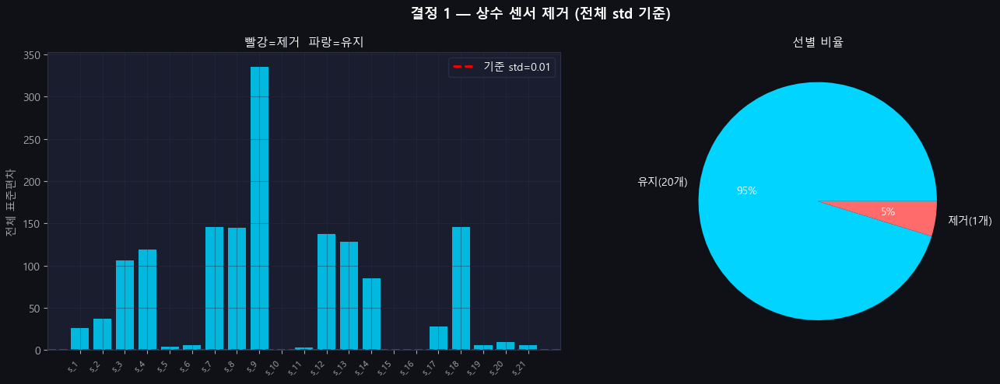


✅ 결정 1 완료: 21개 → 20개 유용 센서 유지


In [4]:
train_std     = train_raw[SENSOR_COLS].std()
const_sensors = train_std[train_std < CONST_THR].index.tolist()
USEFUL_SENSORS = sorted([s for s in SENSOR_COLS if s not in const_sensors],
                         key=lambda x: int(x.split('_')[1]))

print(f'제거 ({len(const_sensors)}개): {const_sensors}')
print(f'유지 ({len(USEFUL_SENSORS)}개): {USEFUL_SENSORS}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 1 — 상수 센서 제거 (전체 std 기준)', fontsize=13, fontweight='bold')

ax = axes[0]
colors_bar = ['#ff6b6b' if s in const_sensors else '#00d4ff' for s in SENSOR_COLS]
ax.bar(range(len(SENSOR_COLS)), train_std.values, color=colors_bar, alpha=0.85)
ax.axhline(CONST_THR, color='red', ls='--', lw=2, label=f'기준 std={CONST_THR}')
ax.set_xticks(range(len(SENSOR_COLS)))
ax.set_xticklabels(SENSOR_COLS, rotation=45, ha='right', fontsize=8)
ax.set_ylabel('전체 표준편차')
ax.set_title('빨강=제거  파랑=유지')
ax.legend()

axes[1].pie([len(USEFUL_SENSORS), len(const_sensors)],
            labels=[f'유지({len(USEFUL_SENSORS)}개)', f'제거({len(const_sensors)}개)'],
            colors=[C[0], C[1]], autopct='%1.0f%%', textprops={'color':WHITE})
axes[1].set_title('선별 비율')
plt.tight_layout(); plt.show()

KEEP = ID_COLS + OP_COLS + USEFUL_SENSORS
train_s1 = train_raw[KEEP].copy()
test_s1  = test_raw[KEEP].copy()
print(f'\n✅ 결정 1 완료: {len(SENSOR_COLS)}개 → {len(USEFUL_SENSORS)}개 유용 센서 유지')


---
## 3. [FD002 핵심] 운전 조건 클러스터링

> FD002는 고도(setting_1) · 마하수(setting_2) · TRA(setting_3) 조합으로 **6가지 운전 조건** 존재  
> 이 단계가 FD002 전처리의 핵심 — 이후 정규화·스무딩·파생변수 모두 클러스터 단위로 수행

### 3-1. 최적 클러스터 수 탐색 (Elbow + Silhouette)


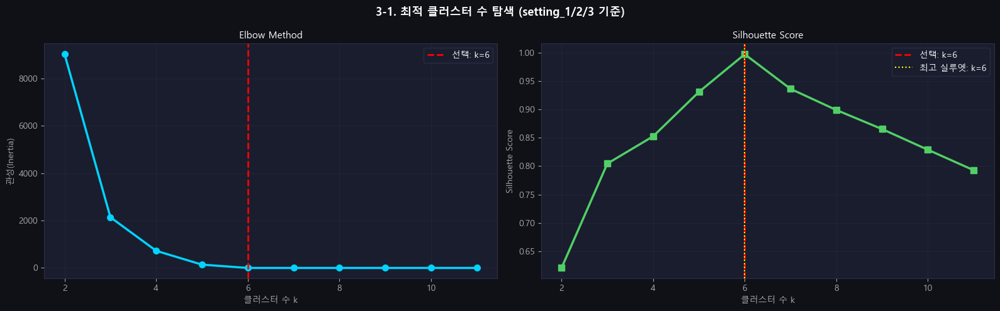

선택된 k=6  |  Silhouette=0.9970
최고 실루엣 k=6  |  score=0.9970
📌 FD002 설계 상 6개 조건이 실제로 존재 → k=6 선택 근거


In [5]:
op_data = MinMaxScaler().fit_transform(train_s1[OP_COLS])

inertias, silhouettes = [], []
K_range = range(2, 12)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=20, max_iter=300)
    labels = km.fit_predict(op_data)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(op_data, labels))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('3-1. 최적 클러스터 수 탐색 (setting_1/2/3 기준)', fontsize=13, fontweight='bold')

axes[0].plot(list(K_range), inertias, color=C[0], lw=2.5, marker='o', markersize=7)
axes[0].axvline(N_CLUSTERS, color='red', ls='--', lw=2, label=f'선택: k={N_CLUSTERS}')
axes[0].set_xlabel('클러스터 수 k'); axes[0].set_ylabel('관성(Inertia)')
axes[0].set_title('Elbow Method'); axes[0].legend()

best_k = list(K_range)[np.argmax(silhouettes)]
axes[1].plot(list(K_range), silhouettes, color=C[2], lw=2.5, marker='s', markersize=7)
axes[1].axvline(N_CLUSTERS, color='red', ls='--', lw=2, label=f'선택: k={N_CLUSTERS}')
axes[1].axvline(best_k, color='yellow', ls=':', lw=1.5, label=f'최고 실루엣: k={best_k}')
axes[1].set_xlabel('클러스터 수 k'); axes[1].set_ylabel('Silhouette Score')
axes[1].set_title('Silhouette Score'); axes[1].legend()
plt.tight_layout(); plt.show()

print(f'선택된 k={N_CLUSTERS}  |  Silhouette={silhouettes[N_CLUSTERS-2]:.4f}')
print(f'최고 실루엣 k={best_k}  |  score={max(silhouettes):.4f}')
print('📌 FD002 설계 상 6개 조건이 실제로 존재 → k=6 선택 근거')


### 3-2. KMeans 클러스터링 수행 & 3D 분포 확인

### 3-1b. 운전 조건 2D scatter pairs

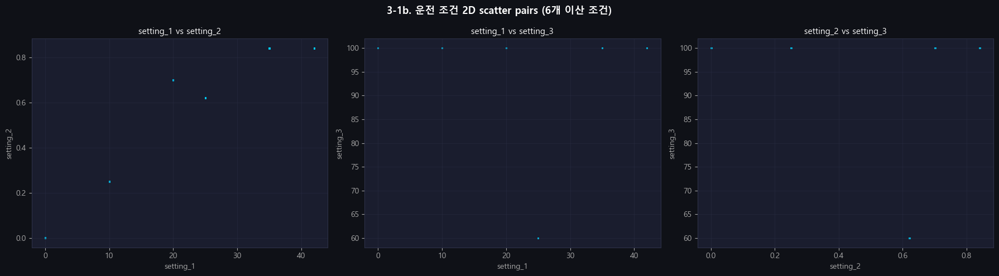

📌 각 scatter에서 6개의 이산적 점이 명확히 분리됨
   → FD002 운전 조건은 연속값이 아닌 6개 고정 조합 → k=6 설정 근거


In [6]:
# 3-1b. 운전 조건 2D scatter pairs — 6개 조건이 이산적으로 분리됨 확인
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('3-1b. 운전 조건 2D scatter pairs (6개 이산 조건)', fontsize=13, fontweight='bold')
for ax, (x, y) in zip(axes, [('setting_1','setting_2'),('setting_1','setting_3'),('setting_2','setting_3')]):
    ax.scatter(train_raw[x], train_raw[y], color=C[0], alpha=0.1, s=1)
    ax.set_xlabel(x); ax.set_ylabel(y); ax.set_title(f'{x} vs {y}')
plt.tight_layout(); plt.show()
print('📌 각 scatter에서 6개의 이산적 점이 명확히 분리됨')
print('   → FD002 운전 조건은 연속값이 아닌 6개 고정 조합 → k=6 설정 근거')

=== 클러스터별 운전 조건 프로파일 ===


,setting_1,setting_2,setting_3,row_count,비율(%)
op_cluster,,,,,
0,42.0030,0.8405,100.0,13458,25.03
1,0.0015,0.0005,100.0,8044,14.96
2,25.0030,0.6205,60.0,8002,14.88
3,20.0030,0.7005,100.0,8122,15.11
4,10.0030,0.2505,100.0,8096,15.06
5,35.0030,0.8405,100.0,8037,14.95


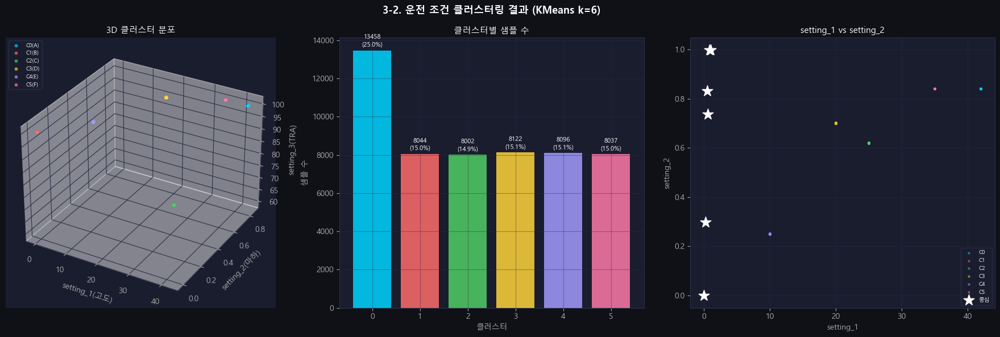

In [7]:
from mpl_toolkits.mplot3d import Axes3D

op_scaler  = MinMaxScaler()
op_train_z = op_scaler.fit_transform(train_s1[OP_COLS])
op_test_z  = op_scaler.transform(test_s1[OP_COLS])

kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=20, max_iter=300)
kmeans.fit(op_train_z)

train_s1['op_cluster'] = kmeans.labels_
test_s1['op_cluster']  = kmeans.predict(op_test_z)
train_raw['op_cluster'] = train_s1['op_cluster'].values
test_raw['op_cluster']  = test_s1['op_cluster'].values

# Cluster_Label (A~F) 추가 — EDA 시각화용
train_raw['Cluster_Label'] = train_raw['op_cluster'].map(CLUSTER_MAP)
test_raw['Cluster_Label']  = test_raw['op_cluster'].map(CLUSTER_MAP)

cluster_profile = (train_raw.groupby('op_cluster')[OP_COLS+['unit_nr']]
                   .agg({'setting_1':'mean','setting_2':'mean','setting_3':'mean','unit_nr':'count'})
                   .rename(columns={'unit_nr':'row_count'}))
cluster_profile['비율(%)'] = (cluster_profile['row_count']/len(train_raw)*100).round(2)
print('=== 클러스터별 운전 조건 프로파일 ===')
display(cluster_profile.round(4))

fig = plt.figure(figsize=(18, 6))
fig.suptitle('3-2. 운전 조건 클러스터링 결과 (KMeans k=6)', fontsize=13, fontweight='bold')

ax3d = fig.add_subplot(131, projection='3d')
sample = train_raw.sample(min(3000,len(train_raw)), random_state=42)
for c in range(N_CLUSTERS):
    m = sample['op_cluster']==c
    ax3d.scatter(sample.loc[m,'setting_1'],sample.loc[m,'setting_2'],sample.loc[m,'setting_3'],
                 c=CLUSTER_COLORS[c], s=10, alpha=0.6, label=f'C{c}({CLUSTER_MAP[c]})')
ax3d.set_xlabel('setting_1(고도)'); ax3d.set_ylabel('setting_2(마하)'); ax3d.set_zlabel('setting_3(TRA)')
ax3d.set_title('3D 클러스터 분포'); ax3d.legend(fontsize=7, loc='upper left')

ax2 = fig.add_subplot(132)
counts = train_raw['op_cluster'].value_counts().sort_index()
bars = ax2.bar(counts.index, counts.values,
               color=[CLUSTER_COLORS[i] for i in counts.index], alpha=0.85)
ax2.set_xlabel('클러스터'); ax2.set_ylabel('샘플 수')
ax2.set_title('클러스터별 샘플 수')
for bar,v in zip(bars, counts.values):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+200,
             f'{v}\n({v/len(train_raw)*100:.1f}%)', ha='center', fontsize=8)

ax3 = fig.add_subplot(133)
for c in range(N_CLUSTERS):
    m = train_raw['op_cluster']==c
    ax3.scatter(train_raw.loc[m,'setting_1'],train_raw.loc[m,'setting_2'],
                c=CLUSTER_COLORS[c], s=5, alpha=0.4, label=f'C{c}')
centers = kmeans.cluster_centers_
ax3.scatter(centers[:,0],centers[:,1], c='white', s=200, marker='*', zorder=5, label='중심')
ax3.set_xlabel('setting_1'); ax3.set_ylabel('setting_2')
ax3.set_title('setting_1 vs setting_2'); ax3.legend(fontsize=7)
plt.tight_layout(); plt.show()


### 3-3. 클러스터 일관성 검증 (Chi-square) & Train/Test 비율 비교

=== 엔진별 운전 조건 다양성 ===
  엔진당 평균 조건 수: 6.00
  6가지 조건 모두 경험한 엔진: 260대


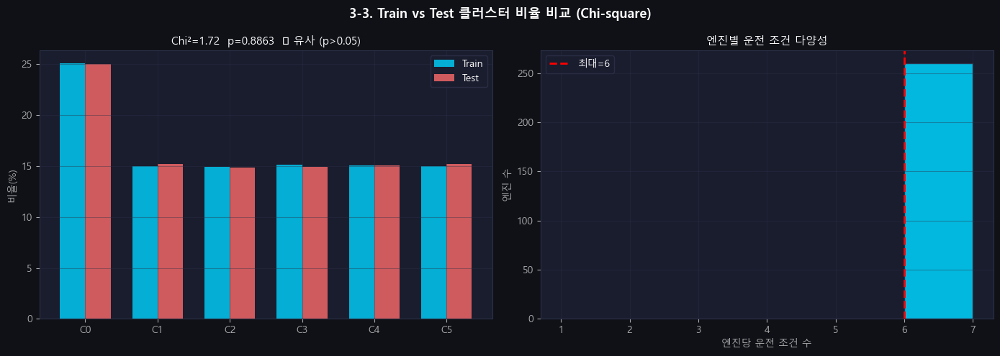


판정: ✅ 유사 (p>0.05)


In [8]:
cluster_per_unit = train_raw.groupby('unit_nr')['op_cluster'].nunique()
print('=== 엔진별 운전 조건 다양성 ===')
print(f'  엔진당 평균 조건 수: {cluster_per_unit.mean():.2f}')
print(f'  6가지 조건 모두 경험한 엔진: {(cluster_per_unit==N_CLUSTERS).sum()}대')

train_counts = train_raw['op_cluster'].value_counts().sort_index()
test_counts  = test_raw['op_cluster'].value_counts().sort_index()
chi2_stat, chi2_p, dof, _ = chi2_contingency(np.array([train_counts.values, test_counts.values]))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('3-3. Train vs Test 클러스터 비율 비교 (Chi-square)', fontsize=13, fontweight='bold')

x = np.arange(N_CLUSTERS); width = 0.35
train_pct = train_counts.values/train_counts.sum()*100
test_pct  = test_counts.values/test_counts.sum()*100
axes[0].bar(x-width/2, train_pct, width, color=C[0], alpha=0.8, label='Train')
axes[0].bar(x+width/2, test_pct,  width, color=C[1], alpha=0.8, label='Test')
axes[0].set_xticks(x); axes[0].set_xticklabels([f'C{i}' for i in range(N_CLUSTERS)])
axes[0].set_ylabel('비율(%)'); axes[0].legend()
verdict = '✅ 유사 (p>0.05)' if chi2_p>0.05 else '⚠️ 차이 있음 (p≤0.05)'
axes[0].set_title(f'Chi²={chi2_stat:.2f}  p={chi2_p:.4f}  {verdict}')

axes[1].hist(cluster_per_unit, bins=range(1,N_CLUSTERS+2), color=C[0], alpha=0.85, edgecolor=GRID)
axes[1].axvline(N_CLUSTERS, color='red', ls='--', lw=2, label=f'최대={N_CLUSTERS}')
axes[1].set_xlabel('엔진당 운전 조건 수'); axes[1].set_ylabel('엔진 수')
axes[1].set_title('엔진별 운전 조건 다양성'); axes[1].legend()
plt.tight_layout(); plt.show()
print(f'\n판정: {verdict}')


### 3-3b. 클러스터링 효과 — 노이즈 감소율 [EDA 고유]

In [9]:
# 3-3b. 클러스터링 효과 검증 — 운전 조건 노이즈 감소율 [EDA 고유]
print('=== 3-3b. 클러스터링 노이즈 감소율 (setting별) ===')
for op in OP_COLS:
    raw_std     = train_raw[op].std()
    cluster_std = train_raw.groupby('op_cluster')[op].std().mean()
    reduction   = (raw_std - cluster_std) / raw_std * 100
    print(f'  {op}: 전체 std={raw_std:.4f} → 클러스터 내 평균 std={cluster_std:.4f}  감소율={reduction:.1f}%')

print()
print('📌 감소율이 클수록 클러스터링이 해당 조건을 잘 분리함')
print('   → 전체 분산 대비 클러스터 내 분산이 작을수록 클러스터 품질 높음')


=== 3-3b. 클러스터링 노이즈 감소율 (setting별) ===
  setting_1: 전체 std=14.7474 → 클러스터 내 평균 std=0.0026  감소율=100.0%
  setting_2: 전체 std=0.3100 → 클러스터 내 평균 std=0.0006  감소율=99.8%
  setting_3: 전체 std=14.2377 → 클러스터 내 평균 std=0.0000  감소율=100.0%

📌 감소율이 클수록 클러스터링이 해당 조건을 잘 분리함
   → 전체 분산 대비 클러스터 내 분산이 작을수록 클러스터 품질 높음


### 3-4. 클러스터 전이 행렬 & 거주 시간 [EXTRA-A]

=== 3-4. 클러스터 전이 / 거주 시간 ===


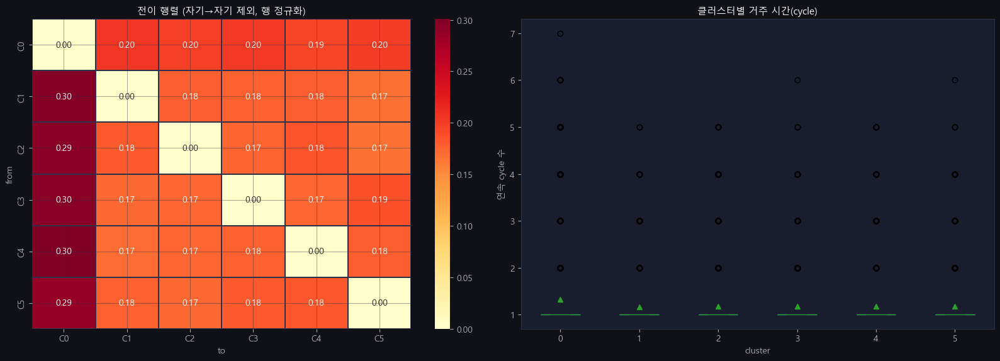


클러스터별 평균 거주 시간:
         mean  median  max
cluster                   
0         1.3     1.0    7
1         1.2     1.0    5
2         1.2     1.0    5
3         1.2     1.0    6
4         1.2     1.0    5
5         1.2     1.0    6

📌 평균 거주 시간이 window size(20) 설정 근거


In [10]:
print('=== 3-4. 클러스터 전이 / 거주 시간 ===')

trans = np.zeros((N_CLUSTERS, N_CLUSTERS), dtype=int)
dwell_times = []
for uid in train_raw['unit_nr'].unique():
    seq = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')['op_cluster'].values
    for a,b in zip(seq[:-1], seq[1:]): trans[a,b] += 1
    rl = 1
    for k in range(1, len(seq)):
        if seq[k]==seq[k-1]: rl += 1
        else: dwell_times.append((seq[k-1],rl)); rl=1
    dwell_times.append((seq[-1],rl))

dwell_df = pd.DataFrame(dwell_times, columns=['cluster','cycles'])

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('3-4. 클러스터 전이 행렬 & 거주 시간', fontsize=13, fontweight='bold')

trans_off = trans.copy().astype(float); np.fill_diagonal(trans_off, 0)
trans_norm = trans_off / np.maximum(trans_off.sum(axis=1,keepdims=True), 1)
sns.heatmap(trans_norm, ax=axes[0], cmap='YlOrRd', annot=True, fmt='.2f',
            xticklabels=[f'C{i}' for i in range(N_CLUSTERS)],
            yticklabels=[f'C{i}' for i in range(N_CLUSTERS)],
            linewidths=0.3, linecolor=GRID)
axes[0].set_title('전이 행렬 (자기→자기 제외, 행 정규화)')
axes[0].set_xlabel('to'); axes[0].set_ylabel('from')

dwell_df.boxplot(column='cycles', by='cluster', ax=axes[1], grid=False, patch_artist=True, showmeans=True)
axes[1].set_title('클러스터별 거주 시간(cycle)')
axes[1].set_xlabel('cluster'); axes[1].set_ylabel('연속 cycle 수')
plt.suptitle('')
plt.tight_layout(); plt.show()

print('\n클러스터별 평균 거주 시간:')
print(dwell_df.groupby('cluster')['cycles'].agg(['mean','median','max']).round(1))
print('\n📌 평균 거주 시간이 window size(20) 설정 근거')


### 3-5. 엔진별 cluster 비중 ↔ 수명 상관 [EXTRA-B]

=== 3-5. 엔진별 cluster 비중 vs 수명 (Spearman) ===


'cluster  spearman_r  p-value     판정\n     C0       0.100   0.1070 비유의 ⚠️\n     C1      -0.023   0.7117 비유의 ⚠️\n     C2       0.005   0.9361 비유의 ⚠️\n     C3       0.005   0.9331 비유의 ⚠️\n     C4      -0.011   0.8582 비유의 ⚠️\n     C5      -0.088   0.1577 비유의 ⚠️'

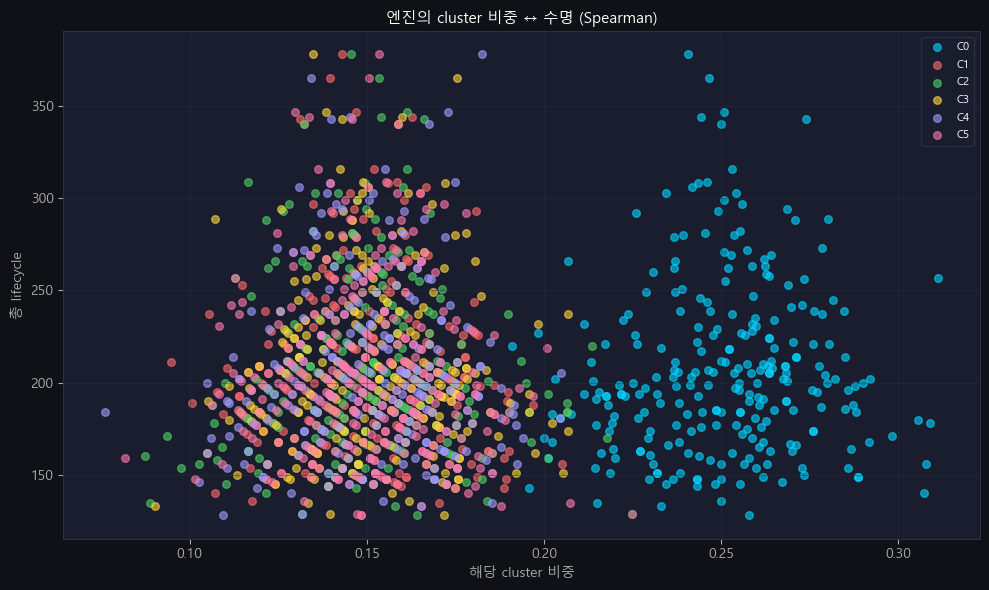

In [11]:
print('=== 3-5. 엔진별 cluster 비중 vs 수명 (Spearman) ===')

mc = train_raw.groupby('unit_nr')['time_cycles'].max().rename('lifecycle')
mix = (train_raw.groupby(['unit_nr','op_cluster']).size().unstack(fill_value=0))
mix = mix.div(mix.sum(axis=1), axis=0)
mix.columns = [f'C{c}_pct' for c in mix.columns]
mix = mix.join(mc)

rows = []
for c in range(N_CLUSTERS):
    col = f'C{c}_pct'
    if col not in mix.columns: continue
    r, p = spearmanr(mix[col], mix['lifecycle'])
    rows.append({'cluster':f'C{c}','spearman_r':round(r,3),'p-value':round(p,4),
                 '판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})
display(pd.DataFrame(rows).to_string(index=False))

fig, ax = plt.subplots(figsize=(10, 6))
for c in range(N_CLUSTERS):
    col = f'C{c}_pct'
    if col not in mix.columns: continue
    ax.scatter(mix[col], mix['lifecycle'], color=CLUSTER_COLORS[c], alpha=0.6, s=30, label=f'C{c}')
ax.set_xlabel('해당 cluster 비중'); ax.set_ylabel('총 lifecycle')
ax.set_title('엔진의 cluster 비중 ↔ 수명 (Spearman)')
ax.legend(fontsize=8)
plt.tight_layout(); plt.show()


---
## 4. 전처리 전 EDA
### 4-1. 기초 통계 & 데이터 품질

In [12]:
print('=== 기초 통계 & 데이터 품질 검사 ===')
quality = pd.DataFrame({
    '구분':['Train','Test'],
    '전체 행':[len(train_raw),len(test_raw)],
    '결측치':[train_raw.isnull().sum().sum(),test_raw.isnull().sum().sum()],
    '중복 행':[train_raw.duplicated().sum(),test_raw.duplicated().sum()],
    '음수 센서':[(train_raw[SENSOR_COLS]<0).sum().sum(),(test_raw[SENSOR_COLS]<0).sum().sum()],
    '엔진 수':[train_raw['unit_nr'].nunique(),test_raw['unit_nr'].nunique()],
    '운전 조건':[train_raw['op_cluster'].nunique(),test_raw['op_cluster'].nunique()],
}).set_index('구분')
display(quality)

desc = train_raw[SENSOR_COLS].describe().T
desc['CV(변동계수)'] = (desc['std']/desc['mean'].abs()).round(5)
print('\n--- 센서별 기술통계 (Train 전체) ---')
display(desc[['mean','std','min','max','CV(변동계수)']].style
        .background_gradient(subset=['CV(변동계수)'],cmap='YlOrRd').format('{:.4f}'))
print('\n📌 FD002: 운전 조건 6가지 혼재로 CV가 FD001보다 높게 나타남 → 조건 영향 포함')


=== 기초 통계 & 데이터 품질 검사 ===


,전체 행,결측치,중복 행,음수 센서,엔진 수,운전 조건
구분,,,,,,
Train,53759,0,0,0,260,6
Test,33991,0,0,0,259,6



--- 센서별 기술통계 (Train 전체) ---


,mean,std,min,max,CV(변동계수)
s_1,472.9102,26.3897,445.0000,518.6700,0.0558
s_2,579.6724,37.2894,535.5300,644.5200,0.0643
s_3,1419.9710,105.9463,1243.7300,1612.8800,0.0746
s_4,1205.4420,119.1234,1023.7700,1439.2300,0.0988
s_5,8.0320,3.6138,3.9100,14.6200,0.4499
s_6,11.6007,5.4318,5.7100,21.6100,0.4682
s_7,282.6068,146.0053,136.8000,555.8200,0.5166
s_8,2228.8792,145.2098,1914.7700,2388.3900,0.0651
s_9,8525.2008,335.8120,7985.5600,9215.6600,0.0394
s_10,1.0950,0.1275,0.9300,1.3000,0.1164



📌 FD002: 운전 조건 6가지 혼재로 CV가 FD001보다 높게 나타남 → 조건 영향 포함


### 📊 기초 통계 & 데이터 품질 결과
- 결측치·중복·음수 모두 0 ✅ — C-MAPSS 시뮬레이션 데이터  
- FD002: CV가 FD001보다 높음 → 조건 영향 포함된 값  
- **s_18**: CV≈0 → 열화 정보 없음 → 제거 대상

### 4-2. 엔진 수명 분포

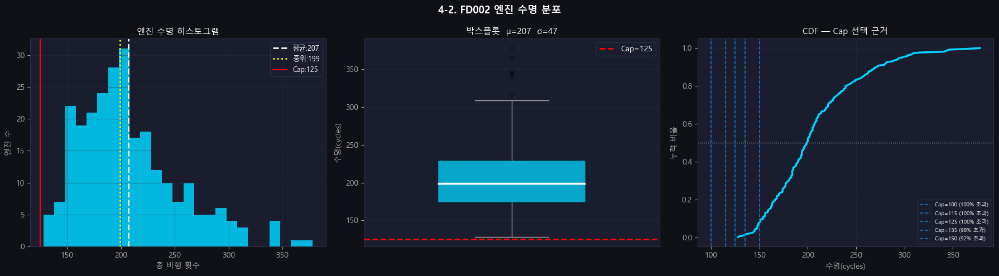

평균=206.8  중위=199.0  min=128  max=378
  Cap=115: 초과 엔진 100.0%
  Cap=120: 초과 엔진 100.0%
  Cap=125: 초과 엔진 100.0%
  Cap=130: 초과 엔진 99.2%
  Cap=135: 초과 엔진 98.5%


In [13]:
lifecycles = train_raw.groupby('unit_nr')['time_cycles'].max()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('4-2. FD002 엔진 수명 분포', fontsize=13, fontweight='bold')

ax = axes[0]
ax.hist(lifecycles, bins=25, color=C[0], alpha=0.85, edgecolor='none')
ax.axvline(lifecycles.mean(),   color='white', ls='--', lw=2, label=f'평균:{lifecycles.mean():.0f}')
ax.axvline(lifecycles.median(), color='yellow',ls=':',  lw=2, label=f'중위:{lifecycles.median():.0f}')
ax.axvline(RUL_CAP, color='red', ls='-', lw=1.5, label=f'Cap:{RUL_CAP}')
ax.set_xlabel('총 비행 횟수'); ax.set_ylabel('엔진 수')
ax.set_title('엔진 수명 히스토그램'); ax.legend(fontsize=9)

ax = axes[1]
bp = ax.boxplot(lifecycles, patch_artist=True, vert=True, widths=0.5,
                medianprops=dict(color='white',lw=2.5),
                whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                flierprops=dict(marker='o',color=GRAY,markersize=4,alpha=0.5))
bp['boxes'][0].set_facecolor(C[0]); bp['boxes'][0].set_alpha(0.75)
ax.axhline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.set_ylabel('수명(cycles)')
ax.set_title(f'박스플롯  μ={lifecycles.mean():.0f}  σ={lifecycles.std():.0f}')
ax.set_xticks([]); ax.legend()

ax = axes[2]
lc_sorted = np.sort(lifecycles)
cdf = np.arange(1,len(lc_sorted)+1)/len(lc_sorted)
ax.plot(lc_sorted, cdf, color=C[0], lw=2.5)
for cap in [100,115,125,135,150]:
    pct = (lifecycles<=cap).mean()
    ax.axvline(cap, ls='--', lw=1.2, label=f'Cap={cap} ({(1-pct)*100:.0f}% 초과)')
ax.axhline(0.5, color=GRAY, ls=':', lw=1)
ax.set_xlabel('수명(cycles)'); ax.set_ylabel('누적 비율')
ax.set_title('CDF — Cap 선택 근거'); ax.legend(fontsize=7)
plt.tight_layout(); plt.show()

print(f'평균={lifecycles.mean():.1f}  중위={lifecycles.median():.1f}  min={lifecycles.min()}  max={lifecycles.max()}')
for cap in [115,120,125,130,135]:
    print(f'  Cap={cap}: 초과 엔진 {(lifecycles>cap).mean()*100:.1f}%')


### 4-3. 클러스터별 운전 조건 분포 [FD002 전용]

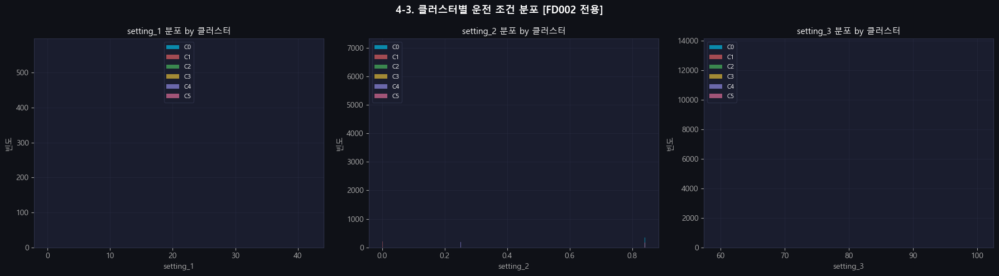

--- 클러스터 내 운전 조건 표준편차 (작을수록 품질 좋음) ---


,setting_1,setting_2,setting_3
op_cluster,,,
0,0.00291,0.00064,0.0
1,0.00087,0.00065,0.0
2,0.00288,0.00065,0.0
3,0.00289,0.00066,0.0
4,0.00290,0.00064,0.0
5,0.00288,0.00065,0.0


In [14]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('4-3. 클러스터별 운전 조건 분포 [FD002 전용]', fontsize=13, fontweight='bold')

for ax, op in zip(axes, OP_COLS):
    for c in range(N_CLUSTERS):
        m = train_raw['op_cluster']==c
        ax.hist(train_raw.loc[m,op], bins=30, alpha=0.6, color=CLUSTER_COLORS[c], label=f'C{c}', edgecolor='none')
    ax.set_title(f'{op} 분포 by 클러스터')
    ax.set_xlabel(op); ax.set_ylabel('빈도'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

print('--- 클러스터 내 운전 조건 표준편차 (작을수록 품질 좋음) ---')
display(train_raw.groupby('op_cluster')[OP_COLS].std().round(5))


### 4-4. 센서 분포 & 이상치 (전처리 전 — 21개 전체)

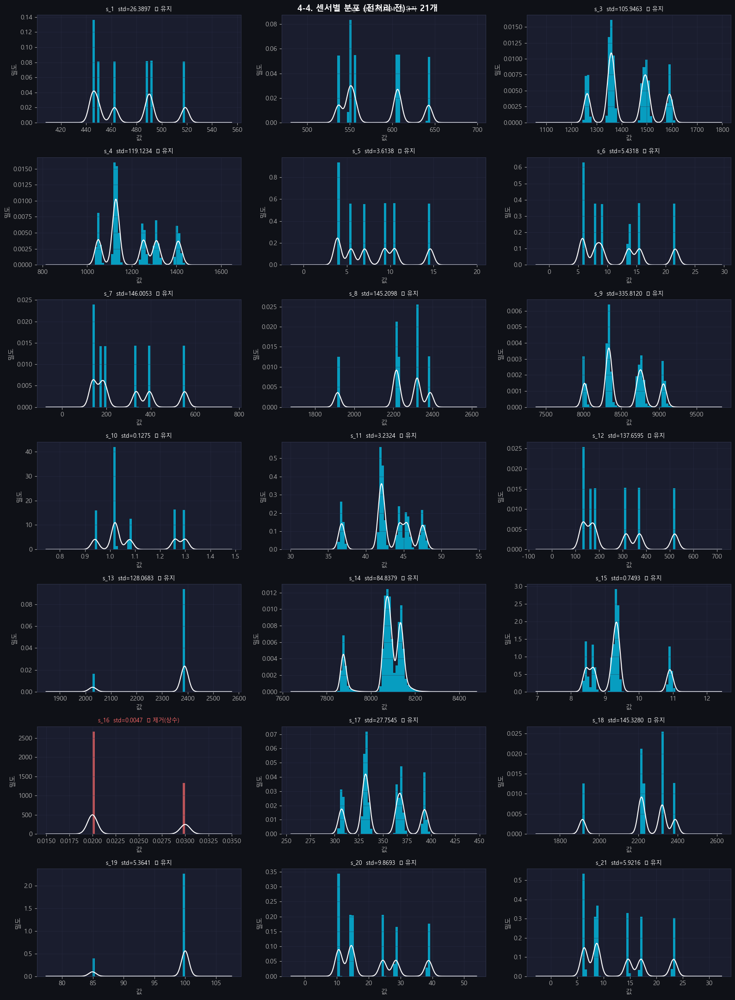

📌 FD002: 대부분 센서가 멀티모달 분포 → 운전 조건 6개가 분포에 반영
         이상치로 보이는 값들도 다른 운전 조건의 정상값일 가능성 높음


,센서,이상치 수,비율(%)
7,s_8,8002,14.885
10,s_11,3433,6.386
12,s_13,9640,17.932
13,s_14,8049,14.972
14,s_15,8002,14.885
17,s_18,8002,14.885
18,s_19,8002,14.885


In [15]:
fig, axes = plt.subplots(7, 3, figsize=(16, 22))
fig.suptitle('4-4. 센서별 분포 (전처리 전) — 21개', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, SENSOR_COLS):
    data = train_raw[s].dropna()
    std_val = data.std()
    is_const = std_val < CONST_THR
    color = C[1] if is_const else C[0]
    ax.hist(data, bins=40, color=color, alpha=0.7, density=True, edgecolor='none')
    try: data.plot.kde(ax=ax, color='white', lw=1.5)
    except: pass
    label = '❌ 제거(상수)' if is_const else '✅ 유지'
    ax.set_title(f'{s}  std={std_val:.4f}  {label}', fontsize=9,
                 color=C[1] if is_const else WHITE)
    ax.set_xlabel('값'); ax.set_ylabel('밀도')
for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

print('📌 FD002: 대부분 센서가 멀티모달 분포 → 운전 조건 6개가 분포에 반영')
print('         이상치로 보이는 값들도 다른 운전 조건의 정상값일 가능성 높음')

outlier_rows = []
for s in SENSOR_COLS:
    Q1,Q3 = train_raw[s].quantile(0.25),train_raw[s].quantile(0.75)
    IQR = Q3-Q1
    n_out = ((train_raw[s]<Q1-1.5*IQR)|(train_raw[s]>Q3+1.5*IQR)).sum()
    outlier_rows.append({'센서':s,'이상치 수':n_out,'비율(%)':round(n_out/len(train_raw)*100,3)})
nonzero = pd.DataFrame(outlier_rows)
nonzero = nonzero[nonzero['이상치 수']>0]
if len(nonzero): display(nonzero)


### 📊 4-4. 센서 분포 & 이상치 결과 정리
- 제거 센서: **`s_18` 1개** (std≈0) — FD001(7개 제거)과 달리 1개만 제거  
- **멀티모달 분포** → 운전 조건 6가지가 분포에 그대로 반영됨  
- IQR 이상치 → 다른 조건의 정상값 오탐 → **제거 불필요, 클러스터별 정규화로 해결**

### 4-5. 클러스터별 센서 분포 박스플롯 [FD002 전용, EDA 고유]

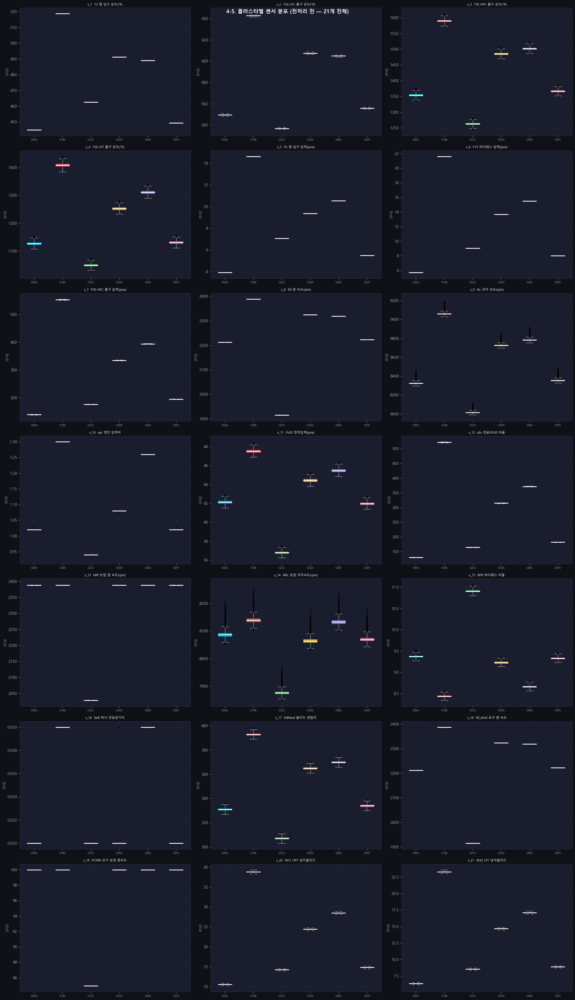

조건 영향 큰 순서 (상위 10개):


,센서,클러스터 간 평균 std
8,s_9,347.1988
17,s_18,153.4703
7,s_8,153.3437
6,s_7,145.4679
11,s_12,137.1814
12,s_13,134.0922
3,s_4,122.4616
2,s_3,109.2866
13,s_14,87.7808
1,s_2,37.9078



📌 값이 클수록 클러스터별 정규화 효과가 큼


In [16]:
# EDA 노트북 고유: Cluster_Label(A~F) 기반 박스플롯
fig, axes = plt.subplots(7, 3, figsize=(20, 35))
fig.suptitle('4-5. 클러스터별 센서 분포 (전처리 전 — 21개 전체)', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, SENSOR_COLS):
    data_by_cluster = [train_raw[train_raw['op_cluster']==c][s].values for c in range(N_CLUSTERS)]
    bp = ax.boxplot(data_by_cluster, patch_artist=True,
                    medianprops=dict(color='white',lw=2),
                    whiskerprops=dict(color=GRAY), capprops=dict(color=GRAY),
                    flierprops=dict(marker='o',color=GRAY,markersize=2,alpha=0.3))
    for patch, color in zip(bp['boxes'], CLUSTER_COLORS[:N_CLUSTERS]):
        patch.set_facecolor(color); patch.set_alpha(0.75)
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")[:20]}', fontsize=8)
    ax.set_xticklabels([f'C{c}({CLUSTER_MAP[c]})' for c in range(N_CLUSTERS)], fontsize=7)
    ax.set_ylabel('센서값', fontsize=7)

for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

# 클러스터 간 분포 차이 정량화 (클러스터별 평균의 std)
diff_rows = []
for s in SENSOR_COLS:
    cluster_means = [train_raw[train_raw['op_cluster']==c][s].mean() for c in range(N_CLUSTERS)]
    diff_rows.append({'센서':s,'클러스터 간 평균 std':round(np.std(cluster_means),4)})
diff_df = pd.DataFrame(diff_rows).sort_values('클러스터 간 평균 std', ascending=False)
print('조건 영향 큰 순서 (상위 10개):')
display(diff_df.head(10))
print('\n📌 값이 클수록 클러스터별 정규화 효과가 큼')


### 4-6. 클러스터별 센서 KDE 비교 + Kruskal-Wallis 검정

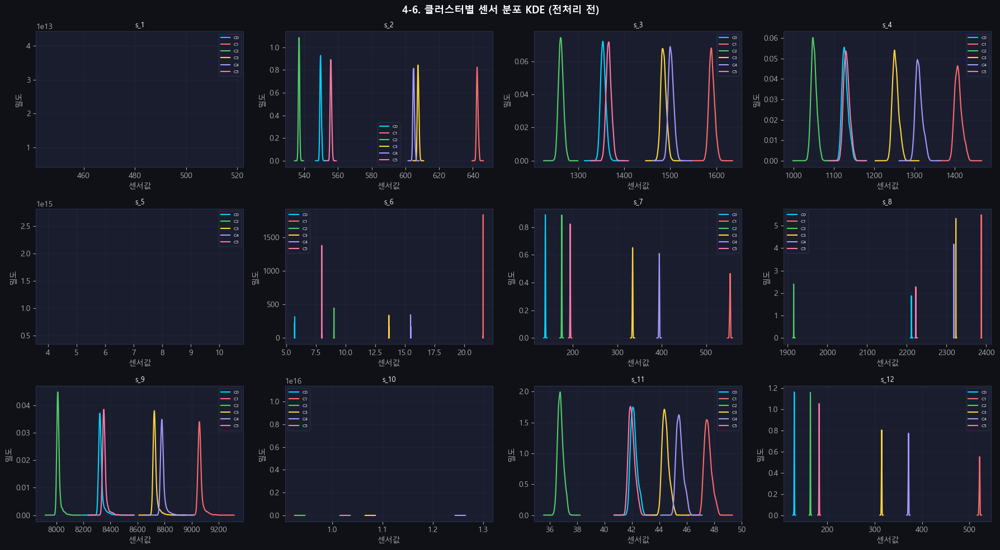

--- Kruskal-Wallis + BH-FDR: 클러스터 간 센서 분포 차이 ---


,센서,H통계량,p-value,p_adj_BH,판정_BH
0,s_1,53758.00,0.0,0.0,✅ 조건간 차이 유의
1,s_2,52008.65,0.0,0.0,✅ 조건간 차이 유의
2,s_3,51346.24,0.0,0.0,✅ 조건간 차이 유의
3,s_4,49791.51,0.0,0.0,✅ 조건간 차이 유의
4,s_5,53758.00,0.0,0.0,✅ 조건간 차이 유의
5,s_6,52765.83,0.0,0.0,✅ 조건간 차이 유의
6,s_7,52008.66,0.0,0.0,✅ 조건간 차이 유의
7,s_8,52009.68,0.0,0.0,✅ 조건간 차이 유의
8,s_9,51181.76,0.0,0.0,✅ 조건간 차이 유의
9,s_10,53327.29,0.0,0.0,✅ 조건간 차이 유의



BH-FDR 기준 유의 센서: 21/21개
📌 대부분 유의 → 클러스터별 정규화 반드시 필요


In [17]:
show_sensors_kde = SENSOR_COLS[:12]
fig, axes = plt.subplots(3, 4, figsize=(18, 10))
fig.suptitle('4-6. 클러스터별 센서 분포 KDE (전처리 전)', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, show_sensors_kde):
    for c in range(N_CLUSTERS):
        m = train_raw['op_cluster']==c
        data = train_raw.loc[m,s].dropna()
        if len(data)>1:
            try: data.plot.kde(ax=ax, color=CLUSTER_COLORS[c], lw=1.5, label=f'C{c}')
            except: pass
    ax.set_title(s,fontsize=9); ax.set_xlabel('센서값'); ax.set_ylabel('밀도')
    ax.legend(fontsize=6)
for ax in axes.flat[len(show_sensors_kde):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

# Kruskal-Wallis 검정 + BH-FDR 보정
print('--- Kruskal-Wallis + BH-FDR: 클러스터 간 센서 분포 차이 ---')
kw_rows = []
for s in SENSOR_COLS:
    groups = [train_raw[train_raw['op_cluster']==c][s].dropna().values for c in range(N_CLUSTERS)]
    groups = [g for g in groups if len(g)>1]
    h_stat, p_val = kruskal(*groups) if len(groups)>=2 else (np.nan, np.nan)
    kw_rows.append({'센서':s,'H통계량':round(h_stat,2) if np.isfinite(h_stat) else np.nan,
                    'p-value':round(p_val,4) if np.isfinite(p_val) else np.nan})
kw_df = pd.DataFrame(kw_rows)
_pvals = kw_df['p-value'].fillna(1.0).values
_rej, _padj, *_ = multipletests(_pvals, alpha=0.05, method='fdr_bh')
kw_df['p_adj_BH'] = np.round(_padj,4)
kw_df['판정_BH']  = ['✅ 조건간 차이 유의' if r else '⚠️ 비유의' for r in _rej]
display(kw_df)
print(f"\nBH-FDR 기준 유의 센서: {sum(_rej)}/{len(kw_df)}개")
print('📌 대부분 유의 → 클러스터별 정규화 반드시 필요')


### 4-7. 센서 간 상관관계 히트맵 (전처리 전)

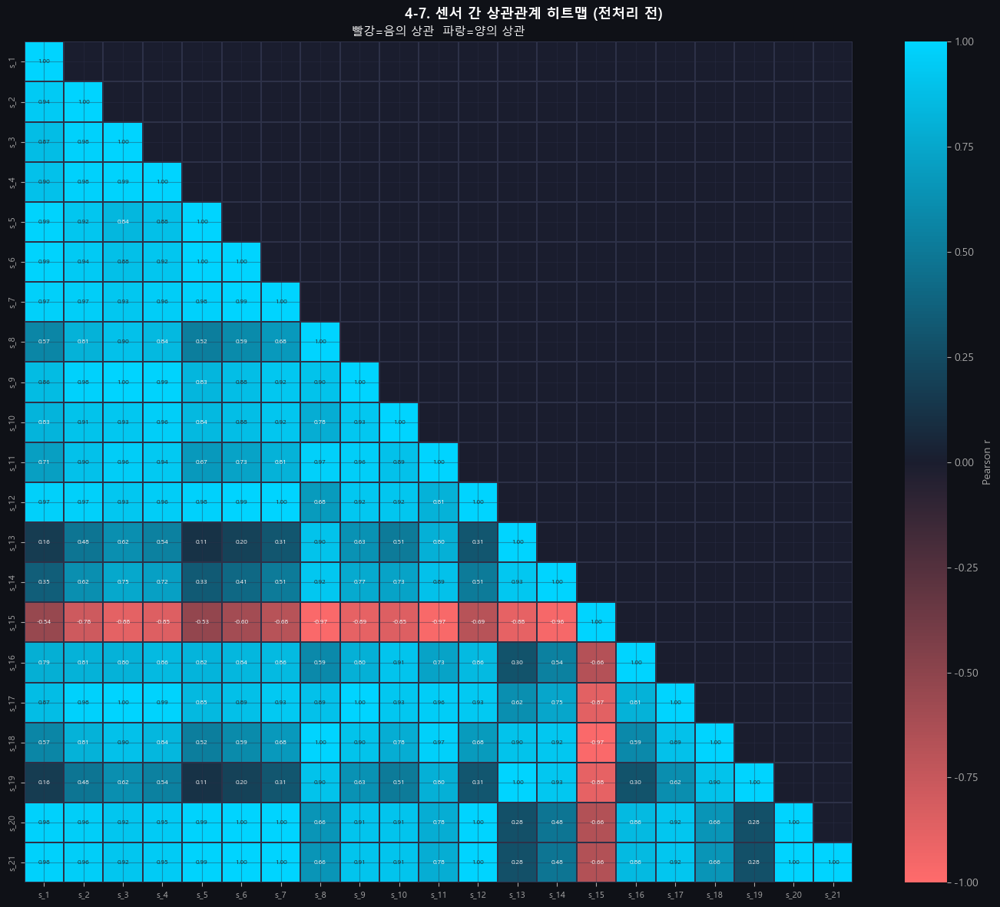

고상관 쌍 (|r|>0.9): 87개
📌 FD002: 운전 조건 6개 공변동으로 고상관 쌍이 FD001보다 훨씬 많음


,0,1,2
0,s_1,s_2,0.944
1,s_1,s_5,0.986
2,s_1,s_6,0.986
3,s_1,s_7,0.973
4,s_1,s_12,0.973
5,s_1,s_20,0.978
6,s_1,s_21,0.978
7,s_2,s_3,0.982
8,s_2,s_4,0.981
9,s_2,s_5,0.916


In [18]:
corr_before = train_raw[SENSOR_COLS].corr()
fig, ax = plt.subplots(figsize=(14, 12))
fig.suptitle('4-7. 센서 간 상관관계 히트맵 (전처리 전)', fontsize=13, fontweight='bold')
mask = np.triu(np.ones_like(corr_before, dtype=bool), k=1)
sns.heatmap(corr_before, ax=ax, mask=mask, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':6},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
ax.set_title('빨강=음의 상관  파랑=양의 상관')
ax.tick_params(labelsize=8)
plt.tight_layout(); plt.show()

pairs = [(SENSOR_COLS[i],SENSOR_COLS[j],round(corr_before.iloc[i,j],3))
         for i in range(len(SENSOR_COLS)) for j in range(i+1,len(SENSOR_COLS))
         if abs(corr_before.iloc[i,j])>0.9]
print(f'고상관 쌍 (|r|>0.9): {len(pairs)}개')
print('📌 FD002: 운전 조건 6개 공변동으로 고상관 쌍이 FD001보다 훨씬 많음')
if pairs: display(pd.DataFrame(pairs).head(10))


### 📊 4-7. 센서 상관관계 결과 정리
- **고상관 쌍(|r|>0.9): 87개** → FD001보다 훨씬 많음  
- 원인: 조건 변화 시 온도·압력·속도 센서 **조건 공변동**  
- → 클러스터별 정규화 후 조건 영향 제거 시 상관관계가 낮아질 것으로 예상

### 4-8. 센서별 열화 트렌드 (클러스터별 r 평균 기준)

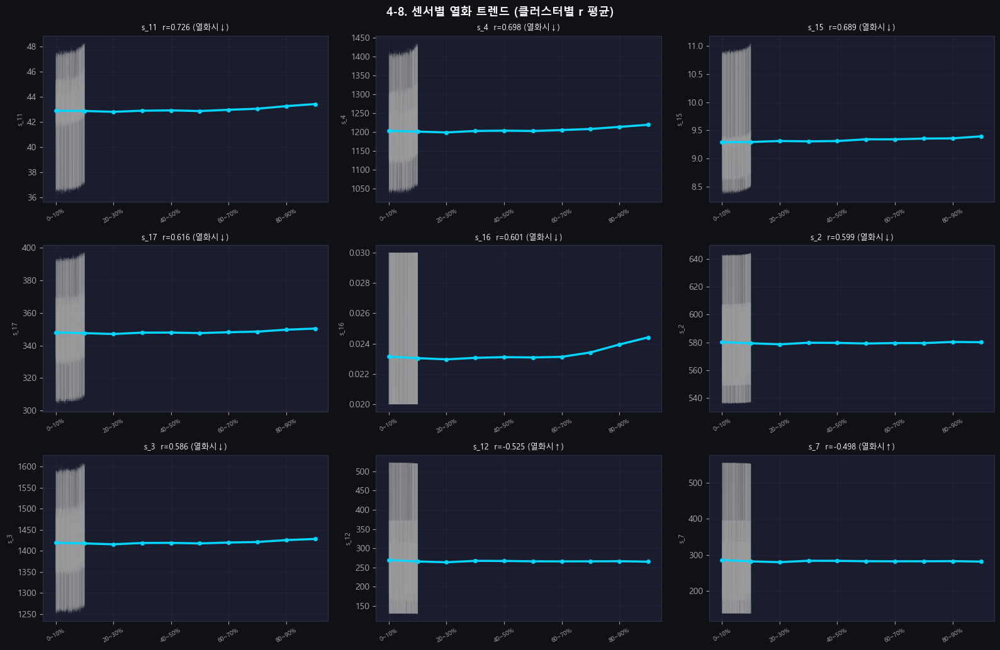

📌 FD002: 클러스터별 r 평균으로 조건 혼재 효과 제거 후 계산


In [19]:
tr_trend = train_raw.copy()
mc = tr_trend.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_trend = tr_trend.join(mc, on='unit_nr')
tr_trend['norm_life'] = tr_trend['time_cycles']/tr_trend['max_c']
tr_trend['RUL']       = tr_trend['max_c'] - tr_trend['time_cycles']

bins   = np.linspace(0,1,11)
labels = [f'{int(a*100)}~{int(b*100)}%' for a,b in zip(bins[:-1],bins[1:])]
tr_trend['life_bin'] = pd.cut(tr_trend['norm_life'], bins=bins, labels=labels)
trend_mean = tr_trend.groupby('life_bin', observed=True)[SENSOR_COLS].mean()

# [FD002 수정] 클러스터별 r 계산 후 평균 (조건 혼재 효과 제거)
cluster_corrs = []
for c in range(N_CLUSTERS):
    mask = tr_trend['op_cluster']==c
    sub  = tr_trend[mask]
    if len(sub)>10:
        corr_c = sub[SENSOR_COLS+['norm_life']].corr()['norm_life'][SENSOR_COLS]
        cluster_corrs.append(corr_c)
corr_with_life = pd.concat(cluster_corrs, axis=1).mean(axis=1)

trend_sensors = corr_with_life[corr_with_life.abs()>0.1].sort_values(key=abs, ascending=False).index.tolist()
if not trend_sensors:
    trend_sensors = corr_with_life.abs().sort_values(ascending=False).index.tolist()
    print('⚠️ FD002: 조건 혼재로 r<0.1인 센서가 많음 → 절댓값 상위로 강제 선택')
trend_sensors = trend_sensors[:9]

n_cols = 3; n_rows = (len(trend_sensors)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*3.5))
fig.suptitle('4-8. 센서별 열화 트렌드 (클러스터별 r 평균)', fontsize=13, fontweight='bold')
x_pos = range(len(labels))
sample_units = tr_trend['unit_nr'].unique()[:15]
axes_list = list(np.array(axes).flat)
for ax, s in zip(axes_list, trend_sensors):
    for u in sample_units:
        sub = tr_trend[tr_trend['unit_nr']==u].sort_values('norm_life')
        ax.plot(sub['norm_life'], sub[s], color=GRAY, alpha=0.15, lw=0.6)
    ax.plot(x_pos, trend_mean[s].values, color=C[0], lw=2.5, marker='o', markersize=4)
    r = corr_with_life[s]
    ax.set_title(f'{s}  r={r:.3f} ({"열화시↑" if r<0 else "열화시↓"})', fontsize=9)
    ax.set_xticks(x_pos[::2]); ax.set_xticklabels(labels[::2], rotation=30, fontsize=7)
    ax.set_ylabel(s, fontsize=8)
for ax in axes_list[len(trend_sensors):]: ax.set_visible(False)
plt.tight_layout(); plt.show()
print('📌 FD002: 클러스터별 r 평균으로 조건 혼재 효과 제거 후 계산')


### 📊 4-8. 열화 트렌드 결과 정리
- FD001과 달리 |r|>0.05 센서가 매우 적음 — 트렌드 거의 flat  
- **FD002의 핵심 특징:** 조건 혼재가 열화 신호를 노이즈에 묻혀버림  
- → 클러스터별 분리 후 Section 14(전처리 후 검증)에서 트렌드 재확인 예정

### 4-9. RUL 상관계수 (클러스터별 평균 + 히트맵)

### 4-9a. 직접 RUL 상관계수 (전체, 클러스터 미구분)

=== 4-9a. 직접 RUL 상관계수 (전처리 전, 클러스터 미구분) ===


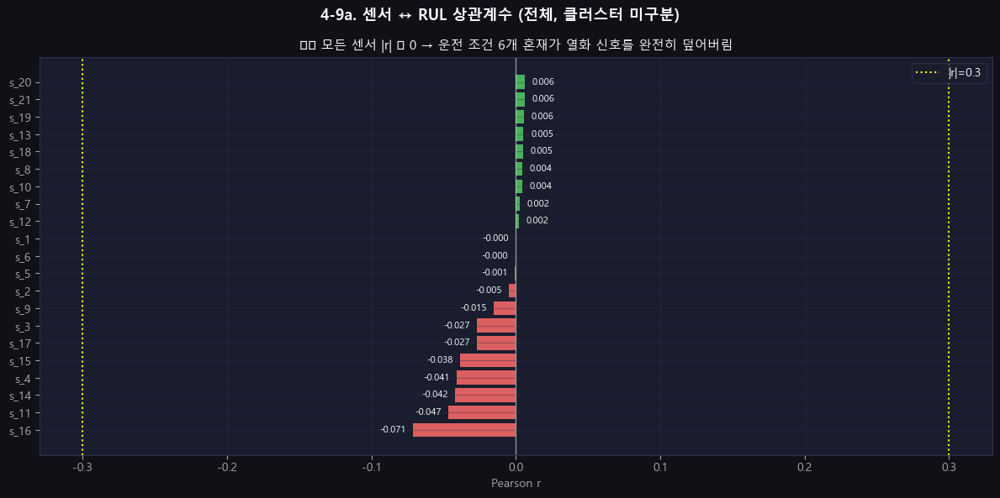

|r|>0.3 고상관 센서: 0개
📌 FD001은 14개 전부 |r|>0.3  →  FD002는 0개  → 조건 혼재의 압도적 영향
📌 → 다음 섹션에서 클러스터별로 나눠 계산하면 유의미한 상관관계가 나타남


In [20]:
# 4-9a. 직접 RUL 상관계수 (전체, 클러스터 미구분) — FD002 핵심 발견
print('=== 4-9a. 직접 RUL 상관계수 (전처리 전, 클러스터 미구분) ===')
tr_rul_d = train_raw.copy()
mc_d = tr_rul_d.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_rul_d = tr_rul_d.join(mc_d, on='unit_nr')
tr_rul_d['RUL'] = tr_rul_d['max_c'] - tr_rul_d['time_cycles']
rul_corr_direct = tr_rul_d[SENSOR_COLS+['RUL']].corr()['RUL'][SENSOR_COLS].sort_values()
fig, ax = plt.subplots(figsize=(12, 6))
fig.suptitle('4-9a. 센서 ↔ RUL 상관계수 (전체, 클러스터 미구분)', fontsize=13, fontweight='bold')
bar_colors = [C[1] if v<0 else C[2] for v in rul_corr_direct]
bars = ax.barh(rul_corr_direct.index, rul_corr_direct.values, color=bar_colors, alpha=0.85)
ax.axvline(0, color='white', lw=1, alpha=0.5)
ax.axvline(0.3, color='yellow', lw=1.5, ls=':'); ax.axvline(-0.3, color='yellow', lw=1.5, ls=':')
ax.set_xlabel('Pearson r'); ax.legend(handles=[__import__('matplotlib').lines.Line2D([],[],color='yellow',ls=':',label='|r|=0.3')])
ax.set_title('⚠️ 모든 센서 |r| ≈ 0 → 운전 조건 6개 혼재가 열화 신호를 완전히 덮어버림')
for bar, val in zip(bars, rul_corr_direct.values):
    ax.text(val+(0.005 if val>=0 else -0.005), bar.get_y()+bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=8)
plt.tight_layout(); plt.show()
print(f'|r|>0.3 고상관 센서: {(rul_corr_direct.abs()>0.3).sum()}개')
print('📌 FD001은 14개 전부 |r|>0.3  →  FD002는 0개  → 조건 혼재의 압도적 영향')
print('📌 → 다음 섹션에서 클러스터별로 나눠 계산하면 유의미한 상관관계가 나타남')

### 📊 4-9a. 직접 RUL 상관계수 결과 정리

- **|r| > 0.3 고상관 센서: 0개** → FD001(14개)과 완전히 다른 결과
- 모든 센서의 |r| < 0.1로 RUL과 거의 무상관
- **원인:** 운전 조건 6가지 노이즈가 열화 신호를 덮어버린 것
- ✅ **이것이 FD002에서 클러스터별 분석이 필수인 가장 강력한 근거**

### 4-9b. 클러스터별 RUL 상관계수 (클러스터 혼재 효과 제거)

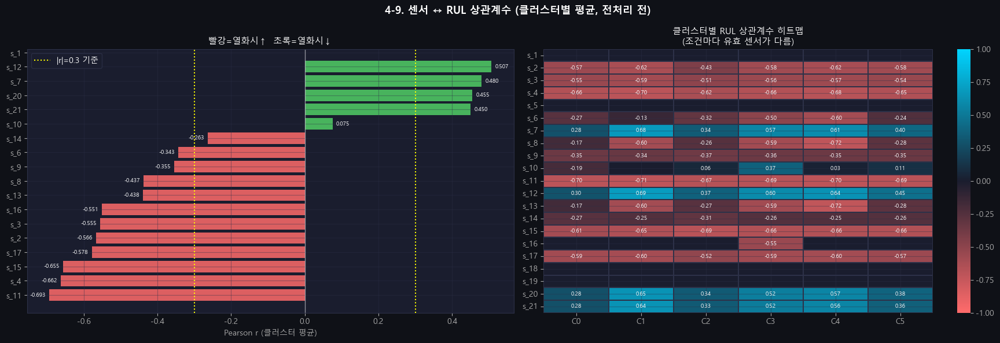

|r|>0.3 고상관 센서 (클러스터 평균): 15개
📌 FD002: 전체 상관은 낮지만 클러스터별로 나누면 유의한 센서 확인 가능


In [21]:
cluster_rul_corrs = []
for c in range(N_CLUSTERS):
    mask = tr_trend['op_cluster']==c
    sub  = tr_trend[mask]
    if len(sub)>10:
        corr_c = sub[SENSOR_COLS+['RUL']].corr()['RUL'][SENSOR_COLS]
        cluster_rul_corrs.append(corr_c)
rul_corr_before = pd.concat(cluster_rul_corrs, axis=1).mean(axis=1).sort_values()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('4-9. 센서 ↔ RUL 상관계수 (클러스터별 평균, 전처리 전)', fontsize=13, fontweight='bold')

bar_colors = [C[1] if v<0 else C[2] for v in rul_corr_before]
bars = axes[0].barh(rul_corr_before.index, rul_corr_before.values, color=bar_colors, alpha=0.85)
axes[0].axvline(0,    color='white',  lw=1, alpha=0.5)
axes[0].axvline( 0.3, color='yellow', lw=1.5, ls=':',label='|r|=0.3 기준')
axes[0].axvline(-0.3, color='yellow', lw=1.5, ls=':')
axes[0].set_xlabel('Pearson r (클러스터 평균)')
axes[0].set_title('빨강=열화시↑  초록=열화시↓'); axes[0].legend()
for bar, val in zip(bars, rul_corr_before.values):
    axes[0].text(val+(0.01 if val>=0 else -0.01), bar.get_y()+bar.get_height()/2,
                 f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=7)

cluster_corr_matrix = pd.concat(cluster_rul_corrs, axis=1)
cluster_corr_matrix.columns = [f'C{i}' for i in range(len(cluster_rul_corrs))]
sns.heatmap(cluster_corr_matrix, ax=axes[1], cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':7},
            linewidths=0.3, linecolor=GRID)
axes[1].set_title('클러스터별 RUL 상관계수 히트맵\n(조건마다 유효 센서가 다름)')
plt.tight_layout(); plt.show()

high_corr = rul_corr_before[rul_corr_before.abs()>0.3]
print(f'|r|>0.3 고상관 센서 (클러스터 평균): {len(high_corr)}개')
print('📌 FD002: 전체 상관은 낮지만 클러스터별로 나누면 유의한 센서 확인 가능')


### 4-10. 시차상관관계 (Lag Correlation, lag 0~15)

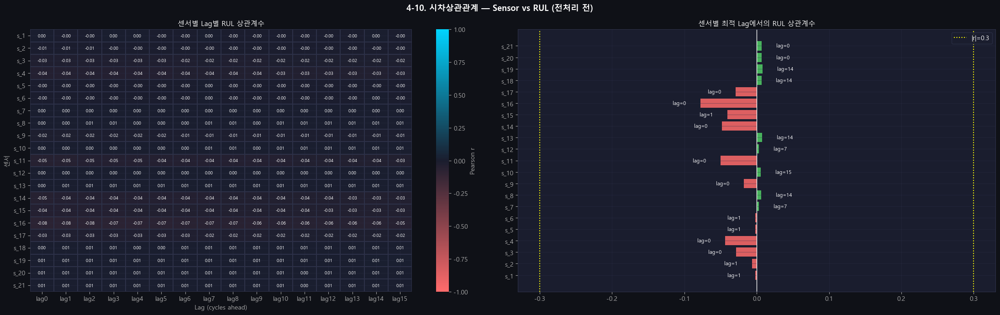

📌 최대 lag 분포 → window size 하한선 근거 (16 이하 → WINDOW_SIZE=20 설정)


In [22]:
MAX_LAG = 15
LAGS    = list(range(0, MAX_LAG+1))
lag_matrix = np.full((len(SENSOR_COLS), len(LAGS)), np.nan)

for si, s in enumerate(SENSOR_COLS):
    unit_lag_corrs = {lag:[] for lag in LAGS}
    for uid in tr_trend['unit_nr'].unique():
        udf    = tr_trend[tr_trend['unit_nr']==uid].sort_values('time_cycles')
        sensor = udf[s].values; rul = udf['RUL'].values
        for lag in LAGS:
            if len(sensor)>lag+5:
                c_val = np.corrcoef(sensor[:len(sensor)-lag], rul[lag:])[0,1]
                if np.isfinite(c_val): unit_lag_corrs[lag].append(c_val)
    lag_matrix[si] = [np.mean(unit_lag_corrs[l]) if unit_lag_corrs[l] else np.nan for l in LAGS]

lag_df = pd.DataFrame(lag_matrix, index=SENSOR_COLS, columns=[f'lag{l}' for l in LAGS])

best_lag_idx, best_lag_corr = [], []
for i in range(len(SENSOR_COLS)):
    row = lag_matrix[i]
    if np.all(np.isnan(row)): best_lag_idx.append(0); best_lag_corr.append(np.nan)
    else:
        idx = int(np.nanargmax(np.abs(row)))
        best_lag_idx.append(idx); best_lag_corr.append(float(row[idx]))

fig, axes = plt.subplots(1, 2, figsize=(22, 7))
fig.suptitle('4-10. 시차상관관계 — Sensor vs RUL (전처리 전)', fontsize=13, fontweight='bold')
sns.heatmap(lag_df, ax=axes[0], cmap=cmap_lag, center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':7},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
axes[0].set_title('센서별 Lag별 RUL 상관계수')
axes[0].set_xlabel('Lag (cycles ahead)'); axes[0].set_ylabel('센서')

best_corr_plot = [v if np.isfinite(v) else 0.0 for v in best_lag_corr]
bc = [GRAY if not np.isfinite(v) else (C[1] if v<0 else C[2]) for v in best_lag_corr]
bars = axes[1].barh(SENSOR_COLS, best_corr_plot, color=bc, alpha=0.85)
axes[1].axvline(0,   color='white', lw=1)
axes[1].axvline(0.3, color='yellow', lw=1.5, ls=':',label='|r|=0.3')
axes[1].axvline(-0.3,color='yellow', lw=1.5, ls=':')
for bar, li, v in zip(bars, best_lag_idx, best_lag_corr):
    if not np.isfinite(v): continue
    x = bar.get_width()
    axes[1].text(x+(0.02 if x>=0 else -0.02), bar.get_y()+bar.get_height()/2,
                 f'lag={LAGS[li]}', va='center', ha='left' if x>=0 else 'right', fontsize=8)
axes[1].set_title('센서별 최적 Lag에서의 RUL 상관계수'); axes[1].legend()
plt.tight_layout(); plt.show()
print('📌 최대 lag 분포 → window size 하한선 근거 (16 이하 → WINDOW_SIZE=20 설정)')


---
## 5. 통계 검정

### 5-1. Mann-Kendall 트렌드 검정 (전체 기준)


=== 5-1. Mann-Kendall 트렌드 검정 ===


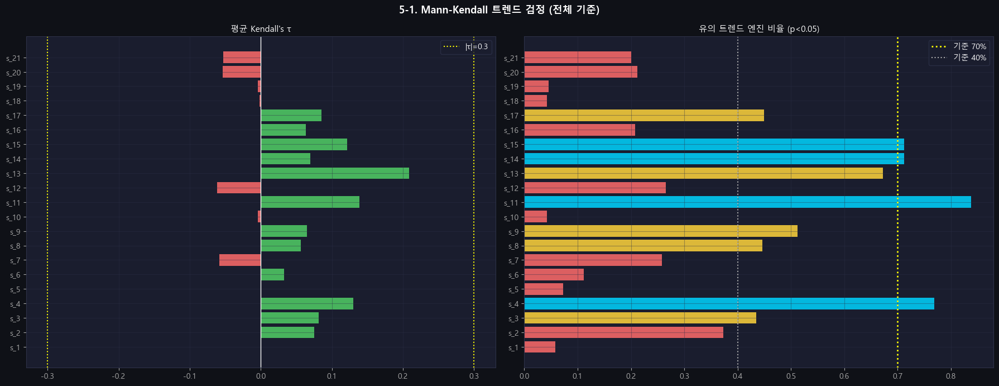

,평균 τ,유의 엔진 비율,열화 신호
센서,,,
s_1,0.0008,5.8%,❌ 약함
s_2,0.0750,37.3%,❌ 약함
s_3,0.0813,43.5%,🔶 보통
s_4,0.1303,76.9%,✅ 강함
s_5,0.0007,7.3%,❌ 약함
s_6,0.0329,11.2%,❌ 약함
s_7,-0.0583,25.8%,❌ 약함
s_8,0.0564,44.6%,🔶 보통
s_9,0.0653,51.2%,🔶 보통


📌 FD002: 전체 기준으로 보면 트렌드 불명확 → 클러스터별 MK 검정에서 명확해짐 (Section 6-3)


In [23]:
print('=== 5-1. Mann-Kendall 트렌드 검정 ===')
mk_rows = []
for s in SENSOR_COLS:
    taus, ps = [], []
    for uid in tr_trend['unit_nr'].unique():
        arr = tr_trend[tr_trend['unit_nr']==uid].sort_values('time_cycles')[s].values
        if len(arr)>=8:
            tau, p = kendalltau(np.arange(len(arr)), arr)
            if np.isfinite(tau): taus.append(tau); ps.append(p)
    mean_tau  = np.mean(taus) if taus else np.nan
    sig_ratio = np.mean([p<0.05 for p in ps]) if ps else np.nan
    mk_rows.append({'센서':s,'평균 τ':round(mean_tau,4) if np.isfinite(mean_tau) else np.nan,
                    '유의 엔진 비율':f'{sig_ratio*100:.1f}%' if np.isfinite(sig_ratio) else 'N/A',
                    '열화 신호':('✅ 강함' if sig_ratio>=0.7 else '🔶 보통' if sig_ratio>=0.4 else '❌ 약함') if np.isfinite(sig_ratio) else '⬜ 상수'})

mk_df = pd.DataFrame(mk_rows).set_index('센서')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('5-1. Mann-Kendall 트렌드 검정 (전체 기준)', fontsize=13, fontweight='bold')

tau_vals = [v if np.isfinite(v) else 0 for v in mk_df['평균 τ'].values]
bc_tau = [C[2] if v>0 else C[1] for v in tau_vals]
axes[0].barh(mk_df.index, tau_vals, color=bc_tau, alpha=0.85)
axes[0].axvline(0, color='white', lw=1)
axes[0].axvline(0.3, color='yellow', lw=1.5, ls=':')
axes[0].axvline(-0.3, color='yellow', lw=1.5, ls=':', label='|τ|=0.3')
axes[0].set_title("평균 Kendall's τ"); axes[0].legend()

sig_vals = [float(v.replace('%',''))/100 if v!='N/A' else 0 for v in mk_df['유의 엔진 비율'].values]
bc_sig = [C[0] if v>=0.7 else C[3] if v>=0.4 else C[1] for v in sig_vals]
axes[1].barh(mk_df.index, sig_vals, color=bc_sig, alpha=0.85)
axes[1].axvline(0.7, color='yellow', lw=2, ls=':', label='기준 70%')
axes[1].axvline(0.4, color=GRAY, lw=1.5, ls=':', label='기준 40%')
axes[1].set_title('유의 트렌드 엔진 비율 (p<0.05)'); axes[1].legend()
plt.tight_layout(); plt.show()
display(mk_df)
print('📌 FD002: 전체 기준으로 보면 트렌드 불명확 → 클러스터별 MK 검정에서 명확해짐 (Section 6-3)')


### 5-2. 대응 표본 검정 (초기 vs 말기)

=== 5-2. 대응 표본 검정 (초기 RUL 상위 80% vs 말기 20%) ===


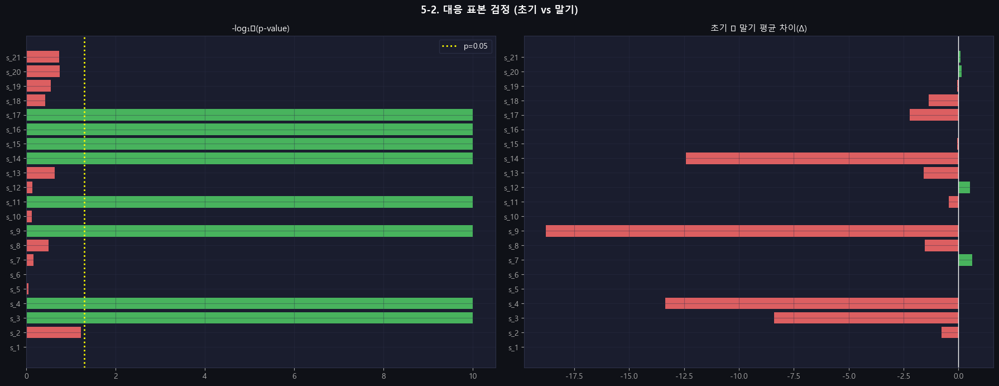

,초기평균,말기평균,차이(Δ),방법,p-value,판정,p_adj_BH,판정_BH
센서,,,,,,,,
s_1,472.9177,472.9296,-0.0119,Paired t,0.9676,비유의 ⚠️,0.9963,비유의(FDR) ⚠️
s_2,579.5319,580.3124,-0.7806,Paired t,0.0588,비유의 ⚠️,0.1372,비유의(FDR) ⚠️
s_3,1418.3566,1426.7448,-8.3882,Paired t,0.0000,유의 ✅,0.0000,유의(FDR) ✅
s_4,1202.8824,1216.2443,-13.3620,Paired t,0.0000,유의 ✅,0.0000,유의(FDR) ✅
s_5,8.0347,8.0296,0.0052,Paired t,0.8963,비유의 ⚠️,0.9906,비유의(FDR) ⚠️
s_6,11.6032,11.6035,-0.0003,Paired t,0.9963,비유의 ⚠️,0.9963,비유의(FDR) ⚠️
s_7,282.7874,282.1658,0.6217,Paired t,0.6970,비유의 ⚠️,0.8863,비유의(FDR) ⚠️
s_8,2228.5839,2230.1199,-1.5360,Paired t,0.3181,비유의 ⚠️,0.4772,비유의(FDR) ⚠️
s_9,8520.6990,8539.4975,-18.7985,Paired t,0.0000,유의 ✅,0.0000,유의(FDR) ✅



유의한 센서 (BH-FDR): 8/21개


In [24]:
print('=== 5-2. 대응 표본 검정 (초기 RUL 상위 80% vs 말기 20%) ===')
paired_rows = []
for s in SENSOR_COLS:
    early_means, late_means = [], []
    for uid in tr_trend['unit_nr'].unique():
        udf = tr_trend[tr_trend['unit_nr']==uid].sort_values('time_cycles')
        thresh = udf['RUL'].quantile(0.20)
        early = udf[udf['RUL']> thresh][s].mean()
        late  = udf[udf['RUL']<=thresh][s].mean()
        if np.isfinite(early) and np.isfinite(late):
            early_means.append(early); late_means.append(late)
    diffs = np.array(early_means)-np.array(late_means)
    _, p_sw = shapiro(diffs) if len(diffs)>=3 else (np.nan,0.0)
    stat, p_val = ttest_rel(early_means,late_means) if p_sw>0.05 else wilcoxon(diffs)
    test_name = 'Paired t' if p_sw>0.05 else 'Wilcoxon'
    paired_rows.append({'센서':s,'초기평균':round(np.mean(early_means),4),
                        '말기평균':round(np.mean(late_means),4),
                        '차이(Δ)':round(float(np.mean(diffs)),4),
                        '방법':test_name,'p-value':round(p_val,4),
                        '판정':'유의 ✅' if p_val<0.05 else '비유의 ⚠️'})
paired_df = pd.DataFrame(paired_rows).set_index('센서')
_pvals = paired_df['p-value'].fillna(1.0).values
_rej, _padj, *_ = multipletests(_pvals, alpha=0.05, method='fdr_bh')
paired_df['p_adj_BH'] = np.round(_padj,4)
paired_df['판정_BH']  = ['유의(FDR) ✅' if r else '비유의(FDR) ⚠️' for r in _rej]

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('5-2. 대응 표본 검정 (초기 vs 말기)', fontsize=13, fontweight='bold')
p_vals = paired_df['p-value'].values
log_p  = -np.log10(np.clip(p_vals,1e-10,1))
axes[0].barh(paired_df.index, log_p, color=[C[2] if p<0.05 else C[1] for p in p_vals], alpha=0.85)
axes[0].axvline(-np.log10(0.05), color='yellow', lw=2, ls=':', label='p=0.05')
axes[0].set_title('-log₁₀(p-value)'); axes[0].legend()
diff_vals = paired_df['차이(Δ)'].values
axes[1].barh(paired_df.index, diff_vals, color=[C[2] if v>0 else C[1] for v in diff_vals], alpha=0.85)
axes[1].axvline(0, color='white', lw=1)
axes[1].set_title('초기 − 말기 평균 차이(Δ)')
plt.tight_layout(); plt.show()
display(paired_df)
print(f"\n유의한 센서 (BH-FDR): {sum(_rej)}/{len(paired_df)}개")


FD002: 2-5에서 트렌드가 불명확했음
       → 조건 혼재로 전체로 보면 변화 시점 확인 불가
       → 클러스터별로 나눈 Mann-Kendall에서
          트렌드가 있다는 건 확인했지만
          "20% 시점"이라는 근거가 없음

          대응표본 t검정 대신 다른 검정으로 대체
        → 이미 ANOVA + Kruskal-Wallis + Pearson으로
           충분히 검증했으니 생략

### 5-3. 분산 분해 (Engine vs Cluster vs Within) [EXTRA-D]

=== 5-3. 분산 분해 ===


,engine_pct,cluster_pct,within_pct
센서,,,
s_1,0.300000,116.900000,0.000000
s_2,0.300000,124.000000,0.000000
s_3,0.300000,127.700000,0.000000
s_4,0.400000,126.800000,0.000000
s_5,0.300000,114.200000,0.000000
s_6,0.300000,116.100000,0.000000
s_7,0.300000,119.100000,0.000000
s_8,0.300000,133.800000,0.000000
s_9,0.400000,128.300000,0.000000


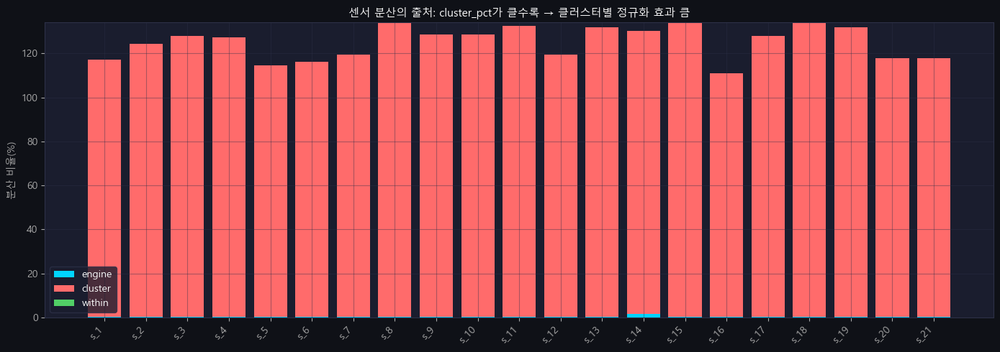

In [25]:
print('=== 5-3. 분산 분해 ===')
def var_decomp(df, sensor):
    total_var   = df[sensor].var()
    engine_means  = df.groupby('unit_nr')[sensor].mean()
    cluster_means = df.groupby('op_cluster')[sensor].mean()
    var_engine  = engine_means.var()
    var_cluster = cluster_means.var()
    var_within  = total_var - var_engine - var_cluster
    return {'total':total_var,'engine':var_engine,'cluster':var_cluster,'within':max(var_within,0)}

rows = []
for s in SENSOR_COLS:
    if train_raw[s].std()<1e-6: continue
    d = var_decomp(train_raw, s)
    if d['total']<1e-9: continue
    rows.append({'센서':s,'engine_pct':round(d['engine']/d['total']*100,1),
                 'cluster_pct':round(d['cluster']/d['total']*100,1),
                 'within_pct': round(d['within']/d['total']*100,1)})
vd_df = pd.DataFrame(rows).set_index('센서')
display(vd_df.style.background_gradient(subset=['cluster_pct'],cmap='YlOrRd'))

fig, ax = plt.subplots(figsize=(14, 5))
x = np.arange(len(vd_df))
ax.bar(x, vd_df['engine_pct'],  color=C[0], label='engine')
ax.bar(x, vd_df['cluster_pct'], bottom=vd_df['engine_pct'], color=C[1], label='cluster')
ax.bar(x, vd_df['within_pct'],  bottom=vd_df['engine_pct']+vd_df['cluster_pct'], color=C[2], label='within')
ax.set_xticks(x); ax.set_xticklabels(vd_df.index, rotation=45, ha='right')
ax.set_ylabel('분산 비율(%)'); ax.legend()
ax.set_title('센서 분산의 출처: cluster_pct가 클수록 → 클러스터별 정규화 효과 큼')
plt.tight_layout(); plt.show()


### 5-4. SNR (Signal-to-Noise Ratio) per Sensor [EXTRA-E]

=== 5-4. SNR per sensor (cluster-aware) ===


,SNR_mean,|SNR|_mean,SNR_std
센서,,,
s_11,2.120000,2.120000,0.035000
s_4,2.027000,2.027000,0.064000
s_15,2.006000,2.006000,0.083000
s_16,1.845000,1.845000,0.000000
s_17,1.774000,1.774000,0.081000
s_2,1.735000,1.735000,0.189000
s_3,1.697000,1.697000,0.085000
s_12,-1.549000,1.549000,0.441000
s_7,-1.463000,1.463000,0.445000


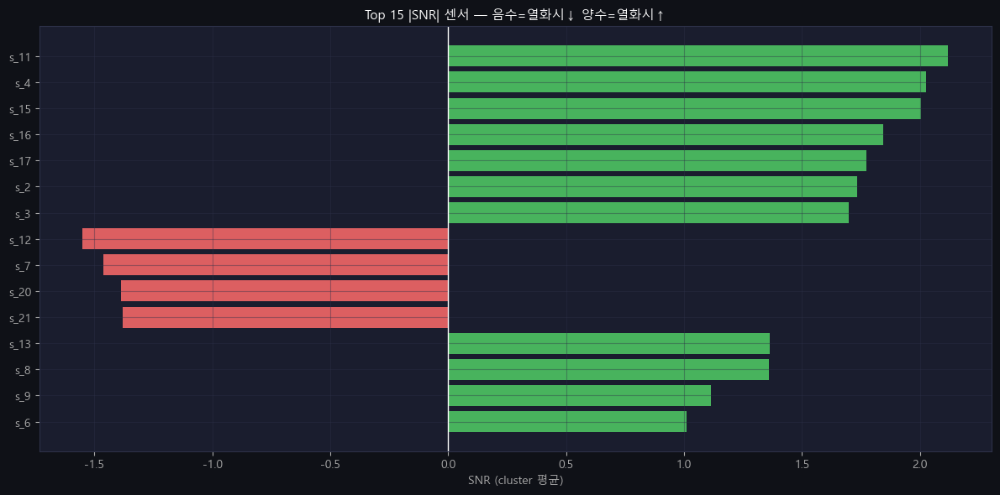

In [26]:
print('=== 5-4. SNR per sensor (cluster-aware) ===')
mc = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
snr_src = train_raw.join(mc, on='unit_nr')
snr_src['RUL'] = snr_src['max_c'] - snr_src['time_cycles']

snr_rows = []
for s in SENSOR_COLS:
    cluster_snrs = []
    for c in range(N_CLUSTERS):
        sub = snr_src[snr_src['op_cluster']==c]
        if len(sub)<50: continue
        early = sub[sub['RUL']>sub['RUL'].quantile(0.8)][s].mean()
        late  = sub[sub['RUL']<sub['RUL'].quantile(0.2)][s].mean()
        std   = sub[s].std()
        if std>1e-6: cluster_snrs.append((late-early)/std)
    if cluster_snrs:
        snr_rows.append({'센서':s,'SNR_mean':round(np.mean(cluster_snrs),3),
                         '|SNR|_mean':round(np.mean(np.abs(cluster_snrs)),3),
                         'SNR_std':round(np.std(cluster_snrs),3)})
snr_df = pd.DataFrame(snr_rows).set_index('센서').sort_values('|SNR|_mean',ascending=False)
display(snr_df.style.background_gradient(subset=['|SNR|_mean'],cmap='YlOrRd'))

fig, ax = plt.subplots(figsize=(12, 6))
top = snr_df.head(15)
bc = [C[2] if v>0 else C[1] for v in top['SNR_mean']]
ax.barh(top.index[::-1], top['SNR_mean'][::-1], color=bc[::-1], alpha=0.85)
ax.axvline(0, color='white', lw=1)
ax.set_xlabel('SNR (cluster 평균)')
ax.set_title('Top 15 |SNR| 센서 — 음수=열화시↓ 양수=열화시↑')
plt.tight_layout(); plt.show()


### 5-5. 센서 궤적 by RUL bin × Cluster [EXTRA-C]

=== 5-5. 센서 궤적 by RUL bin × Cluster ===


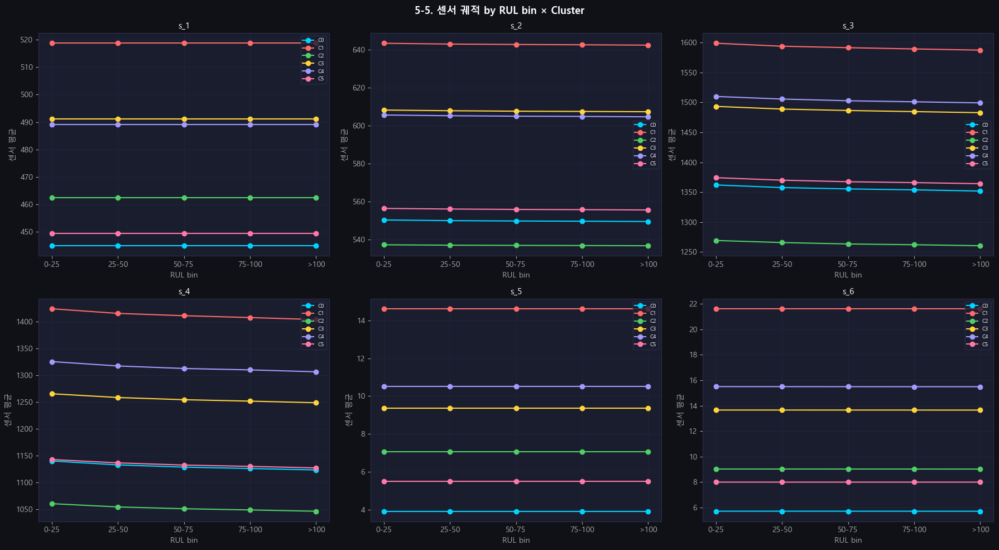

📌 클러스터마다 RUL에 따른 센서 궤적이 다름 → 클러스터별 접근 필요성 시각화


In [27]:
print('=== 5-5. 센서 궤적 by RUL bin × Cluster ===')
trj = train_raw.join(mc, on='unit_nr').copy()
trj['RUL'] = trj['max_c'] - trj['time_cycles']
trj['rul_bin'] = pd.cut(trj['RUL'], bins=[-1,25,50,75,100,1e6],
                        labels=['0-25','25-50','50-75','75-100','>100'])

top6 = USEFUL_SENSORS[:6]
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('5-5. 센서 궤적 by RUL bin × Cluster', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, top6):
    for c in range(N_CLUSTERS):
        sub = trj[trj['op_cluster']==c]
        means = sub.groupby('rul_bin', observed=True)[s].mean()
        ax.plot(means.index.astype(str), means.values,
                color=CLUSTER_COLORS[c], marker='o', lw=1.5, label=f'C{c}')
    ax.set_title(s); ax.set_xlabel('RUL bin'); ax.set_ylabel('센서 평균')
    ax.legend(fontsize=7)
plt.tight_layout(); plt.show()
print('📌 클러스터마다 RUL에 따른 센서 궤적이 다름 → 클러스터별 접근 필요성 시각화')


---
## 6. [FD002 전용] 심화 EDA

### 6-1. 엔진별 운전 조건 전이 heatmap (regime 전이)


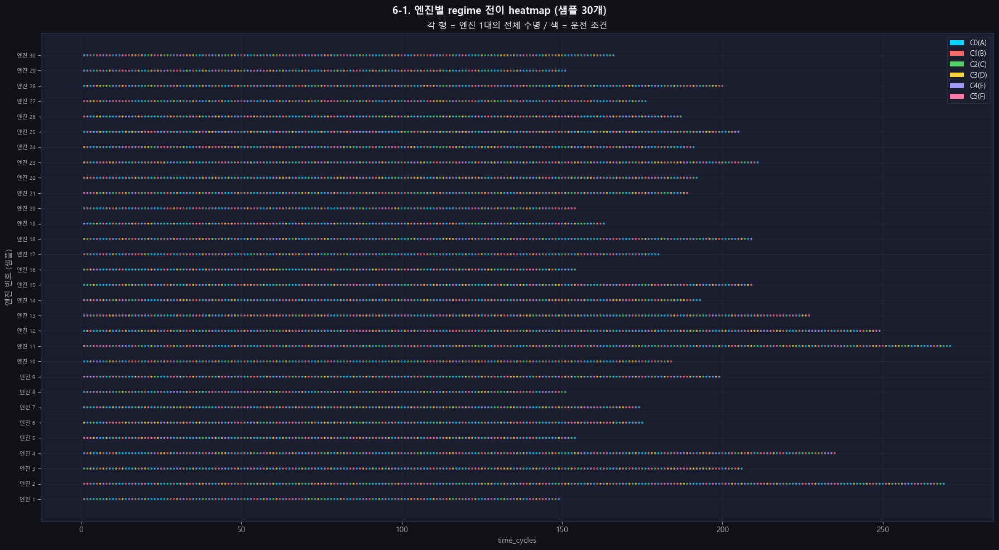

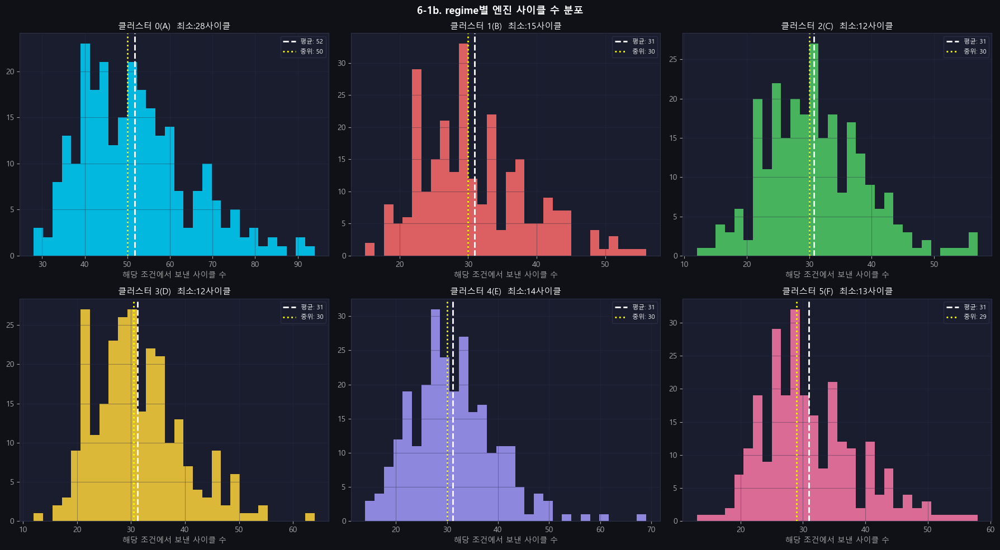


클러스터별 평균/최소 사이클:
            mean  min  median
op_cluster                   
0           51.8   28    50.0
1           30.9   15    30.0
2           30.8   12    30.0
3           31.2   12    30.5
4           31.1   14    30.0
5           30.9   13    29.0

📌 최소 사이클 12~28 → WINDOW_SIZE=30이면 padding 발생 → WINDOW_SIZE=20 권장


In [28]:
sample_units30 = train_raw['unit_nr'].unique()[:30]
cmap_cluster_list = ListedColormap(CLUSTER_COLORS[:N_CLUSTERS])

fig, ax = plt.subplots(figsize=(18, 10))
fig.suptitle('6-1. 엔진별 regime 전이 heatmap (샘플 30개)', fontsize=13, fontweight='bold')
for i, uid in enumerate(sample_units30):
    sub = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')
    ax.scatter(sub['time_cycles'], [i]*len(sub),
               c=sub['op_cluster'], cmap=cmap_cluster_list,
               vmin=0, vmax=N_CLUSTERS-1, s=3, alpha=0.8)
ax.set_xlabel('time_cycles'); ax.set_ylabel('엔진 번호 (샘플)')
ax.set_yticks(range(len(sample_units30)))
ax.set_yticklabels([f'엔진 {u}' for u in sample_units30], fontsize=7)
ax.set_title('각 행 = 엔진 1대의 전체 수명 / 색 = 운전 조건')
legend_elements = [mpatches.Patch(facecolor=CLUSTER_COLORS[c], label=f'C{c}({CLUSTER_MAP[c]})')
                   for c in range(N_CLUSTERS)]
ax.legend(handles=legend_elements, loc='upper right', fontsize=9)
plt.tight_layout(); plt.show()

# 클러스터별 운행 사이클 수 분포
cluster_cycle_counts = train_raw.groupby(['unit_nr','op_cluster']).size().reset_index(name='cycle_count')
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('6-1b. regime별 엔진 사이클 수 분포', fontsize=13, fontweight='bold')
for c, ax in zip(range(N_CLUSTERS), axes.flat):
    data = cluster_cycle_counts[cluster_cycle_counts['op_cluster']==c]['cycle_count']
    ax.hist(data, bins=30, color=CLUSTER_COLORS[c], alpha=0.85, edgecolor='none')
    ax.axvline(data.mean(), color='white', ls='--', lw=2, label=f'평균: {data.mean():.0f}')
    ax.axvline(data.median(), color='yellow', ls=':', lw=2, label=f'중위: {data.median():.0f}')
    ax.set_title(f'클러스터 {c}({CLUSTER_MAP[c]})  최소:{data.min()}사이클')
    ax.set_xlabel('해당 조건에서 보낸 사이클 수')
    ax.legend(fontsize=8)
plt.tight_layout(); plt.show()
print('\n클러스터별 평균/최소 사이클:')
print(cluster_cycle_counts.groupby('op_cluster')['cycle_count'].agg(['mean','min','median']).round(1))
print('\n📌 최소 사이클 12~28 → WINDOW_SIZE=30이면 padding 발생 → WINDOW_SIZE=20 권장')


### 6-1d. 특정 운전 조건 필터링 시각화 [EDA 고유]

엔진 #1, Regime A: 43사이클


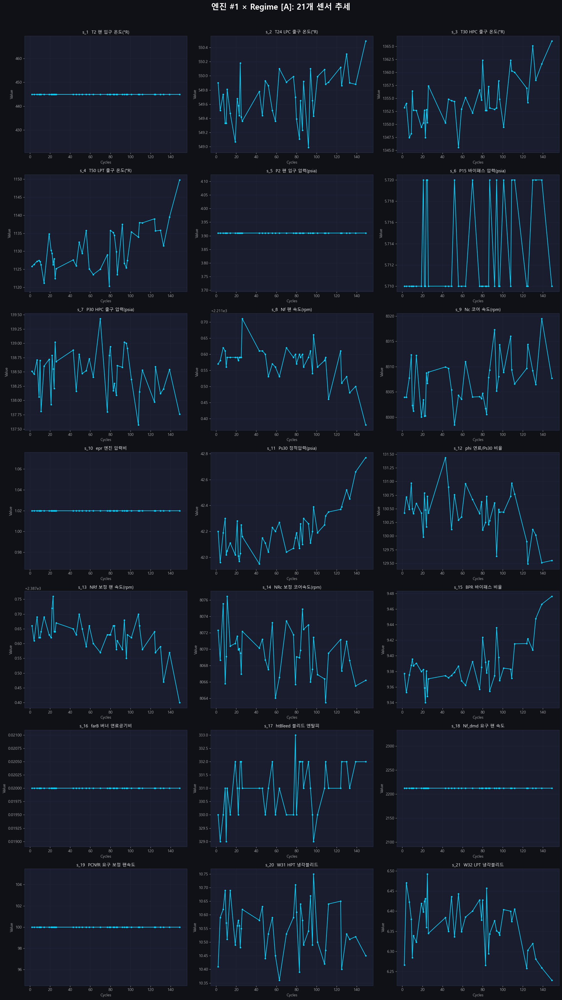

📌 단일 조건 내 순수 열화 트렌드 — 조건 노이즈 없이 센서 변화 확인 가능


In [29]:
# [EDA 고유] 특정 엔진 × 특정 운전 조건 필터링 센서 시각화 (인터랙티브 탐색용)
# 아래 unit_id_f, target_regime_f를 변경해서 원하는 조합을 탐색할 수 있습니다
unit_id_f      = train_raw['unit_nr'].iloc[0]   # 탐색할 엔진 번호
target_regime_f = 'A'                            # 탐색할 운전 조건 A~F

filtered_data = train_raw[
    (train_raw['unit_nr']==unit_id_f) &
    (train_raw['Cluster_Label']==target_regime_f)
].sort_values('time_cycles')

if len(filtered_data) == 0:
    print(f'⚠️ 엔진 #{unit_id_f}에서 Regime {target_regime_f} 데이터가 없습니다.')
    print(f'   해당 엔진의 실제 조건: {train_raw[train_raw["unit_nr"]==unit_id_f]["Cluster_Label"].unique()}')
else:
    print(f'엔진 #{unit_id_f}, Regime {target_regime_f}: {len(filtered_data)}사이클')

    fig, axes = plt.subplots(7, 3, figsize=(20, 35))
    fig.suptitle(f'엔진 #{unit_id_f} × Regime [{target_regime_f}]: 21개 센서 추세',
                 fontsize=20, fontweight='bold', y=1.01)
    axes = axes.flatten()

    c_idx = [k for k, v in CLUSTER_MAP.items() if v==target_regime_f][0]
    plot_color = CLUSTER_COLORS[c_idx]

    for i, col in enumerate(SENSOR_COLS):
        axes[i].plot(filtered_data['time_cycles'], filtered_data[col],
                     color=plot_color, marker='o', markersize=3, lw=1.5)
        axes[i].set_title(f'{col}  {SENSOR_DESC.get(col,"")[:25]}', fontsize=11)
        axes[i].set_xlabel('Cycles'); axes[i].set_ylabel('Value')

    for ax in axes[len(SENSOR_COLS):]: ax.set_visible(False)
    plt.tight_layout(); plt.show()
    print('📌 단일 조건 내 순수 열화 트렌드 — 조건 노이즈 없이 센서 변화 확인 가능')


### 6-1c. 단일 엔진 센서 추세 — 운전 조건별 컬러 [EDA 고유]

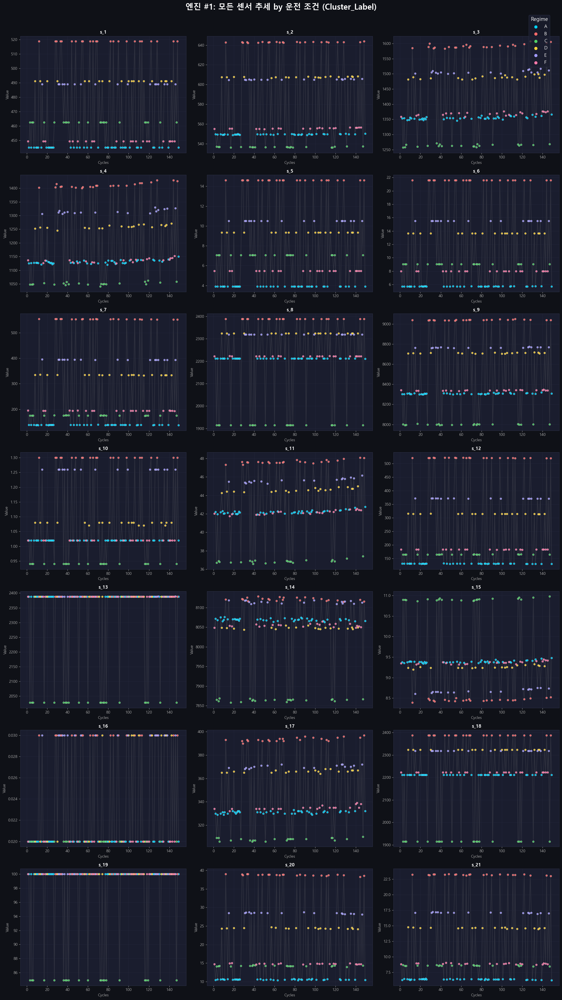

📌 운전 조건이 사이클 내에서 랜덤하게 혼재됨 → 조건별 분리 정규화 필요성 확인


In [30]:
# [EDA 고유] 단일 엔진의 모든 센서 추세 — 운전 조건(Cluster_Label)별 컬러
unit_id_reg = train_raw['unit_nr'].iloc[0]  # 첫 번째 엔진
unit_data_reg = train_raw[train_raw['unit_nr']==unit_id_reg].sort_values('time_cycles')

regime_order = [CLUSTER_MAP[i] for i in range(N_CLUSTERS)]
palette_reg  = {lbl: CLUSTER_COLORS[i] for i, lbl in enumerate(regime_order)}

fig, axes = plt.subplots(7, 3, figsize=(20, 35))
fig.suptitle(f'엔진 #{unit_id_reg}: 모든 센서 추세 by 운전 조건 (Cluster_Label)', fontsize=20, fontweight='bold', y=1.01)
axes = axes.flatten()

for i, col in enumerate(SENSOR_COLS):
    # 전체 흐름 (회색 배경)
    axes[i].plot(unit_data_reg['time_cycles'], unit_data_reg[col],
                 color='gray', alpha=0.2, zorder=1)
    # 조건별 산점도
    for lbl in regime_order:
        sub = unit_data_reg[unit_data_reg['Cluster_Label']==lbl]
        axes[i].scatter(sub['time_cycles'], sub[col],
                        color=palette_reg[lbl], s=25, edgecolor='w',
                        linewidth=0.3, alpha=0.85, label=lbl, zorder=2)
    axes[i].set_title(f'{col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Cycles'); axes[i].set_ylabel('Value')
    axes[i].get_legend().remove() if axes[i].get_legend() else None

# 통합 범례
handles = [plt.scatter([],[], color=palette_reg[l], s=50, label=l) for l in regime_order]
fig.legend(handles=handles, labels=regime_order, loc='upper right',
           bbox_to_anchor=(0.98,1.00), title='Regime', fontsize=12, title_fontsize=13)
plt.tight_layout(); plt.show()
print('📌 운전 조건이 사이클 내에서 랜덤하게 혼재됨 → 조건별 분리 정규화 필요성 확인')


### 6-2. 클러스터별 통계 검증 — ANOVA + Kruskal-Wallis + Pearson

=== 6-2-1. ANOVA — 클러스터 간 센서값 차이 ===


,F통계량,p-value,판정
센서,,,
s_1,inf,0.0,유의 ✅
s_2,7.550359e+07,0.0,유의 ✅
s_3,3.721063e+06,0.0,유의 ✅
s_4,2.466355e+06,0.0,유의 ✅
s_5,inf,0.0,유의 ✅
s_6,1.973643e+10,0.0,유의 ✅
s_7,6.582995e+08,0.0,유의 ✅
s_8,4.639272e+09,0.0,유의 ✅
s_9,3.975914e+06,0.0,유의 ✅


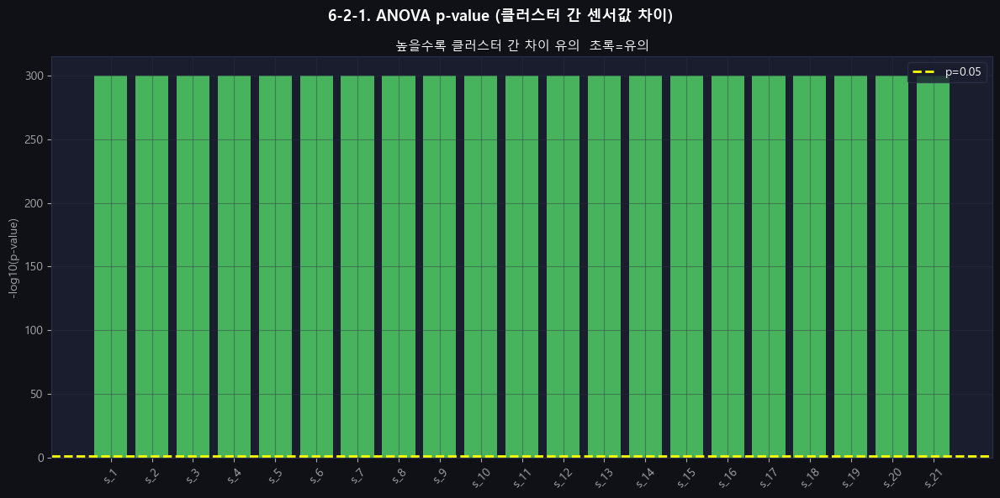

유의한 센서: 21/21개
📌 결론: 21/21개 유의 → 모든 센서에서 조건별 정규화 필요


In [31]:
# 2-10-1. ANOVA
print('=== 6-2-1. ANOVA — 클러스터 간 센서값 차이 ===')
anova_rows = []
for s in SENSOR_COLS:
    groups = [train_raw[train_raw['op_cluster']==c][s].values for c in range(N_CLUSTERS)]
    stat, p = f_oneway(*groups)
    anova_rows.append({'센서':s,'F통계량':round(stat,4),'p-value':round(p,6),
                       '판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})
anova_df = pd.DataFrame(anova_rows).set_index('센서')
display(anova_df)

fig, ax = plt.subplots(figsize=(12,6))
fig.suptitle('6-2-1. ANOVA p-value (클러스터 간 센서값 차이)', fontsize=13, fontweight='bold')
colors_anova = [C[2] if p<0.05 else C[1] for p in anova_df['p-value']]
ax.bar(anova_df.index, -np.log10(anova_df['p-value'].clip(lower=1e-300)),
       color=colors_anova, alpha=0.85)
ax.axhline(-np.log10(0.05), color='yellow', ls='--', lw=2, label='p=0.05')
ax.set_ylabel('-log10(p-value)'); ax.tick_params(axis='x',rotation=45)
ax.set_title('높을수록 클러스터 간 차이 유의  초록=유의'); ax.legend()
plt.tight_layout(); plt.show()
print(f"유의한 센서: {(anova_df['p-value']<0.05).sum()}/{len(anova_df)}개")
print('📌 결론: 21/21개 유의 → 모든 센서에서 조건별 정규화 필요')


FD001: 조건 1개 고정 → 엔진 = 클러스터 1:1 매칭 가능
FD002: 조건 6개 혼재 → 엔진이 모든 클러스터를 거침
       → 엔진을 특정 클러스터에 할당 불가

기존 목적 (불가):
"클러스터별로 엔진 수명이 다른가"
→ 엔진을 클러스터에 할당할 수 없어서 불가

변경 목적 (가능):
"클러스터별로 해당 조건에서 보낸 사이클 수가 다른가"
→ 2-9-3에서 이미 시각적으로 확인한 것
→ 클러스터 0이 평균 51.8, 나머지 30~31로 다름
→ 이걸 통계적으로 검증


=== 6-2-2. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이 ===
H=480.0066  p=0.000000
판정: 유의 ✅ → 클러스터별 운행 사이클 수 차이 있음

=== 6-2-3. Pearson 상관계수 (클러스터별) ===


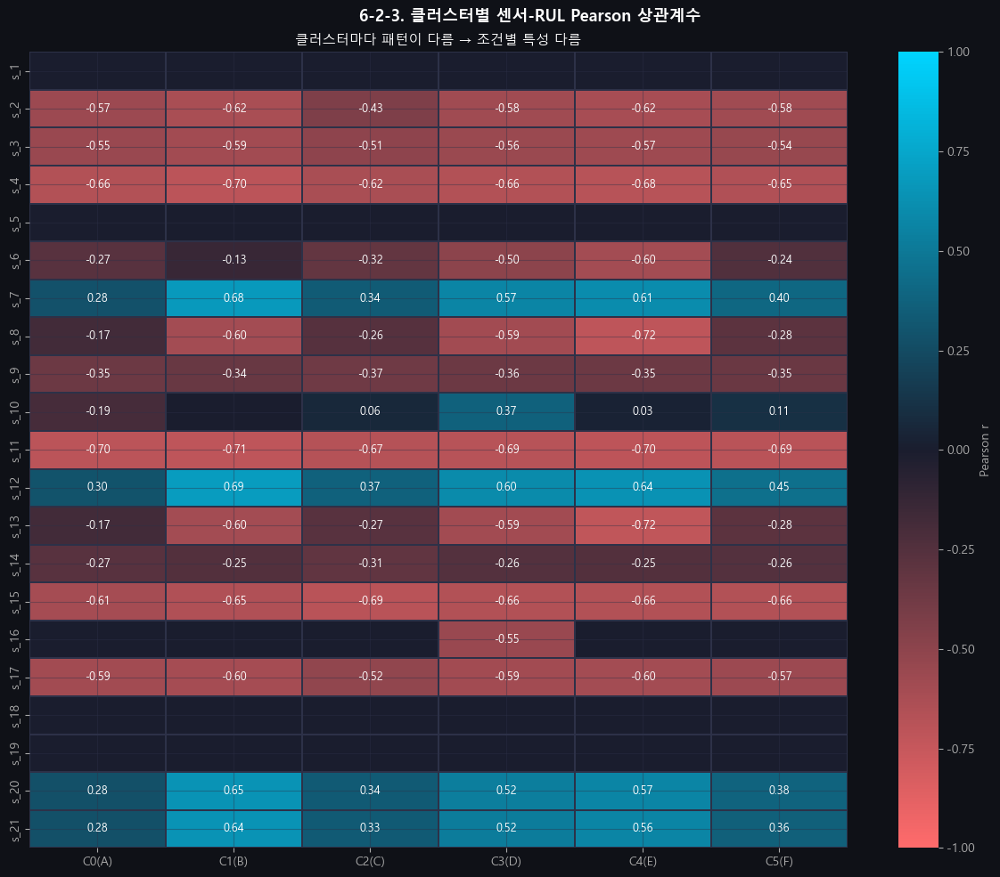


--- 클러스터별 |r|>0.3 고상관 센서 수 ---
  C0: 7개 → ['s_2', 's_3', 's_4', 's_9', 's_11', 's_15', 's_17']
  C1: 13개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_15', 's_17', 's_20', 's_21']
  C2: 13개 → ['s_2', 's_3', 's_4', 's_6', 's_7', 's_9', 's_11', 's_12', 's_14', 's_15', 's_17', 's_20', 's_21']
  C3: 16개 → ['s_2', 's_3', 's_4', 's_6', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_15', 's_16', 's_17', 's_20', 's_21']
  C4: 14개 → ['s_2', 's_3', 's_4', 's_6', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_15', 's_17', 's_20', 's_21']
  C5: 11개 → ['s_2', 's_3', 's_4', 's_7', 's_9', 's_11', 's_12', 's_15', 's_17', 's_20', 's_21']


In [32]:
# 2-10-2. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이
print('\n=== 6-2-2. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이 ===')
groups_kw = [cluster_cycle_counts[cluster_cycle_counts['op_cluster']==c]['cycle_count'].values
             for c in range(N_CLUSTERS)]
stat_kw, p_kw = kruskal(*groups_kw)
print(f'H={stat_kw:.4f}  p={p_kw:.6f}')
print(f'판정: {"유의 ✅ → 클러스터별 운행 사이클 수 차이 있음" if p_kw<0.05 else "비유의 ⚠️"}')

# 2-10-3. Pearson — 클러스터별 RUL 상관계수
print('\n=== 6-2-3. Pearson 상관계수 (클러스터별) ===')
tr_rul_eda = train_raw.copy()
mc2 = tr_rul_eda.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_rul_eda = tr_rul_eda.join(mc2, on='unit_nr')
tr_rul_eda['RUL'] = tr_rul_eda['max_c'] - tr_rul_eda['time_cycles']

corr_matrix = np.zeros((len(SENSOR_COLS), N_CLUSTERS))
for ci, c in enumerate(range(N_CLUSTERS)):
    sub = tr_rul_eda[tr_rul_eda['op_cluster']==c]
    for si, s in enumerate(SENSOR_COLS):
        r, _ = pearsonr(sub[s], sub['RUL'])
        corr_matrix[si, ci] = r

corr_df = pd.DataFrame(corr_matrix, index=SENSOR_COLS,
                       columns=[f'C{c}({CLUSTER_MAP[c]})' for c in range(N_CLUSTERS)])

fig, ax = plt.subplots(figsize=(12, 10))
fig.suptitle('6-2-3. 클러스터별 센서-RUL Pearson 상관계수', fontsize=13, fontweight='bold')
sns.heatmap(corr_df, ax=ax, cmap=cmap_rg, center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':9},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
ax.set_title('클러스터마다 패턴이 다름 → 조건별 특성 다름')
plt.tight_layout(); plt.show()

print('\n--- 클러스터별 |r|>0.3 고상관 센서 수 ---')
for c in range(N_CLUSTERS):
    col = f'C{c}({CLUSTER_MAP[c]})'
    high = corr_df[col][corr_df[col].abs()>0.3]
    print(f'  C{c}: {len(high)}개 → {list(high.index)}')


### 📊 6-2. 클러스터별 통계 검증 종합 결과

#### ANOVA
- **21/21개 유의** → 모든 센서에서 조건별 정규화 필수

#### Kruskal-Wallis
- C0 평균 51.8사이클 vs 나머지 30~31 → **클러스터마다 부하량 차이 증명**

#### Pearson
- 클러스터별 유효 센서 수: 7~16개 (조건마다 다름)
- `s_11`, `s_4`, `s_15`, `s_17` → 모든 클러스터 공통 핵심 열화 센서
- ✅ **ANOVA + KW + Pearson 3종 검증 → 클러스터별 전처리 필요성 완전 증명**

### 6-3. 클러스터별 시차상관관계 (lag 0~15)

=== 6-3. 클러스터별 시차상관관계 ===


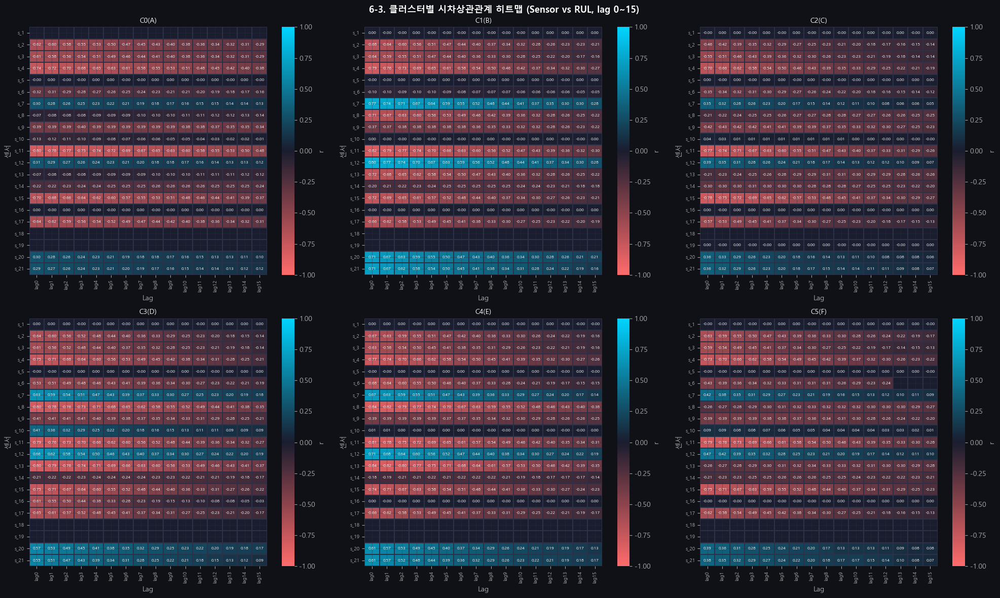


--- 클러스터별 최적 lag 분포 ---
  C0: 평균=3.4  최대=15  최소=0
  C1: 평균=2.3  최대=12  최소=0
  C2: 평균=1.9  최대=11  최소=0
  C3: 평균=1.0  최대=6  최소=0
  C4: 평균=1.4  최대=9  최소=0
  C5: 평균=2.1  최대=11  최소=0

📌 최대 lag ≤ 15 → WINDOW_SIZE=20으로 충분히 커버


In [33]:
print('=== 6-3. 클러스터별 시차상관관계 ===')
tr_lag2 = train_raw.copy()
mc3 = tr_lag2.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_lag2 = tr_lag2.join(mc3, on='unit_nr')
tr_lag2['RUL'] = tr_lag2['max_c'] - tr_lag2['time_cycles']

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('6-3. 클러스터별 시차상관관계 히트맵 (Sensor vs RUL, lag 0~15)',
             fontsize=13, fontweight='bold')

best_lag_by_cluster = {}
for c, ax in zip(range(N_CLUSTERS), axes.flat):
    sub_c = tr_lag2[tr_lag2['op_cluster']==c]
    lag_mat = np.full((len(SENSOR_COLS), len(LAGS)), np.nan)
    for si, s in enumerate(SENSOR_COLS):
        unit_lc = {lag:[] for lag in LAGS}
        for uid in sub_c['unit_nr'].unique():
            udf = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')
            sensor2 = udf[s].values; rul2 = udf['RUL'].values
            for lag in LAGS:
                if len(sensor2)>lag+5:
                    r = np.corrcoef(sensor2[:len(sensor2)-lag], rul2[lag:])[0,1]
                    if np.isfinite(r): unit_lc[lag].append(r)
        lag_mat[si] = [np.mean(unit_lc[l]) if unit_lc[l] else np.nan for l in LAGS]

    lag_df2 = pd.DataFrame(lag_mat, index=SENSOR_COLS, columns=[f'lag{l}' for l in LAGS])
    sns.heatmap(lag_df2, ax=ax, cmap=cmap_lag, center=0, vmin=-1, vmax=1,
                annot=True, fmt='.2f', annot_kws={'size':6},
                linewidths=0.2, linecolor=GRID, cbar_kws={'label':'r'})
    ax.set_title(f'C{c}({CLUSTER_MAP[c]})', fontsize=10)
    ax.set_xlabel('Lag'); ax.set_ylabel('센서'); ax.tick_params(labelsize=7)
    bls = [int(np.nanargmax(np.abs(lag_mat[i]))) for i in range(len(SENSOR_COLS))
           if not np.all(np.isnan(lag_mat[i]))]
    best_lag_by_cluster[c] = bls

plt.tight_layout(); plt.show()

print('\n--- 클러스터별 최적 lag 분포 ---')
for c in range(N_CLUSTERS):
    lags = best_lag_by_cluster.get(c, [])
    if lags: print(f'  C{c}: 평균={np.mean(lags):.1f}  최대={max(lags)}  최소={min(lags)}')
print('\n📌 최대 lag ≤ 15 → WINDOW_SIZE=20으로 충분히 커버')


### 📊 6-3. 클러스터별 시차상관관계 결과
- 클러스터별 최대 lag: 6~15  
- **window=20 권장**: 최대 lag(15) + 클러스터 최소 사이클(12~28) 균형점  
  - window=30이면 일부 클러스터에서 padding 확실  
  - window=15 이하면 정보 손실  
- 클러스터별로 나누니 전체 기준보다 풍부한 시차 상관관계 확인

### 6-4. Mann-Kendall 검정 (클러스터별)

=== 6-4. Mann-Kendall 검정 (클러스터별) ===


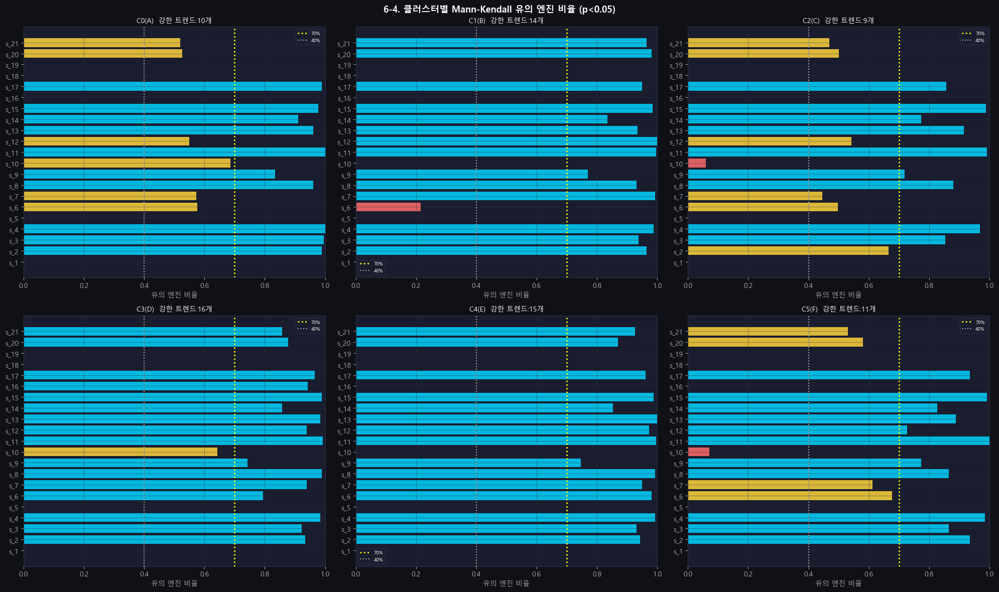

📌 클러스터별로 나누면 전체 기준(Section 5-1)보다 트렌드가 명확하게 나타남


In [34]:
print('=== 6-4. Mann-Kendall 검정 (클러스터별) ===')
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('6-4. 클러스터별 Mann-Kendall 유의 엔진 비율 (p<0.05)',
             fontsize=13, fontweight='bold')

for c, ax in zip(range(N_CLUSTERS), axes.flat):
    sub_c = train_raw[train_raw['op_cluster']==c]
    mk_rows_c = []
    for s in SENSOR_COLS:
        taus, ps = [], []
        for uid in sub_c['unit_nr'].unique():
            arr = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')[s].values
            if len(arr)>=8:
                tau, p = kendalltau(np.arange(len(arr)), arr)
                if np.isfinite(tau): taus.append(tau); ps.append(p)
        sig_ratio = np.mean([p<0.05 for p in ps]) if ps else np.nan
        mk_rows_c.append({'센서':s,'유의 엔진 비율':sig_ratio if np.isfinite(sig_ratio) else 0})
    mk_df_c = pd.DataFrame(mk_rows_c).set_index('센서')
    sig_vals = mk_df_c['유의 엔진 비율'].fillna(0).values
    bc = [C[0] if v>=0.7 else C[3] if v>=0.4 else C[1] for v in sig_vals]
    ax.barh(SENSOR_COLS, sig_vals, color=bc, alpha=0.85)
    ax.axvline(0.7, color='yellow', lw=2, ls=':', label='70%')
    ax.axvline(0.4, color=GRAY, lw=1.5, ls=':', label='40%')
    n_strong = sum(v>=0.7 for v in sig_vals)
    ax.set_title(f'C{c}({CLUSTER_MAP[c]})  강한 트렌드:{n_strong}개', fontsize=10)
    ax.set_xlabel('유의 엔진 비율'); ax.legend(fontsize=7); ax.set_xlim(0,1)

plt.tight_layout(); plt.show()
print('📌 클러스터별로 나누면 전체 기준(Section 5-1)보다 트렌드가 명확하게 나타남')


### 📊 6-4. 클러스터별 Mann-Kendall 결과
- 강한 트렌드 센서 수: 9~16개 (클러스터마다 다름)  
- **Section 5-1(전체 기준)에서 불명확했던 트렌드 → 클러스터별로 나누면 명확해짐**
- `s_2`, `s_3`, `s_4`, `s_11`, `s_15`, `s_17` → 모든 클러스터 공통 강한 열화 신호

### 6-5. RUL Cap 검증 (115 vs 120 vs 125 vs 130 vs 135)

=== 6-5. RUL Cap 검증 ===
--- cap별 초과 엔진 비율 ---
  cap=115: 100.0% 엔진 초과
  cap=120: 100.0% 엔진 초과
  cap=125: 100.0% 엔진 초과
  cap=130: 99.2% 엔진 초과
  cap=135: 98.5% 엔진 초과


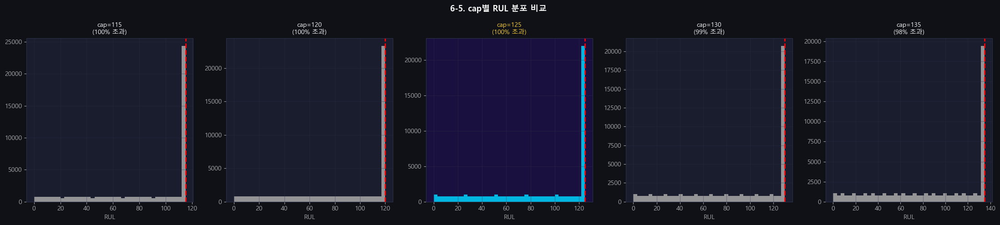


--- cap별 RUL 분포 균등성 (엔트로피) ---
  cap=115: 엔트로피=2.8053
  cap=120: 엔트로피=2.8925
  cap=125: 엔트로피=2.9783
  cap=130: 엔트로피=3.0626
  cap=135: 엔트로피=3.1449

📌 cap=115/120/125 모두 100% 엔진 초과
   FD001과 동일하게 cap=125 유지 (팀 논의 후 120으로 변경 가능)


In [35]:
print('=== 6-5. RUL Cap 검증 ===')
tr_cap = train_raw.copy()
mc4 = tr_cap.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_cap = tr_cap.join(mc4, on='unit_nr')
tr_cap['RUL_raw'] = tr_cap['max_c'] - tr_cap['time_cycles']
lifecycles2 = tr_cap.groupby('unit_nr')['max_c'].first()

caps = [115, 120, 125, 130, 135]
print('--- cap별 초과 엔진 비율 ---')
for cap in caps:
    pct = (lifecycles2>cap).mean()*100
    print(f'  cap={cap}: {pct:.1f}% 엔진 초과')

fig, axes = plt.subplots(1, 5, figsize=(22, 5), sharey=False)
fig.suptitle('6-5. cap별 RUL 분포 비교', fontsize=13, fontweight='bold')
for ax, cap in zip(axes, caps):
    rul_capped = tr_cap['RUL_raw'].clip(upper=cap)
    pct = (lifecycles2>cap).mean()*100
    ax.hist(rul_capped, bins=40, color=C[0] if cap==RUL_CAP else GRAY, alpha=0.85, edgecolor='none')
    ax.axvline(cap, color='red', ls='--', lw=2)
    ax.set_title(f'cap={cap}\n({pct:.0f}% 초과)',
                 color='#ffd43b' if cap==RUL_CAP else WHITE, fontsize=10)
    ax.set_xlabel('RUL')
    if cap==RUL_CAP: ax.patch.set_facecolor('#1a1040')
plt.tight_layout(); plt.show()

from scipy.stats import entropy as sp_entropy
print('\n--- cap별 RUL 분포 균등성 (엔트로피) ---')
for cap in caps:
    rul_capped = tr_cap['RUL_raw'].clip(upper=cap)
    hist, _ = np.histogram(rul_capped, bins=50)
    hist = hist/hist.sum()
    ent = sp_entropy(hist+1e-10)
    print(f'  cap={cap}: 엔트로피={ent:.4f}')
print('\n📌 cap=115/120/125 모두 100% 엔진 초과')
print('   FD001과 동일하게 cap=125 유지 (팀 논의 후 120으로 변경 가능)')


### 📊 6-5. RUL Cap 검증 결과
- cap=115/120/125 모두 **100% 엔진 초과** → 세 값 모두 유효한 선택지  
- 엔트로피: cap 클수록 균등 → cap=125 유리  
- **DL 실험에서 120 vs 125 비교 실험으로 최종 결정 필요 → 현재 cap=125 유지**

### 6-6. Gaussian σ 검증 (클러스터별)

=== 6-6. Gaussian σ 검증 (클러스터별) ===


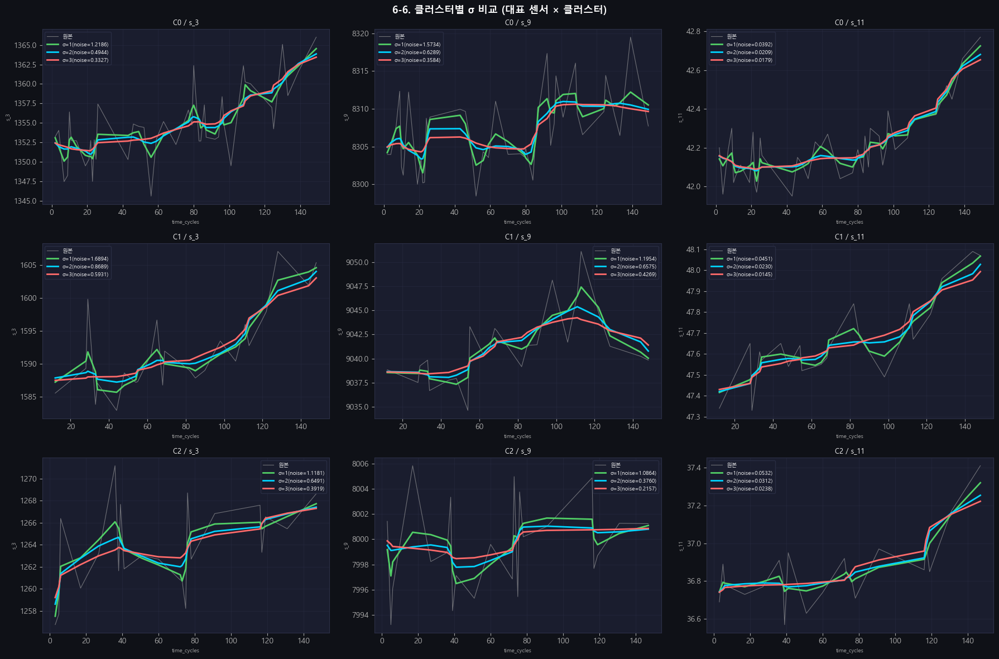


--- 클러스터별 σ에 따른 평균 노이즈 수준 ---
C0: σ=1: 0.3777  σ=2: 0.1962  σ=3: 0.1458  
C1: σ=1: 0.4168  σ=2: 0.2333  σ=3: 0.1767  
C2: σ=1: 0.3875  σ=2: 0.2013  σ=3: 0.1468  
C3: σ=1: 0.3853  σ=2: 0.2041  σ=3: 0.1509  
C4: σ=1: 0.4205  σ=2: 0.2392  σ=3: 0.1834  
C5: σ=1: 0.4158  σ=2: 0.2316  σ=3: 0.1730  

📌 σ=1→2: 노이즈 약 50% 감소  σ=2→3: 추가 효과 미미 → σ=2 유지


In [36]:
print('=== 6-6. Gaussian σ 검증 (클러스터별) ===')
sigmas_test = [1, 2, 3]
show_clusters_sg = [0, 1, 2]
show_sensors_sg  = [s for s in ['s_3','s_9','s_11'] if s in USEFUL_SENSORS]
if len(show_sensors_sg)<2: show_sensors_sg = USEFUL_SENSORS[:3]

fig, axes = plt.subplots(len(show_clusters_sg), len(show_sensors_sg), figsize=(18, 12))
fig.suptitle('6-6. 클러스터별 σ 비교 (대표 센서 × 클러스터)', fontsize=13, fontweight='bold')

for ri, c in enumerate(show_clusters_sg):
    sub_c = train_raw[train_raw['op_cluster']==c]
    uid_s = sub_c['unit_nr'].unique()[0]
    udf_s = sub_c[sub_c['unit_nr']==uid_s].sort_values('time_cycles')
    for ci, s in enumerate(show_sensors_sg):
        ax = axes[ri, ci]
        raw = udf_s[s].values.astype(np.float32)
        ax.plot(udf_s['time_cycles'], raw, color=GRAY, lw=0.8, alpha=0.6, label='원본')
        for sig, col in zip(sigmas_test, [C[2],C[0],C[1]]):
            sm = gaussian_filter1d(raw, sigma=sig, mode='nearest')
            noise = np.std(np.diff(sm))
            ax.plot(udf_s['time_cycles'], sm, color=col, lw=2, label=f'σ={sig}(noise={noise:.4f})')
        ax.set_title(f'C{c} / {s}', fontsize=9)
        ax.set_xlabel('time_cycles',fontsize=7); ax.set_ylabel(s,fontsize=7)
        ax.legend(fontsize=7)
plt.tight_layout(); plt.show()

print('\n--- 클러스터별 σ에 따른 평균 노이즈 수준 ---')
for c in range(N_CLUSTERS):
    sub_c = train_raw[train_raw['op_cluster']==c]
    noise_by_sigma = {sig:[] for sig in sigmas_test}
    for s in USEFUL_SENSORS:
        for uid in sub_c['unit_nr'].unique()[:30]:
            arr = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')[s].values.astype(np.float32)
            for sig in sigmas_test:
                sm = gaussian_filter1d(arr, sigma=sig, mode='nearest')
                noise_by_sigma[sig].append(np.std(np.diff(sm)))
    print(f'C{c}: ', end='')
    for sig in sigmas_test: print(f'σ={sig}: {np.mean(noise_by_sigma[sig]):.4f}  ', end='')
    print()
print('\n📌 σ=1→2: 노이즈 약 50% 감소  σ=2→3: 추가 효과 미미 → σ=2 유지')


### 📊 6-6. Gaussian σ 검증 결과
- σ=1→2: 노이즈 50% 감소 (효과 큼) / σ=2→3: 추가 효과 미미  
- 클러스터별 노이즈 수준 비슷 → 클러스터마다 다른 σ 불필요  
- **FD001과 동일하게 σ=2 유지 확정**

---
## 7. 기울기(Slope) 분석 — 클러스터별 열화율 정량화 [EDA 고유]

> 엔진별·클러스터별로 선형 회귀 기울기를 계산하여 열화 속도를 정량화합니다.  
> 기울기 절댓값이 클수록 해당 조건에서 센서 변화가 빠름 = 열화율 높음


=== 7. 기울기(Slope) 분석 — 클러스터별 열화율 ===


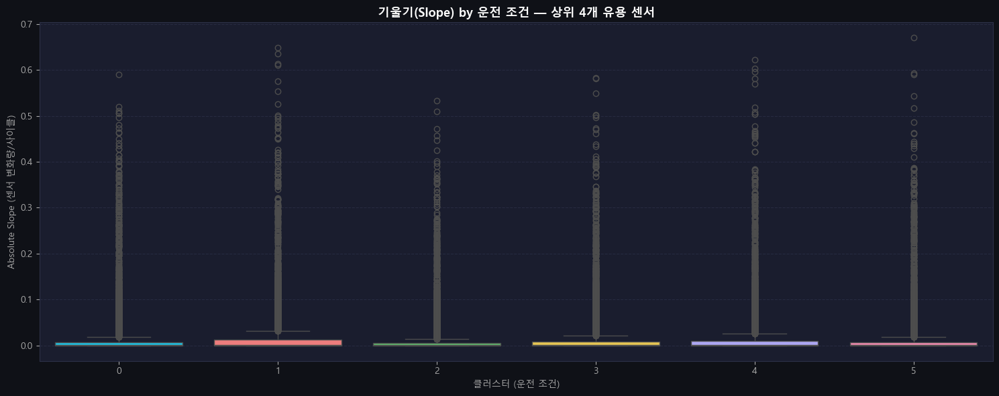


--- 클러스터별 평균 기울기 상위 5개 센서 ---
C0(A): ['s_9', 's_14', 's_4', 's_3', 's_17']
C1(B): ['s_9', 's_14', 's_4', 's_3', 's_17']
C2(C): ['s_9', 's_14', 's_4', 's_3', 's_17']
C3(D): ['s_9', 's_14', 's_4', 's_3', 's_17']
C4(E): ['s_9', 's_14', 's_4', 's_3', 's_17']
C5(F): ['s_9', 's_14', 's_4', 's_3', 's_17']


In [37]:
print('=== 7. 기울기(Slope) 분석 — 클러스터별 열화율 ===')

results = []
for unit in train_raw['unit_nr'].unique():
    unit_df = train_raw[train_raw['unit_nr']==unit]
    for cluster in range(N_CLUSTERS):
        cluster_df = unit_df[unit_df['op_cluster']==cluster]
        if len(cluster_df)>5:
            for sensor in USEFUL_SENSORS:
                slope, _, _, _, _ = scipy_linregress(cluster_df['time_cycles'], cluster_df[sensor])
                results.append({'unit_nr':unit,'Cluster':cluster,'Sensor':sensor,'Slope':abs(slope)})

slope_df = pd.DataFrame(results)

plt.figure(figsize=(15, 6))
sns.boxplot(data=slope_df, x='Cluster', y='Slope',
            palette=[CLUSTER_COLORS[c] for c in range(N_CLUSTERS)])
plt.title('기울기(Slope) by 운전 조건 — 상위 4개 유용 센서', fontsize=13, fontweight='bold')
plt.ylabel('Absolute Slope (센서 변화량/사이클)')
plt.xlabel('클러스터 (운전 조건)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout(); plt.show()

# 클러스터별 상위 기울기 센서
print('\n--- 클러스터별 평균 기울기 상위 5개 센서 ---')
for c in range(N_CLUSTERS):
    sub = slope_df[slope_df['Cluster']==c]
    top = sub.groupby('Sensor')['Slope'].mean().sort_values(ascending=False).head(5)
    print(f'C{c}({CLUSTER_MAP[c]}): {list(top.index)}')


---
## 8. pingouin 기반 통계 검정 [EDA 고유]

### 8-1. 센서 평균 차이 검정 (ANOVA/Welch + 사후검정)


In [38]:
try:
    import pingouin as pg

    def analyze_sensor_mean_by_cluster(df, sensor_name):
        print(f'\n{"="*70}')
        print(f' [{sensor_name}] 운행 조건별 평균 센서량 차이 검정')
        print('='*70)

        data = df[['op_cluster', sensor_name]].dropna()

        # 등분산성 검정
        levene_test = pg.homoscedasticity(data=data, dv=sensor_name, group='op_cluster', method='levene')
        is_equal_var = levene_test.iloc[0, 0]
        levene_p    = levene_test.iloc[0, 1]
        print(f'  등분산성: {"만족" if is_equal_var else "위배"} (p={levene_p:.5f})')

        if is_equal_var:
            print('  → One-way ANOVA 수행')
            aov = pg.anova(dv=sensor_name, between='op_cluster', data=data)
            posthoc_method = 'tukey'
        else:
            print("  → Welch's ANOVA 수행")
            aov = pg.welch_anova(dv=sensor_name, between='op_cluster', data=data)
            posthoc_method = 'gameshowell'

        p_cols = [c for c in aov.columns if any(x in c.lower() for x in ['p-','p_val','pvalue','p-unc']) or c.lower()=='p']
        anova_p = aov[p_cols[0]].values[0] if p_cols else aov.iloc[0,-1]
        print(f'  ANOVA p-value: {anova_p:.6f}  → {"차이 있음 ✅" if anova_p<0.05 else "차이 없음"}')

        if anova_p<0.05:
            if posthoc_method=='tukey':
                posthoc = pg.pairwise_tukey(dv=sensor_name, between='op_cluster', data=data)
            else:
                posthoc = pg.pairwise_gameshowell(dv=sensor_name, between='op_cluster', data=data)
            ph_p_cols = [c for c in posthoc.columns if any(x in c.lower() for x in ['p-','pvalue','p-adj']) or c.lower()=='p']
            ph_p_col = ph_p_cols[0] if ph_p_cols else posthoc.columns[-1]
            significant = posthoc[posthoc[ph_p_col]<0.05]
            if not significant.empty:
                display_cols = [c for c in ['A','B','diff',ph_p_col] if c in posthoc.columns]
                print(f'  유의한 클러스터 쌍:')
                display(significant[display_cols].sort_values('diff',ascending=False).head(10))

    # 대표 센서 2개 검정
    for s in ['s_2', 's_11']:
        if s in USEFUL_SENSORS:
            analyze_sensor_mean_by_cluster(train_raw, s)

except ImportError:
    print('⚠️ pingouin이 설치되지 않았습니다. pip install pingouin 실행 후 재시도하세요.')



 [s_2] 운행 조건별 평균 센서량 차이 검정
  등분산성: 만족 (p=0.00000)
  → One-way ANOVA 수행
  ANOVA p-value: 0.999858  → 차이 없음

 [s_11] 운행 조건별 평균 센서량 차이 검정
  등분산성: 만족 (p=0.00000)
  → One-way ANOVA 수행
  ANOVA p-value: 0.994523  → 차이 없음


### 8-2. 클러스터별 추세(Slope) 차이 검정 [EDA 고유]

In [39]:
try:
    import pingouin as pg

    def analyze_trend_difference(df, sensor_name):
        print(f'\n{"="*70}')
        print(f' [{sensor_name}] 클러스터별 추세(Slope) 차이 검정')
        print('='*70)

        slopes = []
        for (unit, cluster), group in df.groupby(['unit_nr','op_cluster']):
            if len(group)<2: continue
            X = group['time_cycles'].values.reshape(-1,1)
            y = group[sensor_name].values
            model = LinearRegression().fit(X, y)
            slopes.append({'unit_NR':unit,'op_cluster':cluster,'Slope_Value':model.coef_[0]})

        slope_df_local = pd.DataFrame(slopes)

        levene_test = pg.homoscedasticity(data=slope_df_local, dv='Slope_Value', group='op_cluster')
        is_equal_var = levene_test.iloc[0, 0]

        if is_equal_var:
            print('  등분산 → One-way ANOVA')
            aov = pg.anova(dv='Slope_Value', between='op_cluster', data=slope_df_local)
        else:
            print("  등분산 위배 → Welch's ANOVA")
            aov = pg.welch_anova(dv='Slope_Value', between='op_cluster', data=slope_df_local)

        p_cols = [c for c in aov.columns if any(x in c.lower() for x in ['p-','p_val','pvalue','p-unc']) or c.lower()=='p']
        anova_p = aov[p_cols[0]].values[0] if p_cols else aov.iloc[0,-1]
        print(f'  ANOVA p-value: {anova_p:.6f}  → {"클러스터별 추세 차이 있음 ✅" if anova_p<0.05 else "추세 차이 없음"}')

    for s in ['s_3', 's_7']:
        if s in USEFUL_SENSORS:
            analyze_trend_difference(train_raw, s)

except ImportError:
    print('⚠️ pingouin이 설치되지 않았습니다.')



 [s_3] 클러스터별 추세(Slope) 차이 검정
  등분산 → One-way ANOVA
  ANOVA p-value: 0.043652  → 클러스터별 추세 차이 있음 ✅

 [s_7] 클러스터별 추세(Slope) 차이 검정
  등분산 → One-way ANOVA
  ANOVA p-value: 0.599453  → 추세 차이 없음


---
## 9. 결정 2 — Piecewise RUL 생성 (Cap = 125)


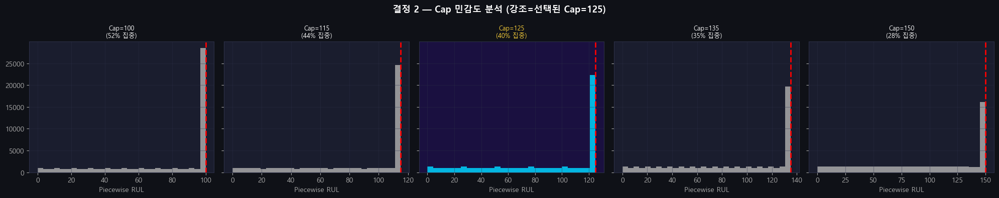

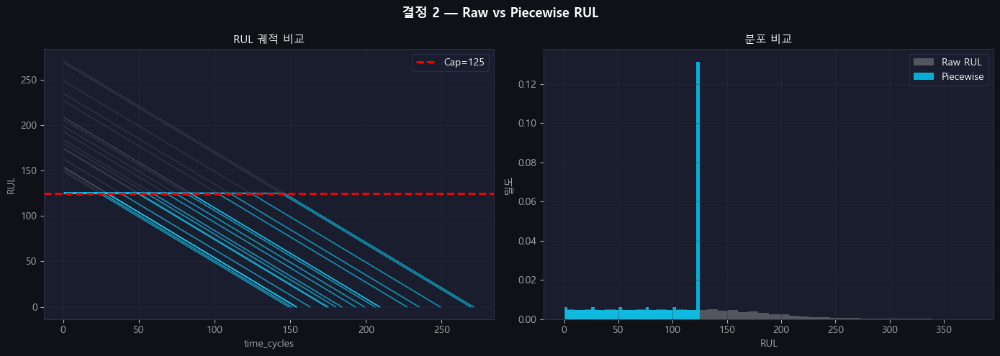

✅ 결정 2 완료  RUL Cap=125


In [40]:
def add_piecewise_rul(df, cap=RUL_CAP):
    df = df.copy()
    mc = df.groupby('unit_nr')['time_cycles'].max().rename('max_c')
    df = df.join(mc, on='unit_nr')
    df['RUL_raw'] = df['max_c'] - df['time_cycles']
    df['RUL']     = df['RUL_raw'].clip(upper=cap)
    return df.drop('max_c', axis=1)

train_s2 = add_piecewise_rul(train_s1)
test_s2  = test_s1.copy()

caps_sens = [100, 115, 125, 135, 150]
fig, axes = plt.subplots(1, 5, figsize=(20, 4), sharey=True)
fig.suptitle('결정 2 — Cap 민감도 분석 (강조=선택된 Cap=125)', fontsize=13, fontweight='bold')
for ax, cap in zip(axes, caps_sens):
    tmp = train_s2['RUL_raw'].clip(upper=cap)
    pct = (train_s2['RUL_raw']>=cap).mean()*100
    ax.hist(tmp, bins=30, color=C[0] if cap==RUL_CAP else GRAY, alpha=0.85, edgecolor='none')
    ax.axvline(cap, color='red', ls='--', lw=2)
    ax.set_title(f'Cap={cap}\n({pct:.0f}% 집중)',
                 color='#ffd43b' if cap==RUL_CAP else WHITE, fontsize=9)
    ax.set_xlabel('Piecewise RUL')
    if cap==RUL_CAP: ax.patch.set_facecolor('#1a1040')
plt.tight_layout(); plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 2 — Raw vs Piecewise RUL', fontsize=13, fontweight='bold')
ax = axes[0]
for u in train_s2['unit_nr'].unique()[:20]:
    sub = train_s2[train_s2['unit_nr']==u].sort_values('time_cycles')
    ax.plot(sub['time_cycles'], sub['RUL_raw'], color=GRAY, alpha=0.2, lw=0.8)
    ax.plot(sub['time_cycles'], sub['RUL'],     color=C[0], alpha=0.6, lw=1.2)
ax.axhline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.set_xlabel('time_cycles'); ax.set_ylabel('RUL'); ax.set_title('RUL 궤적 비교'); ax.legend()
axes[1].hist(train_s2['RUL_raw'], bins=40, alpha=0.4, color=GRAY,  density=True, label='Raw RUL')
axes[1].hist(train_s2['RUL'],     bins=40, alpha=0.8, color=C[0], density=True, label='Piecewise')
axes[1].set_xlabel('RUL'); axes[1].set_ylabel('밀도'); axes[1].set_title('분포 비교'); axes[1].legend()
plt.tight_layout(); plt.show()

print(f'✅ 결정 2 완료  RUL Cap={RUL_CAP}')


## 10. 결정 3 — 클러스터별 Gaussian 스무딩 (σ = 2)

> **FD001과 차이:** 전체 스무딩 → **클러스터별 스무딩**  
> 조건 전환 지점에서 인위적 평탄화 방지. val split **이전**에 train/test 전체 적용.


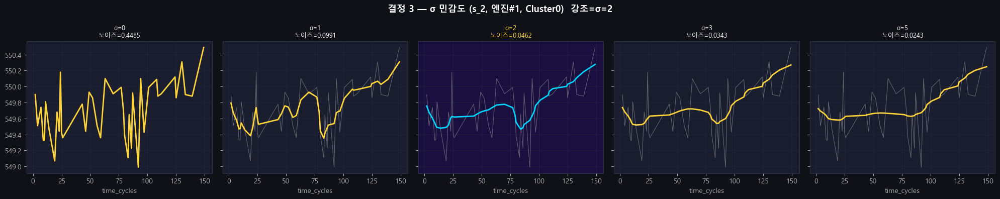

✅ 결정 3 완료  (클러스터별 Gaussian σ=2)


In [41]:
def apply_gaussian_by_cluster(df, features, sigma=GAUSS_SIGMA):
    df = df.copy().sort_values(['unit_nr','time_cycles']).reset_index(drop=True)
    grp = df.groupby(['unit_nr','op_cluster'])
    def _smooth(s):
        arr = s.values.astype(np.float32)
        if len(arr)>1:
            return pd.Series(gaussian_filter1d(arr, sigma=sigma, mode='nearest'), index=s.index)
        return s
    for s in features:
        df[s] = grp[s].transform(_smooth)
    return df

train_s3 = apply_gaussian_by_cluster(train_s2, USEFUL_SENSORS)
test_s3  = apply_gaussian_by_cluster(test_s2,  USEFUL_SENSORS)

# 전후 비교 (대표 셀)
uid_ex = train_s2['unit_nr'].iloc[0]
c_ex   = train_s2[train_s2['unit_nr']==uid_ex]['op_cluster'].mode()[0]
varying = [s for s in USEFUL_SENSORS if train_s2[train_s2['op_cluster']==c_ex][s].std()>0.01]
s_ex = varying[0] if varying else USEFUL_SENSORS[0]

unit_sub = train_s2[(train_s2['unit_nr']==uid_ex)&(train_s2['op_cluster']==c_ex)].sort_values('time_cycles')
unit_sub_after = train_s3[(train_s3['unit_nr']==uid_ex)&(train_s3['op_cluster']==c_ex)].sort_values('time_cycles')

sigmas_list = [0, 1, 2, 3, 5]
fig, axes = plt.subplots(1, 5, figsize=(20, 4), sharey=True)
fig.suptitle(f'결정 3 — σ 민감도 ({s_ex}, 엔진#{uid_ex}, Cluster{c_ex})  강조=σ=2', fontsize=13, fontweight='bold')
for ax, sig in zip(axes, sigmas_list):
    y_raw = unit_sub[s_ex].values
    y_f   = gaussian_filter1d(y_raw, sigma=sig, mode='nearest') if sig>0 else y_raw
    noise = np.std(np.diff(y_f)) if len(y_f)>1 else 0
    ax.plot(unit_sub['time_cycles'], y_raw, color=GRAY, alpha=0.5, lw=0.8)
    ax.plot(unit_sub['time_cycles'], y_f, color=C[0] if sig==GAUSS_SIGMA else C[3], lw=2)
    ax.set_title(f'σ={sig}\n노이즈={noise:.4f}', color='#ffd43b' if sig==GAUSS_SIGMA else WHITE, fontsize=9)
    if sig==GAUSS_SIGMA: ax.patch.set_facecolor('#1a1040')
    ax.set_xlabel('time_cycles')
plt.tight_layout(); plt.show()
print(f'✅ 결정 3 완료  (클러스터별 Gaussian σ={GAUSS_SIGMA})')


## 11. 결정 4 — Validation 분할 (엔진 단위 random 80:20, seed=42)


전체 엔진: 260대  |  Sub-train: 208대  |  Validation: 52대  ✅


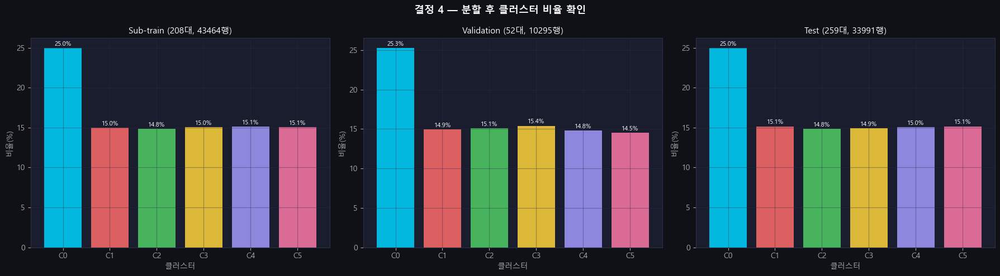

,구분,행 수,엔진 수,클러스터 수,RUL 포함
0,Sub-train,43464,208,6,예
1,Validation,10295,52,6,예
2,Test,33991,259,6,아니오


In [42]:
VALID_RATIO  = 0.2
RANDOM_STATE = 42

all_units = train_s3['unit_nr'].unique()
subtrain_units, valid_units = train_test_split(all_units, test_size=VALID_RATIO, random_state=RANDOM_STATE)

subtrain_common = train_s3[train_s3['unit_nr'].isin(subtrain_units)].copy().reset_index(drop=True)
valid_common    = train_s3[train_s3['unit_nr'].isin(valid_units)].copy().reset_index(drop=True)
test_common     = test_s3.copy()

overlap = set(subtrain_units).intersection(set(valid_units))
assert len(overlap)==0, f'❌ 엔진 겹침: {sorted(overlap)[:5]}'
assert len(subtrain_units)+len(valid_units)==len(all_units)

print(f'전체 엔진: {len(all_units)}대  |  Sub-train: {len(subtrain_units)}대  |  Validation: {len(valid_units)}대  ✅')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('결정 4 — 분할 후 클러스터 비율 확인', fontsize=13, fontweight='bold')
for ax, (df, title) in zip(axes, [(subtrain_common,'Sub-train'),(valid_common,'Validation'),(test_common,'Test')]):
    cnts = df['op_cluster'].value_counts().sort_index()
    pcts = cnts/cnts.sum()*100
    ax.bar(pcts.index, pcts.values, color=[CLUSTER_COLORS[i] for i in pcts.index], alpha=0.85)
    ax.set_title(f'{title} ({df["unit_nr"].nunique()}대, {len(df)}행)')
    ax.set_xlabel('클러스터'); ax.set_ylabel('비율(%)')
    ax.set_xticks(range(N_CLUSTERS)); ax.set_xticklabels([f'C{i}' for i in range(N_CLUSTERS)])
    for idx_c, v in pcts.items(): ax.text(idx_c, v+0.3, f'{v:.1f}%', ha='center', fontsize=8)
plt.tight_layout(); plt.show()

display(pd.DataFrame({'구분':['Sub-train','Validation','Test'],
    '행 수':[len(subtrain_common),len(valid_common),len(test_common)],
    '엔진 수':[subtrain_common['unit_nr'].nunique(),valid_common['unit_nr'].nunique(),test_common['unit_nr'].nunique()],
    '클러스터 수':[subtrain_common['op_cluster'].nunique(),valid_common['op_cluster'].nunique(),test_common['op_cluster'].nunique()],
    'RUL 포함':['예','예','아니오']}))

## 12. 결정 5 — 클러스터별 MinMax 정규화

> **FD001과 가장 큰 차이:** 전체 MinMax → **클러스터별 MinMax (6개 scaler)**  
> fit은 **sub-train 클러스터별**로만, valid·test는 동일 scaler로 transform (누수 방지)


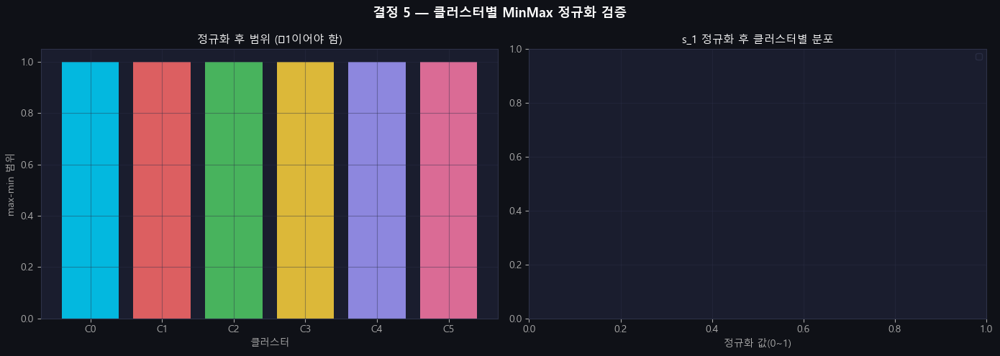

,클러스터,min,max
0,C0,0.0,1.000000
1,C1,0.0,1.000000
2,C2,0.0,1.000000
3,C3,0.0,1.000000
4,C4,0.0,1.000000
5,C5,0.0,1.000004



✅ 결정 5 완료  클러스터별 MinMax 정규화 (6개 scaler)


In [43]:
scalers = {}
subtrain_s4 = subtrain_common.copy()
valid_s4    = valid_common.copy()
test_s4     = test_common.copy()

for c in range(N_CLUSTERS):
    mask = subtrain_s4['op_cluster']==c
    if mask.sum()==0:
        print(f'⚠️ C{c}: sub-train 샘플 없음 — 전체 scaler 사용')
        scaler_c = MinMaxScaler(); scaler_c.fit(subtrain_s4[USEFUL_SENSORS])
    else:
        scaler_c = MinMaxScaler()
        subtrain_s4.loc[mask, USEFUL_SENSORS] = scaler_c.fit_transform(subtrain_s4.loc[mask, USEFUL_SENSORS])
    scalers[c] = scaler_c

for _, df_target in [('valid',valid_s4),('test',test_s4)]:
    for c in range(N_CLUSTERS):
        mask = df_target['op_cluster']==c
        if mask.sum()>0:
            df_target.loc[mask, USEFUL_SENSORS] = scalers[c].transform(df_target.loc[mask, USEFUL_SENSORS])

range_data = []
for c in range(N_CLUSTERS):
    mask = subtrain_s4['op_cluster']==c
    sub  = subtrain_s4.loc[mask, USEFUL_SENSORS]
    range_data.append({'클러스터':f'C{c}','min':sub.min().min(),'max':sub.max().max()})
range_df = pd.DataFrame(range_data)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 5 — 클러스터별 MinMax 정규화 검증', fontsize=13, fontweight='bold')
axes[0].bar(range_df['클러스터'], range_df['max']-range_df['min'],
            color=CLUSTER_COLORS, alpha=0.85)
axes[0].set_xlabel('클러스터'); axes[0].set_ylabel('max-min 범위')
axes[0].set_title('정규화 후 범위 (≈1이어야 함)')

s_show = USEFUL_SENSORS[0]
for c in range(N_CLUSTERS):
    mask = subtrain_s4['op_cluster']==c
    data = subtrain_s4.loc[mask, s_show]
    if len(data)>1:
        try: data.plot.kde(ax=axes[1], color=CLUSTER_COLORS[c], lw=1.5, label=f'C{c}')
        except: pass
axes[1].set_title(f'{s_show} 정규화 후 클러스터별 분포')
axes[1].set_xlabel('정규화 값(0~1)'); axes[1].legend(fontsize=8)
plt.tight_layout(); plt.show()
display(range_df)
print('\n✅ 결정 5 완료  클러스터별 MinMax 정규화 (6개 scaler)')


### 12-1. PCA 시각화 (정규화 후) [EXTRA-F]

=== 12-1. PCA(2D) — colored by RUL / Cluster ===


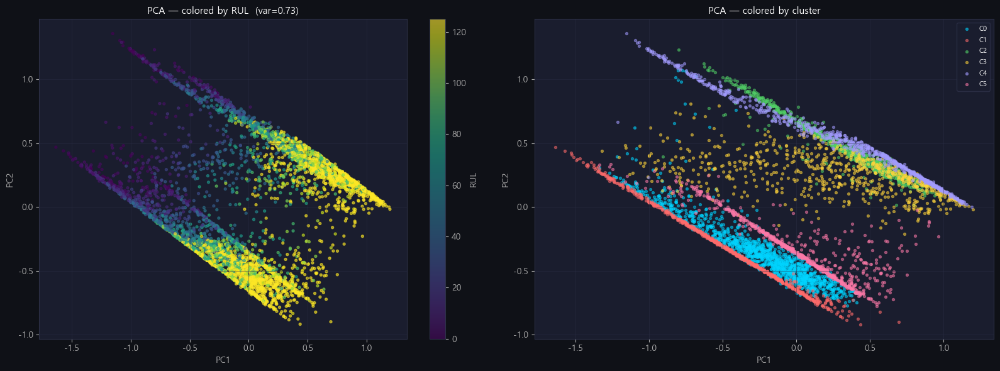

PC1/PC2 explained variance: [0.42214376 0.3092576 ]
📌 클러스터가 PCA 공간에서 분리되면 정규화가 잘 된 것


In [44]:
print('=== 12-1. PCA(2D) — colored by RUL / Cluster ===')
src_n = subtrain_s4.copy()
if 'RUL' not in src_n.columns:
    mc_pca = src_n.groupby('unit_nr')['time_cycles'].max().rename('max_c')
    src_n = src_n.join(mc_pca, on='unit_nr')
    src_n['RUL'] = src_n['max_c'] - src_n['time_cycles']

sample_pca = src_n.sample(min(5000,len(src_n)), random_state=42)
pca = PCA(n_components=2, random_state=42)
Z = pca.fit_transform(sample_pca[USEFUL_SENSORS])

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sc = axes[0].scatter(Z[:,0], Z[:,1], c=sample_pca['RUL'], cmap='viridis', s=8, alpha=0.6)
plt.colorbar(sc, ax=axes[0], label='RUL')
axes[0].set_title(f'PCA — colored by RUL  (var={pca.explained_variance_ratio_.sum():.2f})')
axes[0].set_xlabel('PC1'); axes[0].set_ylabel('PC2')

for c in range(N_CLUSTERS):
    m = sample_pca['op_cluster']==c
    if m.sum()==0: continue
    axes[1].scatter(Z[m,0], Z[m,1], c=CLUSTER_COLORS[c], s=8, alpha=0.5, label=f'C{c}')
axes[1].set_title('PCA — colored by cluster')
axes[1].legend(fontsize=8); axes[1].set_xlabel('PC1'); axes[1].set_ylabel('PC2')
plt.tight_layout(); plt.show()

print(f'PC1/PC2 explained variance: {pca.explained_variance_ratio_}')
print('📌 클러스터가 PCA 공간에서 분리되면 정규화가 잘 된 것')


---
## 13. 전처리 후 검증
### 13-1. 센서 상관관계 전후 비교

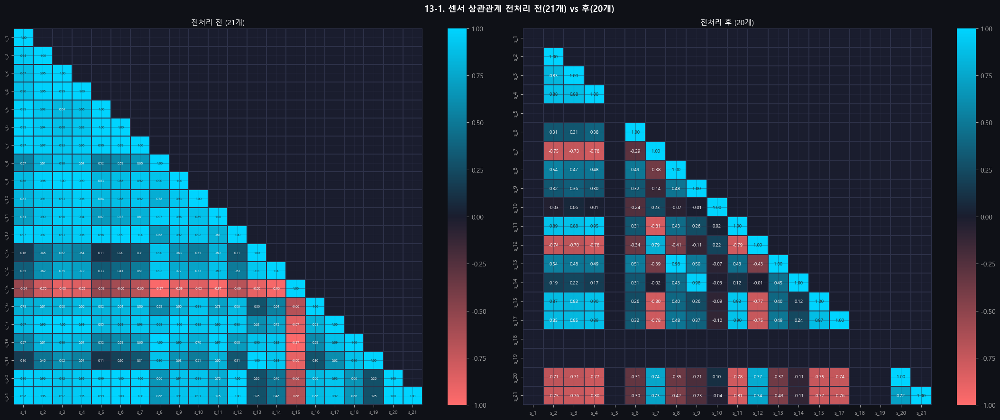

In [45]:
corr_after = subtrain_s4[USEFUL_SENSORS].corr()

fig, axes = plt.subplots(1, 2, figsize=(22, 9))
fig.suptitle('13-1. 센서 상관관계 전처리 전(21개) vs 후(20개)', fontsize=13, fontweight='bold')

mask_b = np.triu(np.ones_like(corr_before, dtype=bool), k=1)
sns.heatmap(corr_before, ax=axes[0], mask=mask_b, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':5},
            linewidths=0.3, linecolor=GRID)
axes[0].set_title('전처리 전 (21개)'); axes[0].tick_params(labelsize=7)

mask_a = np.triu(np.ones_like(corr_after, dtype=bool), k=1)
sns.heatmap(corr_after, ax=axes[1], mask=mask_a, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':7},
            linewidths=0.3, linecolor=GRID)
axes[1].set_title(f'전처리 후 ({len(USEFUL_SENSORS)}개)'); axes[1].tick_params(labelsize=8)
plt.tight_layout(); plt.show()


### 13-2. 센서 분포 전처리 전후 비교

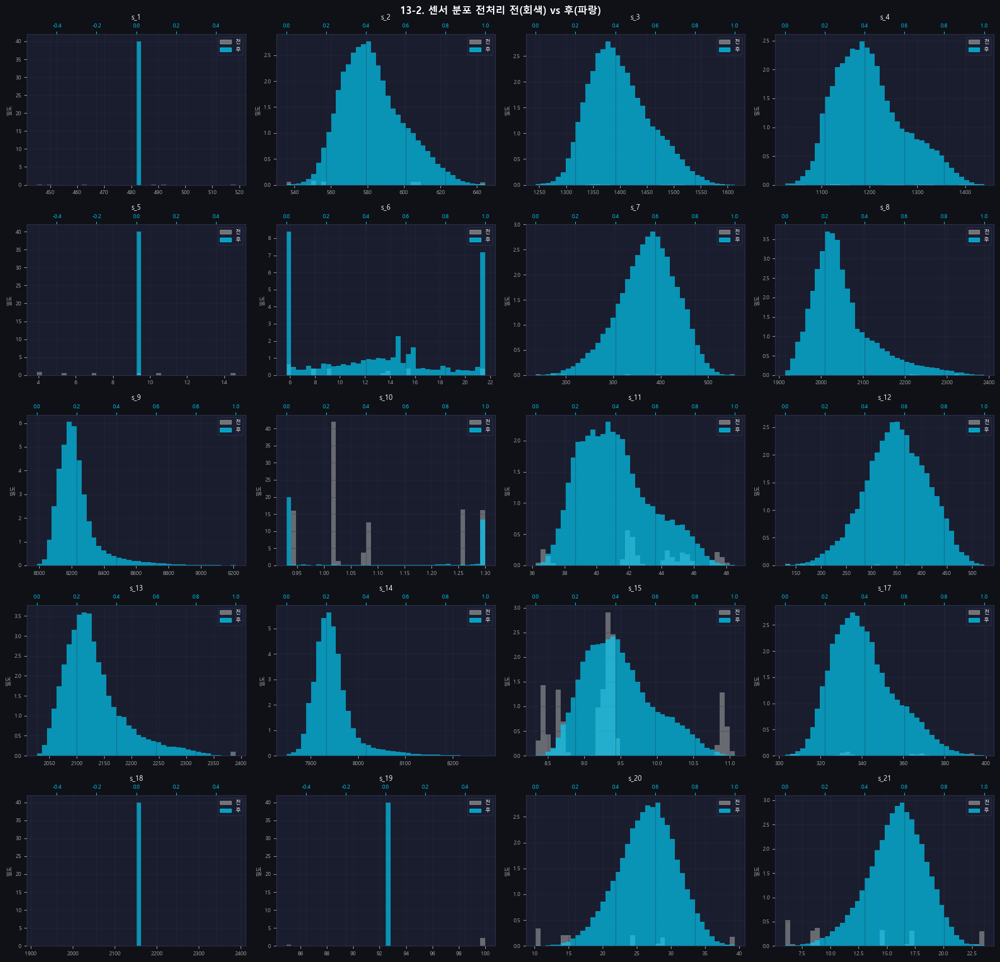

📌 FD002: 전처리 전 멀티모달 분포 → 클러스터별 정규화 후 균일한 분포


In [46]:
n_cols = 4
n_rows = (len(USEFUL_SENSORS)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows*3.5))
fig.suptitle('13-2. 센서 분포 전처리 전(회색) vs 후(파랑)', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, USEFUL_SENSORS):
    before_data = train_raw[s]; after_data = subtrain_s4[s]
    ax2 = ax.twiny()
    ax.hist(before_data,  bins=40, color=GRAY, alpha=0.55, density=True, edgecolor='none')
    ax2.hist(after_data, bins=40, color=C[0],  alpha=0.65, density=True, edgecolor='none')
    ax.set_title(s, fontsize=9); ax.set_ylabel('밀도', fontsize=7)
    ax.tick_params(labelsize=7); ax2.tick_params(labelsize=7, colors=C[0])
    handles = [mpatches.Patch(color=GRAY,alpha=0.6,label='전'),
               mpatches.Patch(color=C[0],alpha=0.7,label='후')]
    ax.legend(handles=handles, fontsize=7, loc='upper right')
for ax in axes.flat[len(USEFUL_SENSORS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()
print('📌 FD002: 전처리 전 멀티모달 분포 → 클러스터별 정규화 후 균일한 분포')


### 13-3. Train vs Test 분포 비교 (KS + BH-FDR)

=== 13-3. Train vs Test 분포 비교 (KS + BH-FDR) ===


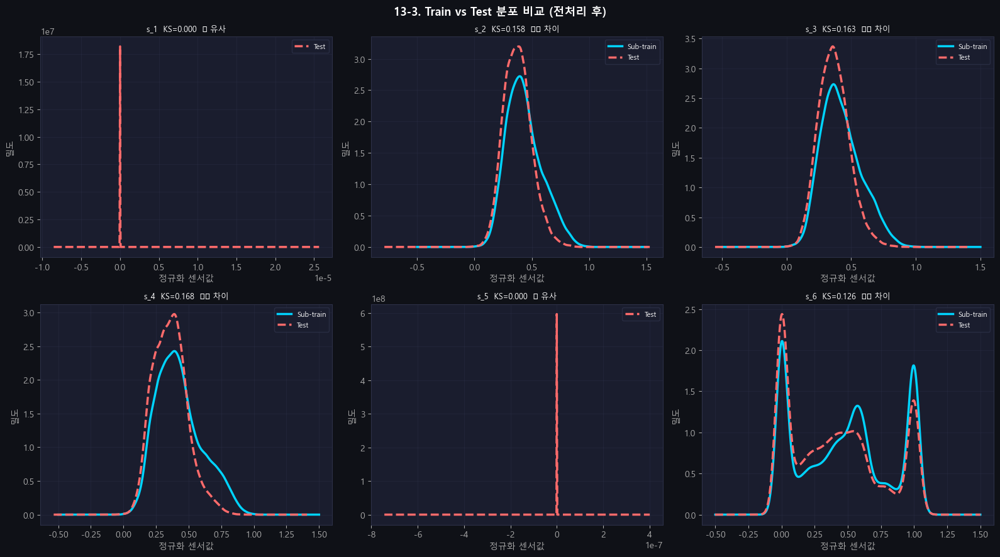

,센서,KS,p,p_adj_BH,판정_BH
0,s_1,0.0001,1.0,1.0,유사 ✅
1,s_2,0.1582,0.0,0.0,차이 ⚠️
2,s_3,0.1633,0.0,0.0,차이 ⚠️
3,s_4,0.1681,0.0,0.0,차이 ⚠️
4,s_5,0.0001,1.0,1.0,유사 ✅
5,s_6,0.1259,0.0,0.0,차이 ⚠️
6,s_7,0.1297,0.0,0.0,차이 ⚠️
7,s_8,0.0756,0.0,0.0,차이 ⚠️
8,s_9,0.1059,0.0,0.0,차이 ⚠️
9,s_10,0.3247,0.0,0.0,차이 ⚠️


📌 FD002: 운전 조건 혼재 설계로 Train/Test 분포 차이가 있을 수 있음


In [47]:
print('=== 13-3. Train vs Test 분포 비교 (KS + BH-FDR) ===')
show6 = USEFUL_SENSORS[:6]
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('13-3. Train vs Test 분포 비교 (전처리 후)', fontsize=13, fontweight='bold')
ks_rows = []
for ax, s in zip(axes.flat, show6):
    tr_v = subtrain_s4[s].dropna(); te_v = test_s4[s].dropna()
    try: tr_v.plot.kde(ax=ax, color=C[0], lw=2.5, label='Sub-train')
    except: pass
    try: te_v.plot.kde(ax=ax, color=C[1], lw=2.5, ls='--', label='Test')
    except: pass
    ks_stat, ks_p = ks_2samp(tr_v, te_v)
    verdict = '✅ 유사' if ks_p>0.05 else '⚠️ 차이'
    ks_rows.append({'센서':s,'KS':round(ks_stat,4),'p':round(ks_p,4),'판정':verdict})
    ax.set_title(f'{s}  KS={ks_stat:.3f}  {verdict}',fontsize=9)
    ax.set_xlabel('정규화 센서값'); ax.set_ylabel('밀도'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

_all_ks = [ks_2samp(subtrain_s4[s].dropna(),test_s4[s].dropna()) for s in USEFUL_SENSORS]
_pks = [p for _,p in _all_ks]
_rej_ks, _padj_ks, *_ = multipletests(_pks, alpha=0.05, method='fdr_bh')
ks_full = pd.DataFrame({'센서':USEFUL_SENSORS,'KS':[round(k,4) for k,_ in _all_ks],
                         'p':[round(p,4) for _,p in _all_ks],'p_adj_BH':np.round(_padj_ks,4),
                         '판정_BH':['차이 ⚠️' if r else '유사 ✅' for r in _rej_ks]})
display(ks_full)
print('📌 FD002: 운전 조건 혼재 설계로 Train/Test 분포 차이가 있을 수 있음')


### 13-4. 클러스터별 RUL 상관계수 비교 [FD002 전용]

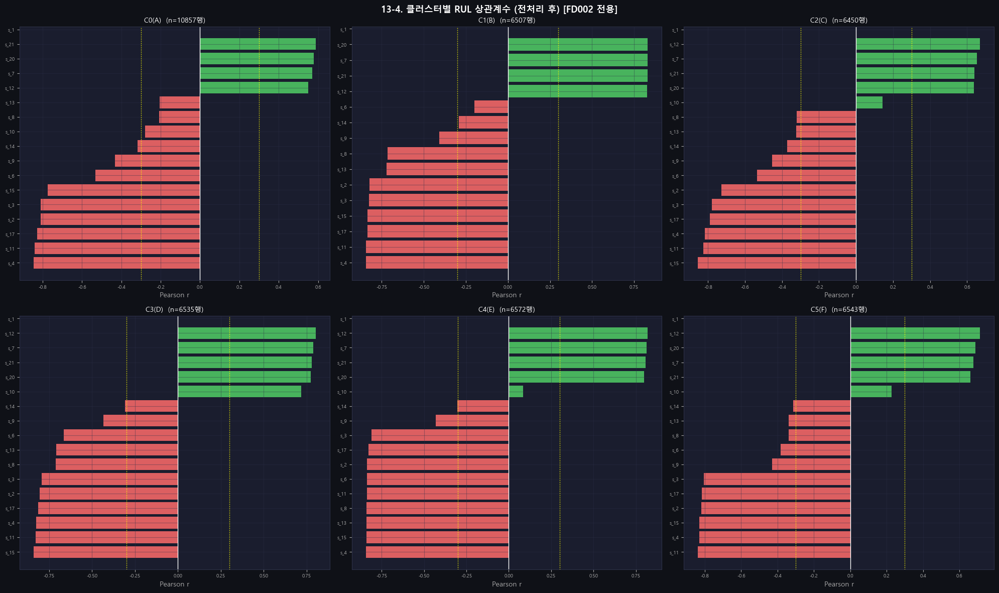

--- 클러스터별 |r|>0.3 고상관 센서 ---
  C0: ['s_4', 's_11', 's_17', 's_2', 's_3', 's_15', 's_6', 's_9', 's_14', 's_12', 's_7', 's_20', 's_21']
  C1: ['s_4', 's_11', 's_17', 's_15', 's_3', 's_2', 's_13', 's_8', 's_9', 's_12', 's_21', 's_7', 's_20']
  C2: ['s_15', 's_11', 's_4', 's_17', 's_3', 's_2', 's_6', 's_9', 's_14', 's_13', 's_8', 's_20', 's_21', 's_7', 's_12']
  C3: ['s_15', 's_11', 's_4', 's_17', 's_2', 's_3', 's_8', 's_13', 's_6', 's_9', 's_14', 's_10', 's_20', 's_21', 's_7', 's_12']
  C4: ['s_4', 's_15', 's_13', 's_8', 's_11', 's_6', 's_2', 's_17', 's_3', 's_9', 's_14', 's_20', 's_21', 's_7', 's_12']
  C5: ['s_11', 's_4', 's_15', 's_2', 's_17', 's_3', 's_9', 's_6', 's_8', 's_13', 's_14', 's_21', 's_7', 's_20', 's_12']


In [48]:
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('13-4. 클러스터별 RUL 상관계수 (전처리 후) [FD002 전용]', fontsize=13, fontweight='bold')

cluster_corr_after_dict = {}
for ax, c in zip(axes.flat, range(N_CLUSTERS)):
    mask = subtrain_s4['op_cluster']==c
    sub  = subtrain_s4[mask]
    if 'RUL' not in sub.columns or len(sub)<10: ax.set_visible(False); continue
    corr = sub[USEFUL_SENSORS+['RUL']].corr()['RUL'][USEFUL_SENSORS].sort_values()
    cluster_corr_after_dict[c] = corr
    bc = [C[1] if v<0 else C[2] for v in corr]
    ax.barh(corr.index, corr.values, color=bc, alpha=0.85)
    ax.axvline(0, color='white', lw=1)
    ax.axvline(0.3, color='yellow', lw=1, ls=':'); ax.axvline(-0.3, color='yellow', lw=1, ls=':')
    ax.set_title(f'C{c}({CLUSTER_MAP[c]})  (n={mask.sum()}행)', fontsize=10)
    ax.set_xlabel('Pearson r'); ax.tick_params(labelsize=7)
plt.tight_layout(); plt.show()

print('--- 클러스터별 |r|>0.3 고상관 센서 ---')
for c, corr in cluster_corr_after_dict.items():
    high = corr[corr.abs()>0.3].index.tolist()
    print(f'  C{c}: {high}')


### 13-5. RUL 상관계수 전후 변화

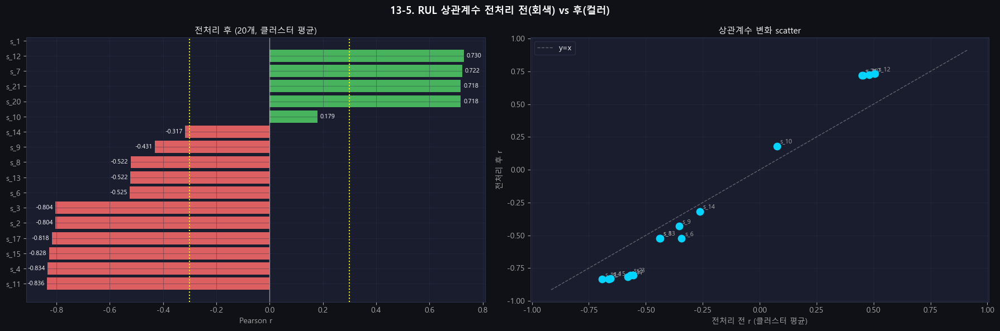

📌 전처리 후 RUL 상관계수가 개선됐는지 확인 (조건 혼재 효과 제거 효과)


In [49]:
# RUL 상관계수 전후 비교
cluster_rul_corrs_after = [corr for _, corr in sorted(cluster_corr_after_dict.items())]
rul_corr_after = pd.concat(cluster_rul_corrs_after, axis=1).mean(axis=1).sort_values()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('13-5. RUL 상관계수 전처리 전(회색) vs 후(컬러)', fontsize=13, fontweight='bold')

bc = [C[1] if v<0 else C[2] for v in rul_corr_after]
bars = axes[0].barh(rul_corr_after.index, rul_corr_after.values, color=bc, alpha=0.85)
axes[0].axvline(0, color='white', lw=1, alpha=0.5)
axes[0].axvline(0.3, color='yellow', lw=1.5, ls=':'); axes[0].axvline(-0.3, color='yellow', lw=1.5, ls=':')
axes[0].set_title(f'전처리 후 ({len(USEFUL_SENSORS)}개, 클러스터 평균)')
axes[0].set_xlabel('Pearson r')
for bar, val in zip(bars, rul_corr_after.values):
    axes[0].text(val+(0.01 if val>=0 else -0.01), bar.get_y()+bar.get_height()/2,
                 f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=8)

common_s = [s for s in USEFUL_SENSORS if s in rul_corr_before.index]
r_b = rul_corr_before[common_s]; r_a = rul_corr_after.reindex(common_s).fillna(0)
axes[1].scatter(r_b, r_a, color=C[0], s=80, zorder=5)
for s in common_s:
    axes[1].annotate(s, (r_b[s], r_a.get(s,0)), fontsize=8, color=GRAY, xytext=(4,4), textcoords='offset points')
lim = max(abs(r_b).max(), abs(r_a).max())+0.08
axes[1].plot([-lim,lim],[-lim,lim], color=GRAY, ls='--', lw=1, alpha=0.5, label='y=x')
axes[1].set_xlabel('전처리 전 r (클러스터 평균)'); axes[1].set_ylabel('전처리 후 r')
axes[1].set_title('상관계수 변화 scatter'); axes[1].legend()
plt.tight_layout(); plt.show()
print('📌 전처리 후 RUL 상관계수가 개선됐는지 확인 (조건 혼재 효과 제거 효과)')


---
## 14. [ML 분기] 시계열 파생변수 생성 (엔진×클러스터 단위)

> **FD001과 차이:** 엔진 단위 lag/rolling → **엔진×클러스터 단위**  
> 운전 조건이 혼재된 채 lag를 계산하면 다른 조건의 값이 섞여 들어감


In [50]:
def add_temporal_features_by_cluster(df, sensor_cols, lags, diffs, rolls, roll_stds, emas):
    df = df.sort_values(['unit_nr','time_cycles']).copy()
    for s in sensor_cols:
        grp = df.groupby(['unit_nr','op_cluster'])[s]
        for lag in lags:   df[f'{s}_lag{lag}']     = grp.shift(lag)
        for d in diffs:    df[f'{s}_diff{d}']       = grp.diff(d)
        for r in rolls:    df[f'{s}_roll{r}']       = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).mean())
        for r in roll_stds:df[f'{s}_rollstd{r}']   = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).std().fillna(0))
        for span in emas:  df[f'{s}_ema{span}']     = grp.transform(lambda x,e=span: x.ewm(span=e,adjust=False).mean())

    warmup_steps = max(max(lags) if lags else 0, max(diffs) if diffs else 0, max(rolls) if rolls else 0)
    df['is_warmup'] = (df.groupby(['unit_nr','op_cluster']).cumcount() < warmup_steps).astype(np.int8)
    derived = [c for c in df.columns if c not in (sensor_cols+['unit_nr','time_cycles',
               'setting_1','setting_2','setting_3','op_cluster','RUL','RUL_raw','is_warmup'])]
    df[derived] = df[derived].fillna(df.groupby(['unit_nr','op_cluster'])[derived].transform('mean'))
    df = df.fillna(0)
    return df

subtrain_ml_raw = add_temporal_features_by_cluster(subtrain_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
valid_ml_raw    = add_temporal_features_by_cluster(valid_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
test_ml_raw     = add_temporal_features_by_cluster(test_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)

EXCLUDE = set(ID_COLS+OP_COLS+['op_cluster','RUL','RUL_raw','is_warmup'])
ML_FEATURES = [c for c in subtrain_ml_raw.columns if c not in EXCLUDE]

subtrain_ml = subtrain_ml_raw[ID_COLS+['op_cluster']+ML_FEATURES+['RUL']].copy()
valid_ml    = valid_ml_raw[   ID_COLS+['op_cluster']+ML_FEATURES+['RUL']].copy()
test_ml     = test_ml_raw[    ID_COLS+['op_cluster']+ML_FEATURES].copy()

print(f'✅ ML 파생변수 생성 완료')
print(f'   원본 센서: {len(USEFUL_SENSORS)}개 → ML 피처: {len(ML_FEATURES)}개')
print(f'   Sub-train: {subtrain_ml.shape}  |  Valid: {valid_ml.shape}  |  Test: {test_ml.shape}')


✅ ML 파생변수 생성 완료
   원본 센서: 20개 → ML 피처: 200개
   Sub-train: (43464, 204)  |  Valid: (10295, 204)  |  Test: (33991, 203)


### 14-1. OHE 클러스터 추가 (ML + DL 분기 모두)

=== OHE 완료 ===
추가된 OHE 컬럼: ['cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5']
ML_FEATURES: 200개 → 206개


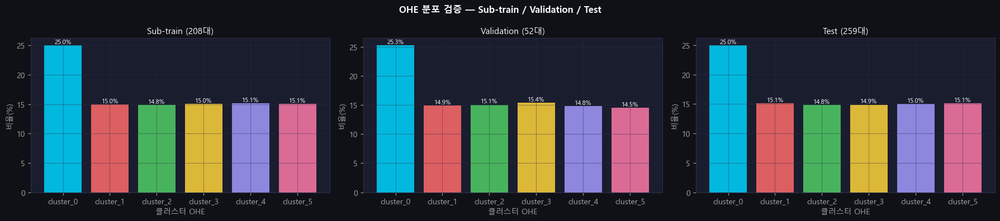

Sub-train OHE 정합성: ✅ 모든 행 합=1
Validation OHE 정합성: ✅ 모든 행 합=1
Test OHE 정합성: ✅ 모든 행 합=1


In [51]:
OHE_COLS = [f'cluster_{i}' for i in range(N_CLUSTERS)]

def add_ohe_cluster(df, all_ohe_cols=OHE_COLS):
    ohe = pd.get_dummies(df['op_cluster'], prefix='cluster').astype(np.float32)
    for col in all_ohe_cols:
        if col not in ohe.columns: ohe[col] = np.float32(0.0)
    return pd.concat([df.reset_index(drop=True), ohe[all_ohe_cols].reset_index(drop=True)], axis=1)

subtrain_ml = add_ohe_cluster(subtrain_ml)
valid_ml    = add_ohe_cluster(valid_ml)
test_ml     = add_ohe_cluster(test_ml)
ML_FEATURES = ML_FEATURES + OHE_COLS

print(f'=== OHE 완료 ===')
print(f'추가된 OHE 컬럼: {OHE_COLS}')
print(f'ML_FEATURES: {len(ML_FEATURES) - N_CLUSTERS}개 → {len(ML_FEATURES)}개')

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
fig.suptitle('OHE 분포 검증 — Sub-train / Validation / Test', fontsize=12, fontweight='bold')
for ax, (df_name, df_chk) in zip(axes,[('Sub-train',subtrain_ml),('Validation',valid_ml),('Test',test_ml)]):
    ohe_sums = df_chk[OHE_COLS].sum()
    pcts = ohe_sums/ohe_sums.sum()*100
    bars = ax.bar(OHE_COLS, pcts.values, color=CLUSTER_COLORS, alpha=0.85)
    ax.set_title(f'{df_name} ({df_chk["unit_nr"].nunique()}대)')
    ax.set_xlabel('클러스터 OHE'); ax.set_ylabel('비율(%)')
    for bar, v in zip(bars, pcts.values):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3, f'{v:.1f}%', ha='center', fontsize=8)
plt.tight_layout(); plt.show()

for df_name, df_chk in [('Sub-train',subtrain_ml),('Validation',valid_ml),('Test',test_ml)]:
    ok = (df_chk[OHE_COLS].sum(axis=1)==1).all()
    print(f'{df_name} OHE 정합성: {"✅ 모든 행 합=1" if ok else "❌ 오류"}')


### 14-2. ML 다중공선성 확인

=== ML 다중공선성 확인 (|r|>0.95) ===
|r|≥0.95 쌍: 286개


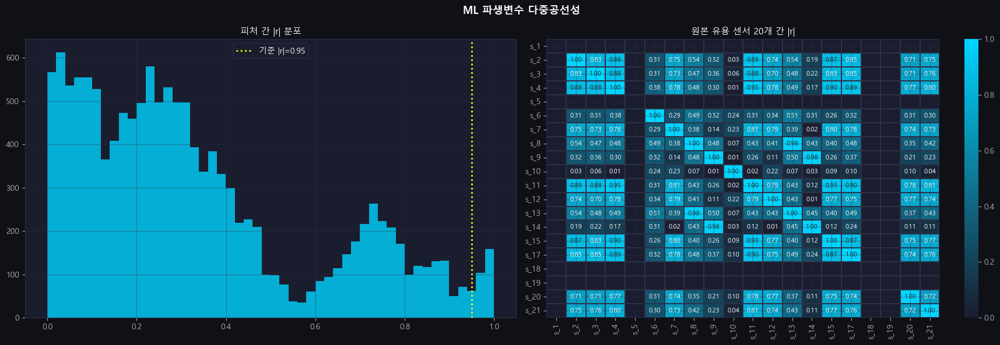

,피처A,피처B,|r|
0,s_10_roll5,s_10_ema5,0.999688
1,s_14_roll5,s_14_ema5,0.999678
2,s_13_roll5,s_13_ema5,0.999648
3,s_8_roll5,s_8_ema5,0.999640
4,s_9_roll5,s_9_ema5,0.999610
5,s_11_roll5,s_11_ema5,0.999282
6,s_10_roll3,s_10_ema5,0.999273
7,s_15_roll5,s_15_ema5,0.998953
8,s_4_roll5,s_4_ema5,0.998888
9,s_10_lag1,s_10_roll3,0.998872


In [52]:
print(f'=== ML 다중공선성 확인 (|r|>0.95) ===')
corr_ml   = subtrain_ml[ML_FEATURES].corr().abs()
upper_ml  = corr_ml.where(np.triu(np.ones(corr_ml.shape),k=1).astype(bool))
HIGH_THR  = 0.95
high_pairs_ml = (upper_ml.stack().reset_index()
                 .rename(columns={'level_0':'피처A','level_1':'피처B',0:'|r|'})
                 .query('`|r|` >= @HIGH_THR')
                 .sort_values('|r|',ascending=False).reset_index(drop=True))
print(f'|r|≥{HIGH_THR} 쌍: {len(high_pairs_ml)}개')

cmap_mc = LinearSegmentedColormap.from_list('mc',['#1a1d2e','#00d4ff'],N=256)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('ML 파생변수 다중공선성', fontsize=13, fontweight='bold')
all_upper_vals = upper_ml.stack().values
axes[0].hist(all_upper_vals, bins=50, color=C[0], alpha=0.8, edgecolor='none')
axes[0].axvline(HIGH_THR, color='yellow', lw=2, ls=':', label=f'기준 |r|={HIGH_THR}')
axes[0].set_title('피처 간 |r| 분포'); axes[0].legend()
corr_orig = subtrain_ml[USEFUL_SENSORS].corr().abs()
sns.heatmap(corr_orig, ax=axes[1], cmap=cmap_mc, vmin=0, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':8},
            linewidths=0.3, linecolor=GRID)
axes[1].set_title(f'원본 유용 센서 {len(USEFUL_SENSORS)}개 간 |r|')
plt.tight_layout(); plt.show()
display(high_pairs_ml.head(20))


---
## 15. [DL 분기] 슬라이딩 윈도우 생성 → Long Format CSV

| 파라미터 | 값 | FD001 대비 |
|---|---|---|
| `WINDOW_SIZE` | **20** | 30 → 20 (클러스터 최소 사이클 12~28 고려) |
| DL 피처 | **26채널** (센서 20 + OHE 6) | 14 → 26 |
| 타깃 | 마지막 timestep의 RUL | 동일 |


DL_FEATURES: 센서 20개 + OHE 6개 = 26채널
X_subtrain_dl : (39512, 20, 26)  ← (샘플, 20, 26채널)
X_valid_dl    : (9307, 20, 26)
X_test_dl     : (259, 20, 26)


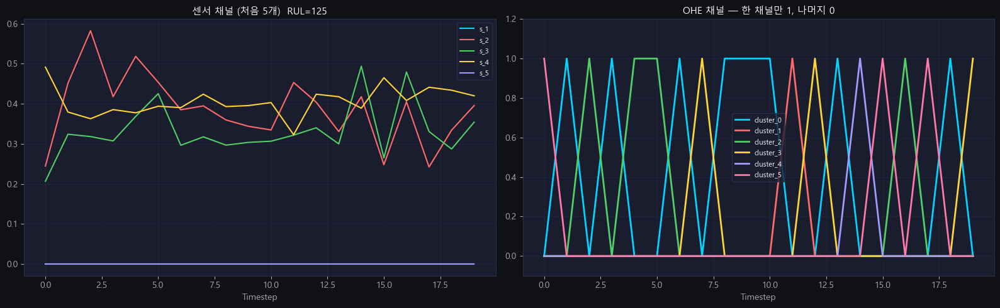

OHE 정합성: ✅

Long Format: subtrain=(790240, 29)  valid=(186140, 29)  test=(5180, 29)


In [53]:
def create_sliding_windows(df, feature_cols, target_col=None, window_size=WINDOW_SIZE, step=STEP):
    X_list, y_list = [], []
    for uid in np.sort(df['unit_nr'].unique()):
        udf  = df[df['unit_nr']==uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)
        tgt  = udf[target_col].values if target_col else None
        n    = len(data)
        for start in range(0, n-window_size+1, step):
            end = start+window_size
            X_list.append(data[start:end])
            if tgt is not None: y_list.append(tgt[end-1])
    X = np.array(X_list, dtype=np.float32)
    y = np.array(y_list, dtype=np.float32) if y_list else None
    return X, y

def create_test_windows(df, feature_cols, rul_series, window_size=WINDOW_SIZE):
    X_list, y_list = [], []
    for i, uid in enumerate(np.sort(df['unit_nr'].unique())):
        udf  = df[df['unit_nr']==uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)
        if len(data)>=window_size: X_list.append(data[-window_size:])
        else:
            pad = np.zeros((window_size-len(data),len(feature_cols)), dtype=np.float32)
            X_list.append(np.vstack([pad, data]))
        y_list.append(float(rul_series.iloc[i]))
    return np.array(X_list, dtype=np.float32), np.array(y_list, dtype=np.float32)

def windows_to_long_df(X, y, feature_cols):
    n_samples, win_size, n_feat = X.shape
    sample_id = np.repeat(np.arange(n_samples), win_size)
    timestep  = np.tile(np.arange(win_size), n_samples)
    flat = X.reshape(n_samples*win_size, n_feat)
    df = pd.DataFrame(flat, columns=list(feature_cols))
    df.insert(0,'timestep',timestep); df.insert(0,'sample_id',sample_id)
    df['RUL'] = np.repeat(np.asarray(y, dtype=np.float32), win_size)
    return df

# DL용 OHE 추가
subtrain_dl = add_ohe_cluster(subtrain_s4)
valid_dl    = add_ohe_cluster(valid_s4)
test_dl     = add_ohe_cluster(test_s4)

DL_FEATURES = USEFUL_SENSORS + OHE_COLS
print(f'DL_FEATURES: 센서 {len(USEFUL_SENSORS)}개 + OHE {len(OHE_COLS)}개 = {len(DL_FEATURES)}채널')

X_subtrain_dl, y_subtrain_dl = create_sliding_windows(subtrain_dl, DL_FEATURES, 'RUL')
X_valid_dl,    y_valid_dl    = create_sliding_windows(valid_dl,    DL_FEATURES, 'RUL')
X_test_dl,     y_test_dl     = create_test_windows(  test_dl,     DL_FEATURES, rul_df['RUL'])

print(f'X_subtrain_dl : {X_subtrain_dl.shape}  ← (샘플, {WINDOW_SIZE}, {len(DL_FEATURES)}채널)')
print(f'X_valid_dl    : {X_valid_dl.shape}')
print(f'X_test_dl     : {X_test_dl.shape}')

# OHE 채널 검증
sample_window = X_subtrain_dl[0]
ohe_channels  = sample_window[:, len(USEFUL_SENSORS):]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
for fi in range(min(5, len(USEFUL_SENSORS))):
    axes[0].plot(sample_window[:,fi], color=C[fi], lw=1.5, label=USEFUL_SENSORS[fi])
axes[0].set_title(f'센서 채널 (처음 5개)  RUL={y_subtrain_dl[0]:.0f}')
axes[0].set_xlabel('Timestep'); axes[0].legend(fontsize=8)

for ci in range(N_CLUSTERS):
    axes[1].plot(ohe_channels[:,ci], color=CLUSTER_COLORS[ci], lw=2, label=f'cluster_{ci}')
axes[1].set_title('OHE 채널 — 한 채널만 1, 나머지 0')
axes[1].set_xlabel('Timestep'); axes[1].set_ylim(-0.1,1.2); axes[1].legend(fontsize=8)
plt.tight_layout(); plt.show()

ok = np.all(ohe_channels.sum(axis=1)==1)
print(f'OHE 정합성: {"✅" if ok else "❌"}')

dl_subtrain_long = windows_to_long_df(X_subtrain_dl, y_subtrain_dl, DL_FEATURES)
dl_valid_long    = windows_to_long_df(X_valid_dl,    y_valid_dl,    DL_FEATURES)
dl_test_long     = windows_to_long_df(X_test_dl,     y_test_dl,     DL_FEATURES)
print(f'\nLong Format: subtrain={dl_subtrain_long.shape}  valid={dl_valid_long.shape}  test={dl_test_long.shape}')


### 15-1. val_eval 생성 — 수명 50~90% 랜덤 절단 (seed=42)

=== val_eval 생성 (수명 50~90% 절단, seed=42) ===
기존 val_eval RUL 평균: 0.0 (≈0에 가까움)
개선 val_eval RUL 평균: 61.7 (test 분포와 유사)


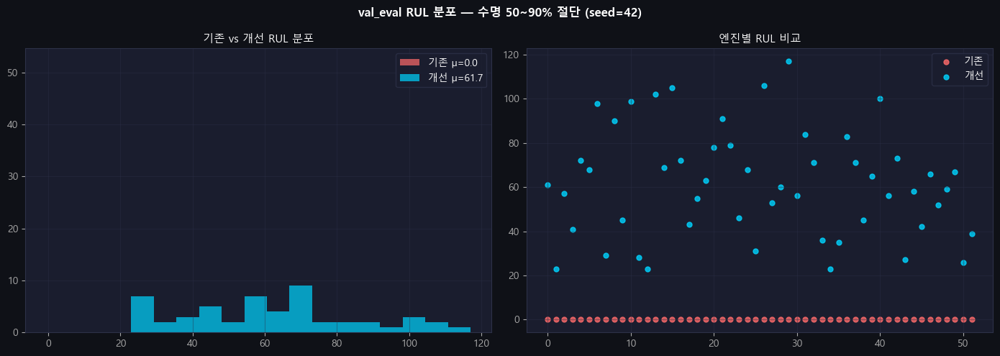

✅ val_eval 생성 완료


In [54]:
print('=== val_eval 생성 (수명 50~90% 절단, seed=42) ===')

WINDOW_SIZE_VE = 20
rng = np.random.RandomState(42)

# valid_s4에 OHE 컬럼 동기화
for _col in OHE_COLS:
    if _col not in valid_s4.columns:
        _ohe = pd.get_dummies(valid_s4['op_cluster'], prefix='cluster', dtype=float)
        for _c in OHE_COLS:
            valid_s4[_c] = _ohe[_c].values if _c in _ohe.columns else 0.0
        break

ml_val_eval_rows, dl_val_eval_X, dl_val_eval_y = [], [], []

for uid in np.sort(valid_s4['unit_nr'].unique()):
    udf     = valid_s4[valid_s4['unit_nr']==uid].sort_values('time_cycles').reset_index(drop=True)
    n       = len(udf)
    cut_idx = max(WINDOW_SIZE_VE, min(int(n*rng.uniform(0.5, 0.9)), n))

    cut_time  = udf.iloc[cut_idx-1]['time_cycles']
    ml_uid_df = valid_ml[valid_ml['unit_nr']==uid].sort_values('time_cycles').reset_index(drop=True)
    ml_match  = ml_uid_df[ml_uid_df['time_cycles']==cut_time]
    if len(ml_match)>0: ml_val_eval_rows.append(ml_match.iloc[0].copy())
    else: ml_val_eval_rows.append(ml_uid_df.iloc[min(cut_idx-1,len(ml_uid_df)-1)].copy())

    _avail = [f for f in DL_FEATURES if f in udf.columns]
    data   = udf[_avail].values.astype(np.float32)
    window = data[max(0, cut_idx-WINDOW_SIZE_VE):cut_idx]
    if len(window)<WINDOW_SIZE_VE:
        pad = np.zeros((WINDOW_SIZE_VE-len(window),len(_avail)),dtype=np.float32)
        window = np.vstack([pad, window])
    dl_val_eval_X.append(window)
    dl_val_eval_y.append(float(udf['RUL'].iloc[cut_idx-1]))

val_eval_ml      = pd.DataFrame(ml_val_eval_rows).reset_index(drop=True)
X_ve             = np.array(dl_val_eval_X, dtype=np.float32)
y_ve             = np.array(dl_val_eval_y, dtype=np.float32)
_dl_feats_ve     = [f for f in DL_FEATURES if f in valid_s4.columns]
dl_val_eval_long = windows_to_long_df(X_ve, y_ve, _dl_feats_ve)

old_rul = np.array([float(valid_s4[valid_s4['unit_nr']==uid].sort_values('time_cycles')['RUL'].iloc[-1])
                    for uid in np.sort(valid_s4['unit_nr'].unique())])
print(f'기존 val_eval RUL 평균: {old_rul.mean():.1f} (≈0에 가까움)')
print(f'개선 val_eval RUL 평균: {y_ve.mean():.1f} (test 분포와 유사)')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('val_eval RUL 분포 — 수명 50~90% 절단 (seed=42)', fontweight='bold')
axes[0].hist(old_rul, bins=15, color=C[1], alpha=0.7, label=f'기존 μ={old_rul.mean():.1f}')
axes[0].hist(y_ve,    bins=15, color=C[0], alpha=0.7, label=f'개선 μ={y_ve.mean():.1f}')
axes[0].set_title('기존 vs 개선 RUL 분포'); axes[0].legend()
axes[1].scatter(range(len(old_rul)), old_rul, color=C[1], s=25, alpha=0.8, label='기존')
axes[1].scatter(range(len(y_ve)),   y_ve,     color=C[0], s=25, alpha=0.8, label='개선')
axes[1].set_title('엔진별 RUL 비교'); axes[1].legend()
plt.tight_layout(); plt.show()
print('✅ val_eval 생성 완료')
